In [1]:
import os
import re
import sys

import itertools
import textwrap
import numpy as np
import pandas as pd
import scanpy as sc

import gseapy as gp

from scipy.stats import zscore, probplot
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from matplotlib.lines import Line2D
import seaborn as sns

from pycirclize import Circos
from pycirclize.utils import load_eukaryote_example_dataset

import pytorch_lightning as pl

pl.seed_everything(32)

sys.path.append("/data/danai/scripts/LIVI/")
from src.analysis._utils import calculate_DxC_effect, calculate_DxC_gene_effect
from src.analysis.plotting import make_gp_dotplot, plot_ct_gex_vs_gt, plot_gene_loadings_for_factor, plot_gene_loadings_for_associated_variable

Seed set to 32
/data/danai/miniforge3/envs/LIVIenv_py311/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Seed set to 32


In [2]:
adata = sc.read_h5ad("/data/danai/Data/OneK1K/LogNorm_counts_across_celltypes_DCRM_protein-coding_Azimuth_only-immune-cells_HVG-HEX-10K.h5ad")
adata

AnnData object with n_obs × n_vars = 1172790 × 14212
    obs: 'orig_ident', 'nCount_RNA', 'nFeature_RNA', 'pool', 'individual', 'percent_mt', 'latent', 'nCount_SCT', 'nFeature_SCT', 'cell_type', 'cell_label', 'sex', 'age', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_MITO', 'log1p_total_counts_MITO', 'pct_counts_MITO', 'total_counts_RIBO', 'log1p_total_counts_RIBO', 'pct_counts_RIBO', 'total_counts_ERCC', 'log1p_total_counts_ERCC', 'pct_counts_ERCC', 'n_genes', 'Norm_factors', 'major_celltype', 'predicted_celltype_l0', 'predicted_celltype_l1', 'predicted_celltype_l2', 'original_celltype', 'new_predicted_celltype_l2', 'new_predicted_celltype_l0', 'new_predicted_celltype_l1'
    var: 'GeneSymbol', 'features', 'MITO', 'RIBO', 'ERCC', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'downregulated_NK', '

In [3]:
gene_anno = pd.read_csv("/data/danai/Data/OneK1K/OneK1K_HVG-HEX-10K_geneIDs_Biomart.txt", sep="\t", index_col=0)
gene_anno.rename(columns={"Gene stable ID":"feature_id", 
                         "Gene name":"gene_name",
                         "Chromosome/scaffold name":"gene_chromosome", 
                         "Gene start (bp)":"gene_start", 
                         "Gene end (bp)":"gene_end"},
                inplace=True)
gene_anno

,gene_start,gene_chromosome,gene_end,gene_name
Gene stable ID,,,,
ENSG00000000419,49551404,20,49575092,DPM1
ENSG00000000457,169818772,1,169863408,SCYL3
ENSG00000000460,169631245,1,169823221,C1orf112
ENSG00000000938,27938575,1,27961788,FGR
ENSG00000000971,196621008,1,196716634,CFH
...,...,...,...,...
ENSG00000273269,47293080,2,47403650,RP11-761B3.1
ENSG00000273274,32930670,1,32962287,ZBTB8B
ENSG00000273294,33987279,5,34124633,RP11-1084J3.4


In [4]:
adata.var.GeneSymbol = adata.var.GeneSymbol.str.strip()
adata.var = adata.var.merge(gene_anno.filter(["gene_chromosome", "gene_start", "gene_end"]), right_index=True, left_index=True)
adata.var = adata.var.assign(upstream_5MB = adata.var.apply(lambda x: max(0, x.gene_start - 5000000), axis=1),
                             downstream_5MB = adata.var.apply(lambda x: x.gene_end + 5000000, axis=1))
adata.var

,GeneSymbol,features,MITO,RIBO,ERCC,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,...,downregulated_B,upregulated_Mono,downregulated_Mono,upregulated_DC,downregulated_DC,gene_chromosome,gene_start,gene_end,upstream_5MB,downstream_5MB
ENSG00000257019,OR13C2,OR13C2,False,False,False,3,0.000002,0.000002,99.999764,3.0,...,False,False,False,False,False,9,107366924,107367951,102366924,112367951
ENSG00000166987,MBD6,MBD6,False,False,False,34604,0.027840,0.027459,97.280605,35426.0,...,True,True,False,False,True,12,57914493,57923931,52914493,62923931
ENSG00000170624,SGCD,SGCD,False,False,False,1844,0.001487,0.001486,99.855087,1892.0,...,True,True,True,False,True,5,155297354,156194799,150297354,161194799
ENSG00000140519,RHCG,RHCG,False,False,False,2,0.000002,0.000002,99.999843,2.0,...,False,False,False,False,False,15,89998680,90039844,84998680,95039844
ENSG00000117115,PADI2,PADI2,False,False,False,2728,0.002279,0.002276,99.785617,2900.0,...,True,True,False,True,True,1,17393256,17445948,12393256,22445948
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000185811,IKZF1,IKZF1,False,False,False,338926,0.332737,0.287235,73.365114,423404.0,...,True,True,True,False,True,7,50343720,50472799,45343720,55472799
ENSG00000234465,PINLYP,PINLYP,False,False,False,3098,0.002490,0.002487,99.756540,3168.0,...,False,False,False,False,False,19,44080952,44088116,39080952,49088116
ENSG00000170615,SLC26A5,SLC26A5,False,False,False,685,0.000540,0.000540,99.946168,687.0,...,False,False,False,False,False,7,102993177,103086624,97993177,108086624
ENSG00000151778,SERP2,SERP2,False,False,False,2513,0.002013,0.002011,99.802513,2561.0,...,True,True,True,False,True,13,44947801,44971850,39947801,49971850


In [5]:
# COLORS FROM THE ORIGINAL PUBLICATION
cell_label_colors = {
    "CD4 SOX4": "#D6C1DE", # SOX4+ CD4 T cells
    "CD4 NC": "#882E72", # CD4 naive T cells
    "CD4 ET": "#B178A6", # CD4 effector T cells
    "CD8 NC": "#5289C7", # CD8 naive T cells
    "CD8 S100B": "#7BAFDE", # S100B+ CD8 cells
    "CD8 ET": "#1965B0", # CD8 effector cells 
    "NK": "#4EB265",
    "NK R": "#90C987", # NK recruiting cells
    "B IN": "#F6C141",
    "B Mem": "#F7EE55",
    "Mono C": "#F1932D", # classical monocytes
    "Mono NC": "#E8601C", # non-classical monocytes
    "DC": "#DC050C",
    "Plasma": "#CAE0AB",
}

# matching colros for major (L1) celltype
major_celltype_colors = {
    "CD4T": "darkmagenta",
    "CD8T": "steelblue", 
    "NK": "mediumseagreen",
    "B": "gold",
    "Mono": "orange",
    "DC": "#DC050C",
    "Plasma": "#CAE0AB",
}

In [6]:
adata.uns["cell_label_colors"] = [cell_label_colors[ct] for ct in adata.obs.cell_label.cat.categories]

In [7]:
background_genes = adata.var.GeneSymbol

# databases_bio = ["GO_Biological_Process_2023", "Elsevier_Pathway_Collection",  "GO_Molecular_Function_2023", "KEGG_2021_Human", "Reactome_2022"] 
databases_bio = ["GO_Biological_Process_2023", "GO_Molecular_Function_2023", "KEGG_2021_Human", "Reactome_2022"] 

In [8]:
cis_eQTLGen_hvgs = pd.read_csv("/data/danai/Data/eQTLGen_cis-eQTLs_trans-eQTLGen-disease-associated-SNPs_OneK1K-10K-HVG-HEX.tsv", sep="\t")
cis_eQTLGen_hvgs.head()

,Pvalue,SNP,SNPChr,SNPPos,AssessedAllele,OtherAllele,Zscore,Gene,GeneSymbol,GeneChr,GenePos,NrCohorts,NrSamples,FDR,BonferroniP,snp_id
0,3.271700e-310,rs2910686,5,96252589,C,T,163.6570,ENSG00000164308,ERAP2,5,96233531,34,26454,0.0,4.166200e-302,5:96252589
1,3.271700e-310,rs27290,5,96350088,G,A,160.0384,ENSG00000164308,ERAP2,5,96233531,35,26568,0.0,4.166200e-302,5:96350088
2,3.271700e-310,rs1363907,5,96252803,A,G,151.8370,ENSG00000164308,ERAP2,5,96233531,34,26454,0.0,4.166200e-302,5:96252803
3,3.271700e-310,rs2549794,5,96244549,C,T,150.5419,ENSG00000164308,ERAP2,5,96233531,33,26070,0.0,4.166200e-302,5:96244549
4,3.271700e-310,rs4761234,12,69732105,C,T,-143.3691,ENSG00000090382,LYZ,12,69745067,35,31353,0.0,4.166200e-302,12:69732105


In [9]:
trans_eQTLGen_sign = pd.read_csv("/data/danai/Data/OneK1K/trans-eQTLGen-FDR005_OneK1K.tsv", sep="\t")
trans_eQTLGen_sign = trans_eQTLGen_sign.assign(snp_id = [i[0]+":"+i[1] for i in trans_eQTLGen_sign.SNP_id1.str.split("_")])
trans_eQTLGen_sign = trans_eQTLGen_sign.assign(QTL = trans_eQTLGen_sign.apply(lambda x: x.Gene+"-"+x.snp_id, axis=1))
trans_eQTLGen_sign.head()

,Pvalue,SNP,SNPChr,SNPPos,AssessedAllele,OtherAllele,Zscore,Gene,GeneSymbol,GeneChr,GenePos,NrCohorts,NrSamples,FDR,BonferroniP,SNP_id1,SNP_id2,snp_id,QTL
0,1.128895e-308,rs1354034,3,56849749,T,C,-57.2518,ENSG00000163736,PPBP,4,74853334,37,31684,0.0,6.659500e-302,3_56849749_T_C,3_56849749_C_T,3:56849749,ENSG00000163736-3:56849749
1,1.128895e-308,rs1354034,3,56849749,T,C,-50.8175,ENSG00000198478,SH3BGRL2,6,80377186,37,31684,0.0,6.659500e-302,3_56849749_T_C,3_56849749_C_T,3:56849749,ENSG00000198478-3:56849749
2,1.128895e-308,rs1354034,3,56849749,T,C,-50.6486,ENSG00000005961,ITGA2B,17,42458210,36,31470,0.0,6.659500e-302,3_56849749_T_C,3_56849749_C_T,3:56849749,ENSG00000005961-3:56849749
3,1.128895e-308,rs1354034,3,56849749,T,C,-49.9996,ENSG00000122786,CALD1,7,134542241,36,31644,0.0,6.659500e-302,3_56849749_T_C,3_56849749_C_T,3:56849749,ENSG00000122786-3:56849749
4,1.128895e-308,rs1354034,3,56849749,T,C,-45.3023,ENSG00000166091,CMTM5,14,23847499,37,31684,0.0,6.659500e-302,3_56849749_T_C,3_56849749_C_T,3:56849749,ENSG00000166091-3:56849749


In [10]:
tensorqtl_results = pd.read_csv("/data/danai/Data/OneK1K/Benchmarks/TensorQTL/All_celltypes_results_tensorQTL_significant_BH_005.tsv", sep="\t")
tensorqtl_results.head()

,SNP_id,gene,p_value,effect_size,effect_size_se,ref_allele,alt_allele,celltype,Storey_q,BH_corrected_pvalue,BY_corrected_pvalue
0,1:3091587,ENSG00000129691,1.626467e-07,0.379141,0.071849,C,T,CD4-ET,0.016391,0.016391,0.357406
1,1:4193551,ENSG00000226209,2.383485e-08,0.137090,0.024354,G,A,CD4-ET,0.003805,0.003805,0.082976
2,1:4668670,ENSG00000184925,2.701358e-07,0.250460,0.048347,G,A,CD4-ET,0.023879,0.023879,0.520671
3,1:11171226,ENSG00000270800,2.312485e-08,0.116015,0.020590,C,T,CD4-ET,0.003718,0.003718,0.081068
4,1:11280994,ENSG00000270800,2.312485e-08,0.116015,0.020590,T,C,CD4-ET,0.003718,0.003718,0.081068


In [11]:
GT_matrix = pd.read_csv("/data/danai/Data/OneK1K/GT_matrix_trans-eQTLGen_in_OneK1K.tsv", sep="\t", index_col=0)
GT_matrix.head()

,1_1,2_2,3_3,4_4,6_6,7_7,8_8,9_9,10_10,11_11,...,1079_1080,1080_1081,1081_1082,1083_1084,1084_1085,1096_845_2,1100_914_2,1102_932_2,1103_926_2,1104_920_2
SNP_id,,,,,,,,,,,,,,,,,,,,,
1_1247494_C_T,2.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,2.0,2.0,...,2.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,1.0
1_1894284_T_C,2.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,2.0,...,2.0,1.0,1.0,2.0,1.0,2.0,2.0,2.0,0.0,1.0
1_2069172_C_T,2.0,2.0,1.0,2.0,1.0,0.0,0.0,0.0,1.0,2.0,...,1.0,1.0,1.0,1.0,1.0,0.0,2.0,1.0,2.0,2.0
1_2146165_C_A,2.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0
1_2233961_G_A,1.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,...,2.0,1.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0


In [12]:
hg_mapping = pd.read_csv("/data/danai/Data/OneK1K/trans-eQTL-Gen_liftOver_results.tsv", sep="\t")
hg_mapping.head()

,SNP_id_hg38,SNP_id_hg19
0,1:1312114,1:1247494
1,1:1962845,1:1894284
2,1:2137733,1:2069172
3,1:2214726,1:2146165
4,1:2302522,1:2233961


In [13]:
rsids = pd.read_csv("/data/danai/Data/OneK1K/ALL_chroms.dose.filtered.R2_0.8_001MAF_HWE_trans-eQTLGen_rsIDs.bim",
                    sep="\t", index_col=False, names=["chr", "rsID", "bla", "position", "a0", "a1"])
rsids.head()

,chr,rsID,bla,position,a0,a1
0,1,1:1247494,0,1247494,T,C
1,1,rs4648739,0,1894284,C,T
2,1,rs425277,0,2069172,T,C
3,1,rs78265569,0,2146165,A,C
4,1,rs11576356,0,2233961,A,G


In [14]:
rsids = rsids.assign(SNP_id_hg19 = rsids.chr.astype(str) + ":" + rsids.position.astype(str))
rsids.head()

,chr,rsID,bla,position,a0,a1,SNP_id_hg19
0,1,1:1247494,0,1247494,T,C,1:1247494
1,1,rs4648739,0,1894284,C,T,1:1894284
2,1,rs425277,0,2069172,T,C,1:2069172
3,1,rs78265569,0,2146165,A,C,1:2146165
4,1,rs11576356,0,2233961,A,G,1:2233961


In [15]:
snp_mapping = hg_mapping.merge(rsids.filter(["SNP_id_hg19", "rsID", "a0", "a1"]), how="left", on="SNP_id_hg19")
snp_mapping.head()

,SNP_id_hg38,SNP_id_hg19,rsID,a0,a1
0,1:1312114,1:1247494,1:1247494,T,C
1,1:1962845,1:1894284,rs4648739,C,T
2,1:2137733,1:2069172,rs425277,T,C
3,1:2214726,1:2146165,rs78265569,A,C
4,1:2302522,1:2233961,rs11576356,A,G


In [16]:
snp_mapping = snp_mapping.drop_duplicates()
snp_mapping.shape

(9310, 5)

In [17]:
snp_mapping.rsID.nunique()

9304

In [18]:
snp_mapping.SNP_id_hg38.nunique()

9298

In [19]:
snp_mapping.SNP_id_hg19.nunique()

9298

In [20]:
SNP_dict = dict(zip(GT_matrix.index, [i[0]+":"+i[1] for i in GT_matrix.index.str.split("_")]))
SNP_dict_inv = {v:k for k,v in SNP_dict.items()}

In [21]:
results_dir = "/data/danai/Data/OneK1K/LIVI2_testing_results/"
model = "2024-12-05_10-20_LIVIcis-cell-state_zdim15_700-gxc_5-persistent_60-0-warm-up_no-adversary_Gseed200_hvg-hex-10K_larger-encoder_best"
model_results_dir = os.path.join(results_dir, model)
os.path.isdir(model_results_dir)

True

In [22]:
sc.settings.figdir = os.path.join(model_results_dir, "Figures")

In [23]:
cell_state = pd.read_csv(os.path.join(model_results_dir,
                                    f"{model}_cell-state_latent.tsv"),
                               sep="\t", index_col=0)

In [24]:
umap_cc = pd.read_csv(
    os.path.join(model_results_dir, f"{model}_cell-state_latent_UMAP.tsv"),
sep="\t", index_col=0)
umap_cc.head()

,UMAP1,UMAP2
barcode,,
AAACCTGAGAATGTTG-1,11.114731,-0.032576
AAACCTGAGAGAACAG-1,7.623209,6.374956
AAACCTGAGCATGGCA-1,10.390140,-4.561501
AAACCTGAGTATTGGA-1,10.588090,4.197966
AAACCTGAGTGTCCCG-1,9.551620,4.313600


In [24]:
adata.obsm["X_umap"] = umap_cc.loc[adata.obs.index].to_numpy()

In [25]:
assignment_matrix = pd.read_csv(
    os.path.join(model_results_dir, f"{model}_factor_assignment_matrix.tsv"),
    sep="\t", index_col=0
)
assignment_matrix.columns = assignment_matrix.columns.str.replace("U_", "D_")
assignment_matrix.head()

,D_Factor1,D_Factor2,D_Factor3,D_Factor4,D_Factor5,D_Factor6,D_Factor7,D_Factor8,D_Factor9,D_Factor10,...,D_Factor691,D_Factor692,D_Factor693,D_Factor694,D_Factor695,D_Factor696,D_Factor697,D_Factor698,D_Factor699,D_Factor700
Cell-state_Factor1,8.437773e-07,7.903217e-08,0.000149,2.960464e-08,0.105288,9.999727e-01,5.675518e-07,0.958925,0.000287,0.000158,...,5.023212e-06,4.209568e-06,1.000000e+00,4.168299e-03,9.999992e-01,0.209136,0.078419,6.167789e-07,0.018491,0.140772
Cell-state_Factor2,1.292795e-06,6.067657e-08,0.000136,6.915393e-08,0.105908,1.794856e-02,5.106163e-07,0.115423,0.026317,0.000138,...,1.773568e-07,6.894123e-06,7.097198e-02,2.241115e-07,8.517019e-07,0.047724,0.001983,7.762388e-07,0.000035,0.041986
Cell-state_Factor3,9.953613e-07,6.230532e-08,0.000141,1.447328e-06,0.000004,4.638549e-07,9.892867e-01,0.965989,0.000585,0.000156,...,2.023449e-07,2.216382e-06,5.867200e-05,5.172464e-03,6.707507e-07,0.132809,0.001249,1.094831e-06,0.938939,0.154773
Cell-state_Factor4,6.680752e-07,6.124807e-02,0.000136,3.778137e-08,0.011434,4.063994e-07,9.991040e-01,0.019197,0.008096,0.000136,...,2.121831e-07,3.456871e-07,4.101363e-08,3.866343e-07,6.646220e-07,0.102437,0.012960,7.976132e-07,0.000011,0.032869
Cell-state_Factor5,4.728630e-06,2.615931e-08,0.000146,6.789284e-04,0.123782,2.302163e-07,5.004259e-07,1.000000,0.305943,0.000152,...,8.162028e-08,3.348259e-02,3.075602e-08,2.127417e-07,4.462411e-07,0.080859,0.288426,5.094969e-07,0.029717,0.271452


In [26]:
D = pd.read_csv(
    os.path.join(model_results_dir, f"{model}_U_embedding.tsv"),
sep="\t", index_col=0)
D.columns = D.columns.str.replace("U_", "D_")
D.head()

,D_Factor1,D_Factor2,D_Factor3,D_Factor4,D_Factor5,D_Factor6,D_Factor7,D_Factor8,D_Factor9,D_Factor10,...,D_Factor691,D_Factor692,D_Factor693,D_Factor694,D_Factor695,D_Factor696,D_Factor697,D_Factor698,D_Factor699,D_Factor700
individual,,,,,,,,,,,,,,,,,,,,,
691_692,-1.042473,-3.014132,1.014801,1.139763,-0.087979,-0.651705,0.490216,-0.437837,-0.698968,-0.075018,...,-1.559727,-2.399024,-0.448335,-0.562907,1.627759,0.417358,-0.134628,0.011702,-0.679321,0.457391
693_694,0.204075,-1.975144,-0.909941,-3.882647,-2.031409,-1.043576,-0.600040,0.700274,-1.798226,1.284830,...,-4.333742,-0.440545,3.113877,-1.716786,-1.533546,0.933507,1.020350,0.339764,-1.053410,0.119764
688_689,-0.265995,-0.624907,-0.622831,-2.176815,0.853737,-0.117719,0.055314,0.302469,0.608836,-1.786304,...,-0.670751,-1.207303,8.913930,-0.353388,-0.325745,-1.125641,0.403694,-0.928585,0.525144,-0.484701
683_684,0.416159,-2.862958,-0.515983,1.572177,0.868042,-0.119366,-0.109651,0.556453,1.886532,-1.681124,...,-2.243293,-1.778274,0.387456,0.630929,-0.590417,0.165828,-2.937147,0.222008,-0.201923,0.057328
684_685,-1.244226,-4.169203,-0.287462,-0.519455,3.750650,-1.336222,0.230874,-0.624908,1.064494,0.636243,...,0.699778,-3.021685,-0.273128,-0.655736,-0.635290,0.228497,1.079147,-1.051518,0.797644,0.003049


In [27]:
GxC_effects = pd.read_csv(
    os.path.join(model_results_dir, f"{model}_LMM_results_BH-0.05_Ucontext.tsv"),
    sep="\t"
)
GxC_effects.Factor = GxC_effects.Factor.str.replace("U_", "D_")
GxC_effects

,Factor,SNP_id,effect_size,effect_size_se,p_value,assessed_allele,corrected_pvalue
0,D_Factor1,14:81884515,0.128089,0.029964,1.747683e-05,G,3.124271e-02
1,D_Factor5,19:58963530,0.585091,0.071890,1.218412e-16,G,8.928493e-13
2,D_Factor11,6:161111700,1.012741,0.201583,4.265749e-07,C,1.083497e-03
3,D_Factor12,3:39555580,0.505091,0.055674,1.831975e-20,A,1.759641e-16
4,D_Factor14,2:232579379,-0.201663,0.025578,1.112895e-15,G,7.537058e-12
...,...,...,...,...,...,...,...
3989,D_Factor696,6:35402805,2.013616,0.270934,4.697587e-14,C,2.723306e-10
3990,D_Factor698,22:37918472,0.315602,0.064524,8.591598e-07,T,2.062331e-03
3991,D_Factor698,22:38175477,0.298677,0.057110,1.387957e-07,T,3.829152e-04
3992,D_Factor700,2:102957291,-0.758697,0.154228,7.418975e-07,A,1.806789e-03


In [28]:
GxC_effects.SNP_id.nunique()

941

In [29]:
DxC_decoder = pd.read_csv(
    os.path.join(model_results_dir, f"{model}_GxC_decoder.tsv"),
    sep="\t", index_col=0
)
DxC_decoder.columns = DxC_decoder.columns.str.replace("GxC", "DxC")
DxC_decoder.head()

,DxC_Factor1,DxC_Factor2,DxC_Factor3,DxC_Factor4,DxC_Factor5,DxC_Factor6,DxC_Factor7,DxC_Factor8,DxC_Factor9,DxC_Factor10,...,DxC_Factor691,DxC_Factor692,DxC_Factor693,DxC_Factor694,DxC_Factor695,DxC_Factor696,DxC_Factor697,DxC_Factor698,DxC_Factor699,DxC_Factor700
Geneid,,,,,,,,,,,,,,,,,,,,,
ENSG00000257019,0.000003,-0.000156,0.000261,-0.000105,0.000109,-0.000148,0.000145,0.000002,0.000106,-0.000083,...,-0.000125,-0.000088,0.000062,-0.000037,-0.000043,-0.000013,-0.000199,-0.000141,0.000042,0.000049
ENSG00000166987,-0.000101,-0.000302,0.000002,-0.000025,0.000096,-0.000122,0.000290,-0.000218,-0.000033,0.000128,...,-0.000093,-0.000059,-0.000712,0.000007,-0.000217,0.000056,0.000027,0.000117,-0.000141,0.000014
ENSG00000170624,-0.000007,-0.000096,-0.000228,0.000753,-0.000033,-0.000042,-0.000032,0.001457,0.000291,-0.000079,...,-0.000690,0.000181,-0.004836,0.000014,-0.000040,0.000021,0.000080,0.000070,-0.000669,-0.000014
ENSG00000140519,0.000013,-0.000071,0.000062,-0.000007,-0.000070,0.000082,-0.000036,0.000126,-0.000059,-0.000021,...,0.000164,0.000251,-0.000099,0.000035,-0.000080,-0.000019,-0.000139,0.000042,-0.000011,-0.000129
ENSG00000117115,-0.000463,-0.000236,0.000113,-0.000527,0.000036,0.000147,-0.000130,-0.000716,-0.000064,0.000002,...,0.000046,0.000210,0.000123,-0.000185,-0.000235,0.000060,-0.000145,0.000712,-0.000128,-0.000025


In [30]:
# Rename SNPs for plotting
GxC_effects = GxC_effects.assign(SNP = GxC_effects.SNP_id)
GxC_effects = GxC_effects.assign(SNP_id = GxC_effects.SNP.map(SNP_dict_inv))
GxC_effects

,Factor,SNP_id,effect_size,effect_size_se,p_value,assessed_allele,corrected_pvalue,SNP
0,D_Factor1,14_81884515_G_A,0.128089,0.029964,1.747683e-05,G,3.124271e-02,14:81884515
1,D_Factor5,19_58963530_G_A,0.585091,0.071890,1.218412e-16,G,8.928493e-13,19:58963530
2,D_Factor11,6_161111700_C_T,1.012741,0.201583,4.265749e-07,C,1.083497e-03,6:161111700
3,D_Factor12,3_39555580_A_G,0.505091,0.055674,1.831975e-20,A,1.759641e-16,3:39555580
4,D_Factor14,2_232579379_G_A,-0.201663,0.025578,1.112895e-15,G,7.537058e-12,2:232579379
...,...,...,...,...,...,...,...,...
3989,D_Factor696,6_35402805_C_A,2.013616,0.270934,4.697587e-14,C,2.723306e-10,6:35402805
3990,D_Factor698,22_37918472_T_C,0.315602,0.064524,8.591598e-07,T,2.062331e-03,22:37918472
3991,D_Factor698,22_38175477_T_G,0.298677,0.057110,1.387957e-07,T,3.829152e-04,22:38175477
3992,D_Factor700,2_102957291_A_G,-0.758697,0.154228,7.418975e-07,A,1.806789e-03,2:102957291


### SNPs discovered both by LIVI and tensor, but affecting one gene in tensor

In [31]:
effects_livi_and_tensor = GxC_effects.loc[GxC_effects.SNP.isin(tensorqtl_results.SNP_id)]
effects_livi_and_tensor.SNP_id.nunique()

337

In [32]:
effects_livi_and_tensor[["SNP_chrom", "SNP_pos"]] = effects_livi_and_tensor.SNP.str.split(":", expand=True)
effects_livi_and_tensor_not6 = effects_livi_and_tensor.loc[effects_livi_and_tensor.SNP_chrom != "6"]
effects_livi_and_tensor_not6.sort_values("effect_size", ascending=False).head(20)

/tmp/ipykernel_1795191/3179750561.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykernel_1795191/3179750561.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,Factor,SNP_id,effect_size,effect_size_se,p_value,assessed_allele,corrected_pvalue,SNP,SNP_chrom,SNP_pos
3968,D_Factor693,10_6027721_C_T,1.932845,0.433356,7.358653e-06,C,1.474512e-02,10:6027721,10,6027721
929,D_Factor132,22_38328597_A_G,1.907322,0.456366,2.690952e-05,A,4.488522e-02,22:38328597,22,38328597
1185,D_Factor277,21_47961386_G_A,1.612816,0.071615,2.806291e-157,G,1.016797e-151,21:47961386,21,47961386
1183,D_Factor277,21_47633789_C_G,1.109420,0.062396,5.562896e-85,C,5.415023e-80,21:47633789,21,47633789
996,D_Factor149,10_80949988_C_T,1.098771,0.262867,2.683985e-05,C,4.480339e-02,10:80949988,10,80949988
2150,D_Factor419,20_30294682_T_C,1.077166,0.238325,5.531662e-06,T,1.143976e-02,20:30294682,20,30294682
1200,D_Factor288,12_96858362_A_T,1.003554,0.231449,1.318861e-05,A,2.458971e-02,12:96858362,12,96858362
1172,D_Factor256,20_43042364_C_T,0.992034,0.224112,8.633160e-06,C,1.702589e-02,20:43042364,20,43042364
2977,D_Factor553,12_56435929_G_C,0.928163,0.122316,1.326351e-14,G,8.207141e-11,12:56435929,12,56435929
327,D_Factor57,1_45810865_G_A,0.919408,0.111662,5.215887e-17,G,3.937864e-13,1:45810865,1,45810865


In [33]:
effects_livi_and_tensor_not6.shape #.SNP_id.nunique()

(203, 10)

In [34]:
# Keep SNPs affecting only 1 factor
one2one = effects_livi_and_tensor_not6.groupby("SNP_id").apply(lambda x: x.Factor.nunique() ==1, include_groups=False)[
effects_livi_and_tensor_not6.groupby("SNP_id").apply(lambda x: x.Factor.nunique() ==1, include_groups=False)
].index
effects_livi_and_tensor_not6 = effects_livi_and_tensor_not6.loc[effects_livi_and_tensor_not6.SNP_id.isin(one2one)]

In [35]:
# SNPs associated only with a single-gene in tensor
spns1gene = tensorqtl_results.groupby("SNP_id").apply(lambda x: x.gene.nunique() == 1, include_groups=False)[
tensorqtl_results.groupby("SNP_id").apply(lambda x: x.gene.nunique() == 1, include_groups=False)].index

In [36]:
effects_livi_and_tensor_not6.loc[effects_livi_and_tensor_not6.SNP.isin(spns1gene)].SNP.nunique()

70

In [37]:
effects_livi_and_tensor.loc[effects_livi_and_tensor.SNP.isin(spns1gene)].SNP.nunique()

152

In [38]:
effects_livi_and_tensor_not6.loc[effects_livi_and_tensor_not6.SNP.isin(spns1gene)].sort_values("effect_size", ascending=False).head(20)

,Factor,SNP_id,effect_size,effect_size_se,p_value,assessed_allele,corrected_pvalue,SNP,SNP_chrom,SNP_pos
1132,D_Factor241,22_39747050_G_A,0.767126,0.039995,2.776586e-102,G,4.211306e-97,22:39747050,22,39747050
2065,D_Factor391,19_10350649_C_T,0.635794,0.075773,1.258048e-17,C,9.897305e-14,19:10350649,19,10350649
376,D_Factor67,17_27059666_A_T,0.502410,0.066056,1.148388e-14,A,7.139821e-11,17:27059666,17,27059666
1117,D_Factor232,8_22966769_A_G,0.485567,0.107709,5.850049e-06,A,1.203199e-02,8:22966769,8,22966769
1187,D_Factor282,7_72856269_G_A,0.474171,0.109614,1.382285e-05,G,2.560388e-02,7:72856269,7,72856269
1191,D_Factor282,7_72982874_C_T,0.468182,0.109837,1.848471e-05,C,3.270631e-02,7:72982874,7,72982874
1189,D_Factor282,7_72864869_A_G,0.464646,0.109492,2.014085e-05,A,3.518130e-02,7:72864869,7,72864869
1188,D_Factor282,7_72863249_T_G,0.464646,0.109492,2.014085e-05,T,3.518130e-02,7:72863249,7,72863249
1190,D_Factor282,7_72971231_C_T,0.455955,0.109736,3.000171e-05,C,4.903964e-02,7:72971231,7,72971231
1074,D_Factor185,4_155542248_C_T,0.411643,0.091827,6.604747e-06,C,1.344429e-02,4:155542248,4,155542248


## SNP 8:22966769 (rs12550612) on D232

In [39]:
snp_mapping.loc[snp_mapping.SNP_id_hg19 == "8:22966769"]

,SNP_id_hg38,SNP_id_hg19,rsID,a0,a1
4743,8:23109256,8:22966769,8:22966769,G,A


In [40]:
cis_eQTLGen_hvgs.loc[cis_eQTLGen_hvgs.snp_id == "8:22966769"] # associated with leukocyte count, myeloid white blood cell count, granulocyte count..; mapped gene TNFRSF10C

,Pvalue,SNP,SNPChr,SNPPos,AssessedAllele,OtherAllele,Zscore,Gene,GeneSymbol,GeneChr,GenePos,NrCohorts,NrSamples,FDR,BonferroniP,snp_id
722,3.271700e-310,rs12550612,8,22966769,G,A,48.9398,ENSG00000120889,TNFRSF10B,8,22902169,36,31470,0.0,4.166200e-302,8:22966769


/data/danai/scripts/LIVI/src/analysis/plotting.py:2487: UserWarning: Neither `cell_indices` nor `celltype` were provided.
Aggregating gene expression over all cells.


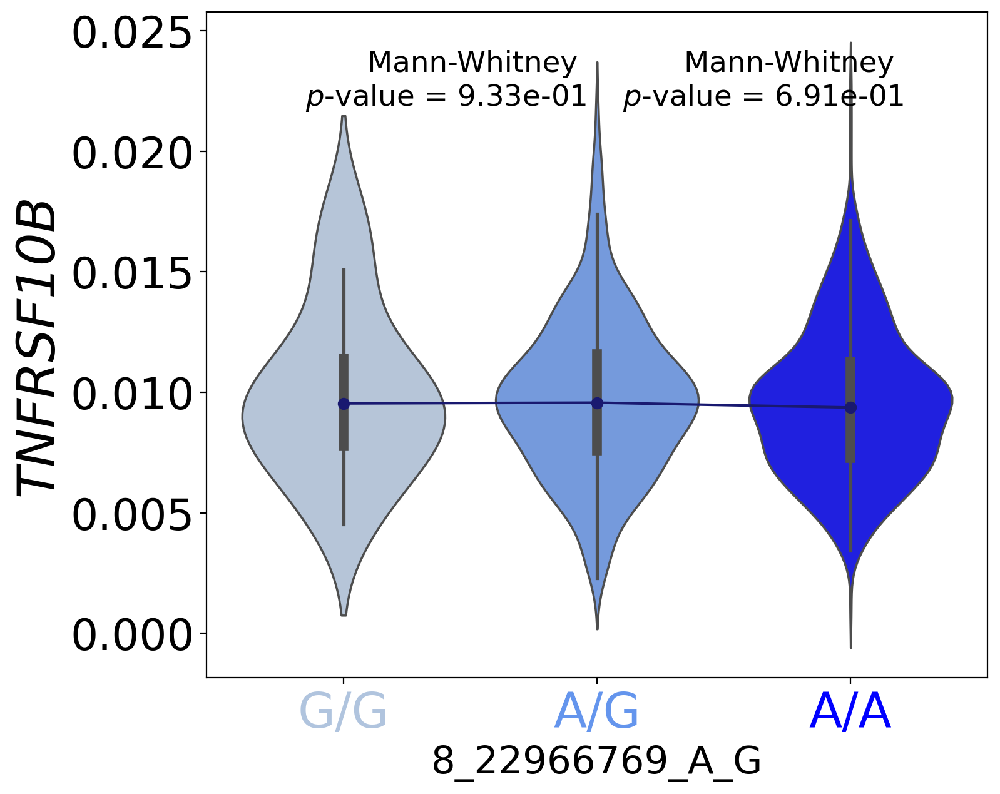

In [71]:
plot_ct_gex_vs_gt(
    adata=adata,
    gene="ENSG00000120889",
    filter_maf=False,
    annotation_fontsize=28,
    cell_indices=None,
    celltype=None,
    celltype_column="cell_label",
    iid_column="individual",
    GT_matrix=GT_matrix,
    SNP_id=SNP_dict_inv["8:22966769"],
    DxC_associations = GxC_effects,
    hgnc_column="GeneSymbol",
    savefig=True,
    output_dir=os.path.join(model_results_dir, "Figures"),
    output_prefix="All-cells",
    format="png",
)

In [41]:
trans_eQTLGen_sign.loc[trans_eQTLGen_sign.snp_id == "8:22966769"]

,Pvalue,SNP,SNPChr,SNPPos,AssessedAllele,OtherAllele,Zscore,Gene,GeneSymbol,GeneChr,GenePos,NrCohorts,NrSamples,FDR,BonferroniP,SNP_id1,SNP_id2,snp_id,QTL


In [42]:
rsid = cis_eQTLGen_hvgs.loc[cis_eQTLGen_hvgs.snp_id == "8:22966769"].SNP.iloc[0]
rsid

'rs12550612'

In [43]:
tensorqtl_results.loc[tensorqtl_results.SNP_id == "8:22966769"]

,SNP_id,gene,p_value,effect_size,effect_size_se,ref_allele,alt_allele,celltype,Storey_q,BH_corrected_pvalue,BY_corrected_pvalue
1747,8:22966769,ENSG00000101166,3.056044e-07,-0.13305,0.025801,A,G,CD4-NC,0.026117,0.026117,0.569476


In [44]:
adata.var.loc["ENSG00000101166"].filter(like="ene")

GeneSymbol            SLMO2
gene_chromosome          20
gene_start         57608200
gene_end           57617964
Name: ENSG00000101166, dtype: object

In [45]:
DxC_decoder["DxC_Factor232"].abs().sort_values(ascending=False).index.get_loc("ENSG00000101166")

2817

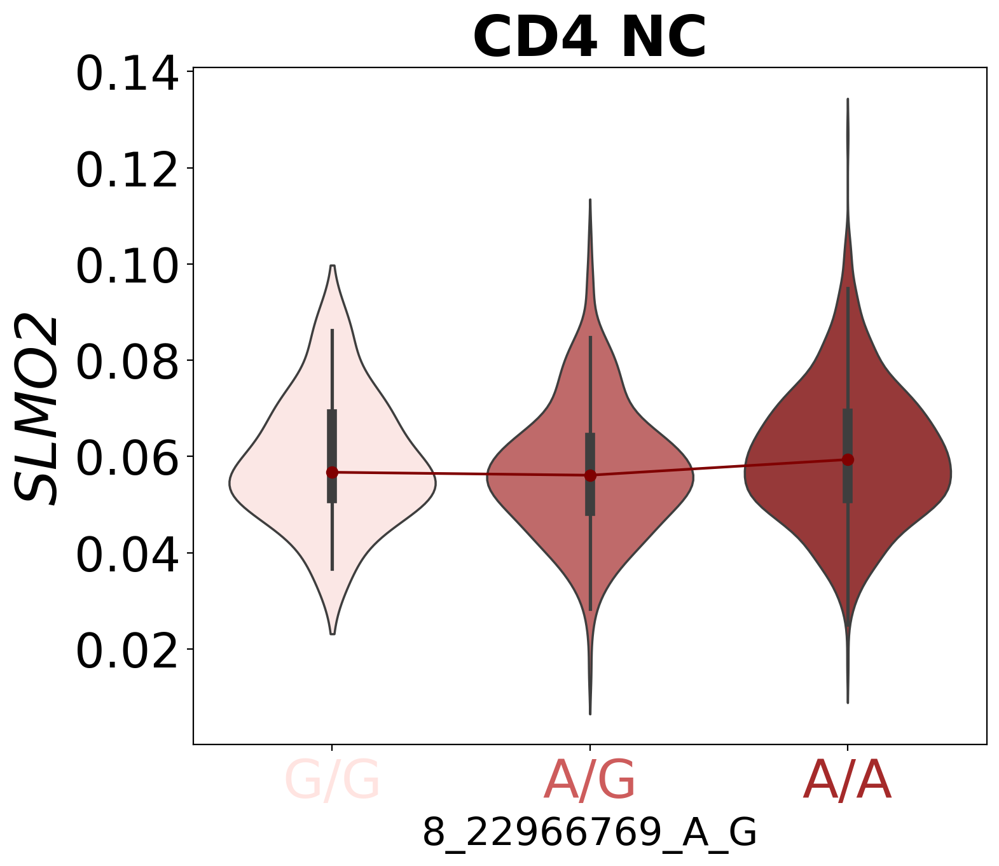

In [40]:
plot_ct_gex_vs_gt(
    adata=adata,
    gene="ENSG00000101166",
    filter_maf=False,
    test_gt_groups=False,
    annotation_fontsize=30,
    cell_indices=None,
    celltype=["CD4 NC"],
    celltype_column="cell_label",
    iid_column="individual",
    GT_matrix=GT_matrix,
    SNP_id=SNP_dict_inv["8:22966769"],
    DxC_associations = GxC_effects,
    hgnc_column="GeneSymbol",
    savefig=True,
    output_dir=os.path.join(model_results_dir, "Figures"),
    format="eps",
)

In [46]:
tensorqtl_all_8_22966769 = pd.read_csv("/data/danai/Data/OneK1K/Benchmarks/TensorQTL/tensorqtl_results_all_8_22966769.tsv", 
                                       sep="\t", names=["SNP_id", "Gene", "p_value", "ref_allele", "alt_allele", "celltype", "eQTL"])
tensorqtl_all_8_22966769.head()

,SNP_id,Gene,p_value,ref_allele,alt_allele,celltype,eQTL
0,8:22966769,ENSG00000166987,0.611406,A,G,CD4-ET,8_22966769_A_G__ENSG00000166987__CD4-ET
1,8:22966769,ENSG00000170624,0.082484,A,G,CD4-ET,8_22966769_A_G__ENSG00000170624__CD4-ET
2,8:22966769,ENSG00000117115,0.374887,A,G,CD4-ET,8_22966769_A_G__ENSG00000117115__CD4-ET
3,8:22966769,ENSG00000137078,0.036125,A,G,CD4-ET,8_22966769_A_G__ENSG00000137078__CD4-ET
4,8:22966769,ENSG00000082213,0.464676,A,G,CD4-ET,8_22966769_A_G__ENSG00000082213__CD4-ET


In [47]:
tensorqtl_all_8_22966769 = tensorqtl_all_8_22966769.set_index("Gene").merge(
    adata.var.GeneSymbol, right_index=True, left_index=True, how="left").reset_index()
tensorqtl_all_8_22966769 = tensorqtl_all_8_22966769.assign(mlog10_pval = -np.log10(tensorqtl_all_8_22966769.p_value))
tensorqtl_all_8_22966769.head()

,Gene,SNP_id,p_value,ref_allele,alt_allele,celltype,eQTL,GeneSymbol,mlog10_pval
0,ENSG00000166987,8:22966769,0.611406,A,G,CD4-ET,8_22966769_A_G__ENSG00000166987__CD4-ET,MBD6,0.213671
1,ENSG00000170624,8:22966769,0.082484,A,G,CD4-ET,8_22966769_A_G__ENSG00000170624__CD4-ET,SGCD,1.083633
2,ENSG00000117115,8:22966769,0.374887,A,G,CD4-ET,8_22966769_A_G__ENSG00000117115__CD4-ET,PADI2,0.426100
3,ENSG00000137078,8:22966769,0.036125,A,G,CD4-ET,8_22966769_A_G__ENSG00000137078__CD4-ET,SIT1,1.442198
4,ENSG00000082213,8:22966769,0.464676,A,G,CD4-ET,8_22966769_A_G__ENSG00000082213__CD4-ET,C5orf22,0.332850


In [48]:
GxC_effects.loc[GxC_effects.SNP == "8:22966769"]

,Factor,SNP_id,effect_size,effect_size_se,p_value,assessed_allele,corrected_pvalue,SNP
1117,D_Factor232,8_22966769_A_G,0.485567,0.107709,0.000006,A,0.012032,8:22966769


In [49]:
GxC_effects.loc[GxC_effects.Factor == "D_Factor232"]

,Factor,SNP_id,effect_size,effect_size_se,p_value,assessed_allele,corrected_pvalue,SNP
1117,D_Factor232,8_22966769_A_G,0.485567,0.107709,0.000006,A,0.012032,8:22966769


/tmp/ipykernel_1437435/1919310526.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


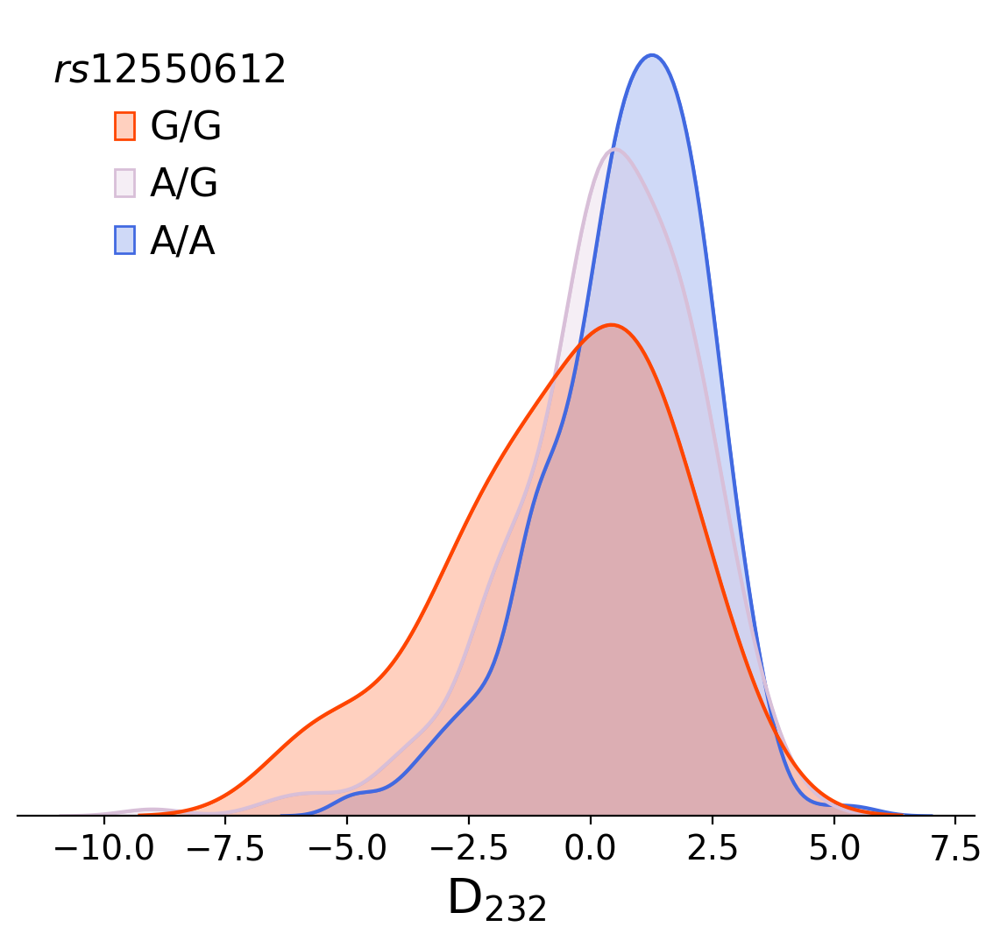

In [39]:
tmp = pd.merge(D["D_Factor232"], GT_matrix.loc[SNP_dict_inv["8:22966769"]].astype(int), right_index=True, left_index=True, how="left")
labels_dict = dict(zip([0, 1, 2], ["G/G", "A/G", "A/A"]))
tmp["8_22966769_A_G"].replace(labels_dict, inplace=True)
tmp.rename(columns={"8_22966769_A_G":f"${rsid}$"}, inplace=True)

legend_handles = []
legend_labels = []

p = sns.kdeplot(x="D_Factor232", hue=f"${rsid}$", fill=True, data=tmp, palette=["orangered", "thistle", "royalblue"], 
                hue_order=["G/G", "A/G", "A/A"], legend=True, common_norm=False)
p = sns.kdeplot(x="D_Factor232", hue=f"${rsid}$", fill=False, data=tmp, palette=["orangered", "thistle", "royalblue"], 
                hue_order=["G/G", "A/G", "A/A"], legend=False, common_norm=False)

p.set_xlabel("D$_{232}$", fontsize=20)
p.tick_params(axis="x", labelsize=14) 
p.set_ylabel("")
p.set_yticks([])
p.spines["left"].set_visible(False)
p.spines["right"].set_visible(False)
p.spines["top"].set_visible(False)

leg = p.get_legend()
legend_labels = [t.get_text() for t in leg.get_texts()]
legend_handles = leg.legend_handles

p.legend(title=f"${rsid}$", handles=legend_handles, labels=legend_labels, frameon=False, title_fontsize=16, fontsize=16)

plt.savefig(os.path.join(model_results_dir, "Figures", "KDEplot_D232_colored-by_8-22966769_wo-y-axis.png"), 
            transparent=True, dpi=400, bbox_inches="tight")
plt.savefig(os.path.join(model_results_dir, "Figures", "KDEplot_D232_colored-by_8-22966769_wo-y-axis.eps"), 
            transparent=True, dpi=400, bbox_inches="tight")
plt.savefig(os.path.join(model_results_dir, "Figures", "KDEplot_D232_colored-by_8-22966769_wo-y-axis.pdf"), 
            transparent=True, dpi=400, bbox_inches="tight")

### Comparison with TensorQTL

In [37]:
# tensorqtl_8_22966769_CD4 = tensorqtl_all_8_22966769.loc[
# (tensorqtl_all_8_22966769.celltype.str.startswith("CD4")) | (tensorqtl_all_8_22966769.celltype == "CD8-NC")
# ]
tensorqtl_8_22966769_naiveT = tensorqtl_all_8_22966769.loc[tensorqtl_all_8_22966769.celltype.isin(["CD4-NC", "CD4-SOX4", "CD8-NC"])]
tensorqtl_8_22966769_naiveT

,Gene,SNP_id,p_value,ref_allele,alt_allele,celltype,eQTL,GeneSymbol,mlog10_pval
25216,ENSG00000166987,8:22966769,0.847096,A,G,CD4-NC,8_22966769_A_G__ENSG00000166987__CD4-NC,MBD6,0.072067
25217,ENSG00000170624,8:22966769,0.800465,A,G,CD4-NC,8_22966769_A_G__ENSG00000170624__CD4-NC,SGCD,0.096658
25218,ENSG00000117115,8:22966769,0.806030,A,G,CD4-NC,8_22966769_A_G__ENSG00000117115__CD4-NC,PADI2,0.093649
25219,ENSG00000137078,8:22966769,0.616328,A,G,CD4-NC,8_22966769_A_G__ENSG00000137078__CD4-NC,SIT1,0.210188
25220,ENSG00000082213,8:22966769,0.162105,A,G,CD4-NC,8_22966769_A_G__ENSG00000082213__CD4-NC,C5orf22,0.790203
...,...,...,...,...,...,...,...,...,...
176507,ENSG00000185811,8:22966769,0.496641,A,G,CD4-SOX4,8_22966769_A_G__ENSG00000185811__CD4-SOX4,IKZF1,0.303958
176508,ENSG00000234465,8:22966769,0.258168,A,G,CD4-SOX4,8_22966769_A_G__ENSG00000234465__CD4-SOX4,PINLYP,0.588098
176509,ENSG00000170615,8:22966769,0.380902,A,G,CD4-SOX4,8_22966769_A_G__ENSG00000170615__CD4-SOX4,SLC26A5,0.419187
176510,ENSG00000151778,8:22966769,0.782925,A,G,CD4-SOX4,8_22966769_A_G__ENSG00000151778__CD4-SOX4,SERP2,0.106280


In [38]:
tensorqtl_8_22966769_naiveT.celltype.unique()

array(['CD4-NC', 'CD8-NC', 'CD4-SOX4'], dtype=object)

In [39]:
tensorqtl_8_22966769_CD4naive = tensorqtl_all_8_22966769.loc[tensorqtl_all_8_22966769.celltype.isin(["CD4-NC"])] #, "CD4-SOX4"])]
tensorqtl_8_22966769_CD4SOX = tensorqtl_all_8_22966769.loc[tensorqtl_all_8_22966769.celltype.isin(["CD4-SOX4"])]

tensorqtl_8_22966769_CD8naive = tensorqtl_all_8_22966769.loc[tensorqtl_all_8_22966769.celltype.isin(["CD8-NC"])]

In [40]:
tensorqtl_8_22966769_NOTnaive = tensorqtl_all_8_22966769.loc[~tensorqtl_all_8_22966769.index.isin(tensorqtl_8_22966769_naiveT.index)]
tensorqtl_8_22966769_NOTnaive.shape[0] + tensorqtl_8_22966769_naiveT.shape[0] == tensorqtl_all_8_22966769.shape[0]

True

In [41]:
tensorqtl_8_22966769_NOTCD4naive = tensorqtl_all_8_22966769.loc[~tensorqtl_all_8_22966769.celltype.isin(["CD4-NC", "CD4-SOX4"])]
tensorqtl_8_22966769_NOTCD4naive.head()

,Gene,SNP_id,p_value,ref_allele,alt_allele,celltype,eQTL,GeneSymbol,mlog10_pval
0,ENSG00000166987,8:22966769,0.611406,A,G,CD4-ET,8_22966769_A_G__ENSG00000166987__CD4-ET,MBD6,0.213671
1,ENSG00000170624,8:22966769,0.082484,A,G,CD4-ET,8_22966769_A_G__ENSG00000170624__CD4-ET,SGCD,1.083633
2,ENSG00000117115,8:22966769,0.374887,A,G,CD4-ET,8_22966769_A_G__ENSG00000117115__CD4-ET,PADI2,0.426100
3,ENSG00000137078,8:22966769,0.036125,A,G,CD4-ET,8_22966769_A_G__ENSG00000137078__CD4-ET,SIT1,1.442198
4,ENSG00000082213,8:22966769,0.464676,A,G,CD4-ET,8_22966769_A_G__ENSG00000082213__CD4-ET,C5orf22,0.332850


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


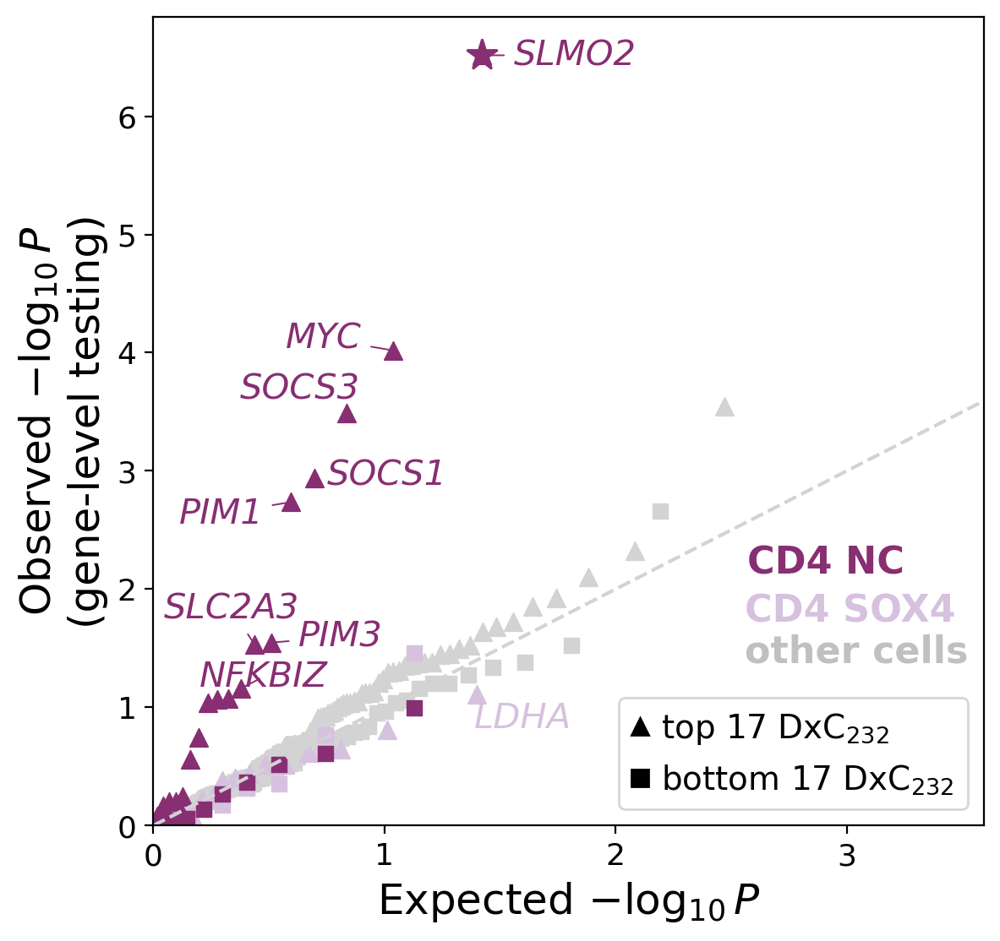

In [44]:
# Include the gene identified by the gene-level test
sign_index = tensorqtl_8_22966769_CD4naive.loc[
(tensorqtl_8_22966769_CD4naive.Gene.isin(tensorqtl_results.loc[tensorqtl_results.SNP_id == "8:22966769"].gene)) & 
(tensorqtl_8_22966769_CD4naive.celltype.isin(tensorqtl_results.loc[tensorqtl_results.SNP_id == "8:22966769"].celltype))
].index
sign_gname = tensorqtl_8_22966769_CD4naive.loc[
(tensorqtl_8_22966769_CD4naive.Gene.isin(tensorqtl_results.loc[tensorqtl_results.SNP_id == "8:22966769"].gene)) & 
(tensorqtl_8_22966769_CD4naive.celltype.isin(tensorqtl_results.loc[tensorqtl_results.SNP_id == "8:22966769"].celltype))
].GeneSymbol.iloc[0]

# Select the significant gene and LIVI's top genes
tmp = tensorqtl_8_22966769_CD4naive.loc[
(tensorqtl_8_22966769_CD4naive.index.isin(sign_index)) | (tensorqtl_8_22966769_CD4naive.Gene.isin(DxC_decoder["DxC_Factor232"].abs().nlargest(17).index))
]
(osm, osr), _ = probplot(tmp.p_value, 
                         dist="uniform")
# osr are just the p-values sorted (ascending=True)
index_osr = tmp.p_value.sort_values(ascending=True).index.get_loc(sign_index[0])
x_top17_CD4naive = -np.log10(osm)
y_top17_CD4naive = -np.log10(osr)

# Get also indices for top LIVI genes to annotate
tmp_anno = tmp.loc[(tmp.Gene.isin(DxC_decoder["DxC_Factor232"].abs().nlargest(17).index)) & (tmp.mlog10_pval >= 1.1)]
# For each gene get the min p-value across T naive celltypes
gene_min_pval = tmp_anno.groupby("GeneSymbol", observed=True).apply(lambda x: x.p_value.min(), include_groups=False).rename("p_value").to_frame()
idx = []
geneS = []
for _, row in gene_min_pval.reset_index().iterrows():  
    idx.extend(
        tensorqtl_8_22966769_CD4naive.loc[(tensorqtl_8_22966769_CD4naive.GeneSymbol == row["GeneSymbol"]) & (tensorqtl_8_22966769_CD4naive.p_value == row["p_value"])].index.tolist()
    )
    geneS.append(row["GeneSymbol"])
top10idx_CD4naive = dict(zip(geneS, idx))
# Get p-value sorted indices of the original indices
for k,v in top10idx_CD4naive.items():
    top10idx_CD4naive[k] = tmp.p_value.sort_values(ascending=True).index.get_loc(v)

# Bottom 17 genes
(osm, osr), _ = probplot(tensorqtl_8_22966769_CD4naive.loc[tensorqtl_8_22966769_CD4naive.Gene.isin(DxC_decoder["DxC_Factor232"].abs().nsmallest(17).index)].p_value, 
                         dist="uniform")
x_bottom17_CD4naive = -np.log10(osm)
y_bottom17_CD4naive = -np.log10(osr)

# CD4 SOX4
tmp = tensorqtl_8_22966769_CD4SOX.loc[tensorqtl_8_22966769_CD4SOX.Gene.isin(DxC_decoder["DxC_Factor232"].abs().nlargest(17).index)]
(osm, osr), _ = probplot(tmp.p_value, dist="uniform")
x_top30_CD4SOX = -np.log10(osm)
y_top30_CD4SOX = -np.log10(osr)
# Get indices of top LIVI genes to annotate
tmp_anno = tmp.loc[tmp.mlog10_pval >= 1.1].GeneSymbol.to_dict() # index, gene name
# Get p-value sorted indices of the original indices
top10idx_CD4SOX = {}
for k,v in tmp_anno.items():
    top10idx_CD4SOX[v] = tmp.p_value.sort_values(ascending=True).index.get_loc(k)
    

(osm, osr), _ = probplot(tensorqtl_8_22966769_CD4SOX.loc[tensorqtl_8_22966769_CD4SOX.Gene.isin(DxC_decoder["DxC_Factor232"].abs().nsmallest(17).index)].p_value,
                                 dist="uniform")
x_bottom17_CD4SOX = -np.log10(osm)
y_bottom17_CD4SOX = -np.log10(osr)


# Other cells
(osm, osr), _ = probplot(tensorqtl_8_22966769_NOTCD4naive.loc[tensorqtl_8_22966769_NOTCD4naive.Gene.isin(DxC_decoder["DxC_Factor232"].abs().nlargest(17).index)].p_value,
                                 dist="uniform")
x_top17_NOTnaive = -np.log10(osm)
y_top17_NOTnaive = -np.log10(osr)

(osm, osr), _ = probplot(tensorqtl_8_22966769_NOTCD4naive.loc[tensorqtl_8_22966769_NOTCD4naive.Gene.isin(DxC_decoder["DxC_Factor232"].abs().nsmallest(17).index)].p_value,
                                 dist="uniform")
x_bottom17_NOTnaive = -np.log10(osm)
y_bottom17_NOTnaive = -np.log10(osr)


plt.figure(figsize=(6.3,6.3))
axs = plt.gca()

axs.plot(x_top17_CD4naive[index_osr], y_top17_CD4naive[index_osr], color=cell_label_colors["CD4 NC"], markersize=14, marker="*")

sns.scatterplot(x=x_top17_NOTnaive, y=y_top17_NOTnaive, ax=axs, edgecolor=None, color="lightgrey", s=60, marker="^",
                label="other cells")
sns.scatterplot(x=x_bottom17_NOTnaive, y=y_bottom17_NOTnaive, ax=axs, edgecolor=None, color="lightgrey", s=40, marker="s") #, label="top50 - other cells")

sns.scatterplot(x=x_top17_CD4SOX, y=y_top17_CD4SOX, ax=axs, edgecolor=None, color=cell_label_colors["CD4 SOX4"],
                s=60, marker="^", label="CD4 T naive") 
sns.scatterplot(x=x_bottom17_CD4SOX, y=y_bottom17_CD4SOX, ax=axs, edgecolor=None, color=cell_label_colors["CD4 SOX4"], s=40, marker="s") # label="top100 - CD4T and CD8T naive")


sns.scatterplot(x=x_top17_CD4naive, y=y_top17_CD4naive, ax=axs, edgecolor=None, color=cell_label_colors["CD4 NC"],
                s=60, marker="^", label="CD4 T naive") 
sns.scatterplot(x=x_bottom17_CD4naive, y=y_bottom17_CD4naive, ax=axs, edgecolor=None, color=cell_label_colors["CD4 NC"], s=40, marker="s") # label="top100 - CD4T and CD8T naive")


# Add gene annotations
annotation_fontsize=15

axs.annotate(text=sign_gname, 
             xy=(x_top17_CD4naive[index_osr],y_top17_CD4naive[index_osr]), 
             xytext=(x_top17_CD4naive[index_osr]+0.4, y_top17_CD4naive[index_osr]),
             arrowprops=dict(
                 arrowstyle="-",
                 connectionstyle="arc3",
                 color=cell_label_colors["CD4 NC"],
                 linewidth=0.7,
             ),
             ha="center",
             va="center",
             fontstyle="italic",
             fontsize=annotation_fontsize,
             color=cell_label_colors["CD4 NC"]
        )
for k,v in top10idx_CD4naive.items():
    if k == "SLC2A3":
        axs.annotate(
                text=k,
                xy=(x_top17_CD4naive[v], y_top17_CD4naive[v]),
                xytext=(x_top17_CD4naive[v]-0.1, y_top17_CD4naive[v]+0.3),
                arrowprops=dict(
                    arrowstyle="-",
                    connectionstyle="arc3",
                    color=cell_label_colors["CD4 NC"],
                    linewidth=0.7,
                ),
                ha="center",
                va="center",
                fontstyle="italic",
                fontsize=annotation_fontsize,
                color=cell_label_colors["CD4 NC"]
            )
    elif k == "PIM3":
        axs.annotate(
            text=k,
            xy=(x_top17_CD4naive[v], y_top17_CD4naive[v]),
            xytext=(x_top17_CD4naive[v]+0.3, y_top17_CD4naive[v]+0.05),
            arrowprops=dict(
                arrowstyle="-",
                connectionstyle="arc3",
                color=cell_label_colors["CD4 NC"],
                linewidth=0.7,
            ),
            ha="center",
            va="center",
            fontstyle="italic",
            fontsize=annotation_fontsize,
            color=cell_label_colors["CD4 NC"]
        )
    elif k == "PIM1":
        axs.annotate(
            text=k,
            xy=(x_top17_CD4naive[v], y_top17_CD4naive[v]),
            xytext=(x_top17_CD4naive[v]-0.3, y_top17_CD4naive[v]-0.1),
            arrowprops=dict(
                arrowstyle="-",
                connectionstyle="arc3",
                color=cell_label_colors["CD4 NC"],
                linewidth=0.7,
            ),
            ha="center",
            va="center",
            fontstyle="italic",
            fontsize=annotation_fontsize,
            color=cell_label_colors["CD4 NC"]
        )
    elif k == "SOCS3":
        axs.annotate(
            text=k,
            xy=(x_top17_CD4naive[v], y_top17_CD4naive[v]),
            xytext=(x_top17_CD4naive[v]-0.2, y_top17_CD4naive[v]+0.2),
            arrowprops=dict(
                arrowstyle="-",
                connectionstyle="arc3",
                color=cell_label_colors["CD4 NC"],
                linewidth=0.7,
            ),
            ha="center",
            va="center",
            fontstyle="italic",
            fontsize=annotation_fontsize,
            color=cell_label_colors["CD4 NC"]
        )
    elif k == "SOCS1":
         axs.text(x=x_top17_CD4naive[v]+0.055, y=y_top17_CD4naive[v]-0.06, s=k, 
              fontdict={"fontstyle":"italic", "color":cell_label_colors["CD4 NC"], "fontsize":annotation_fontsize})
    elif k == "NFKBIZ":
        axs.annotate(
            text=k,
            xy=(x_top17_CD4naive[v], y_top17_CD4naive[v]),
            xytext=(x_top17_CD4naive[v]+0.1, y_top17_CD4naive[v]+0.1),
            arrowprops=dict(
                arrowstyle="-",
                connectionstyle="arc3",
                color=cell_label_colors["CD4 NC"],
                linewidth=0.7,
            ),
            ha="center",
            va="center",
            fontstyle="italic",
            fontsize=annotation_fontsize,
            color=cell_label_colors["CD4 NC"]
        )
    elif k == "LDHA":
        axs.annotate(
            text=k,
            xy=(x_top17_CD4naive[v], y_top17_CD4naive[v]),
            xytext=(x_top17_CD4naive[v]+0.2, y_top17_CD4naive[v]-1),
            arrowprops=dict(
                arrowstyle="-",
                connectionstyle="arc3",
                color=cell_label_colors["CD4 NC"],
                linewidth=0.7,
            ),
            ha="center",
            va="center",
            fontstyle="italic",
            fontsize=annotation_fontsize,
            color=cell_label_colors["CD4 NC"]
        )
    else:
        axs.annotate(
            text=k,
            xy=(x_top17_CD4naive[v], y_top17_CD4naive[v]),
            xytext=(x_top17_CD4naive[v]-0.3, y_top17_CD4naive[v]+0.1),
            arrowprops=dict(
                arrowstyle="-",
                connectionstyle="arc3",
                color=cell_label_colors["CD4 NC"],
                linewidth=0.7,
            ),
            ha="center",
            va="center",
            fontstyle="italic",
            fontsize=annotation_fontsize,
            color=cell_label_colors["CD4 NC"]
        )

        
for k,v in top10idx_CD4SOX.items():
    if k == "LDHA":
        axs.annotate(
            text=k,
            xy=(x_top17_CD4SOX[v], y_top17_CD4SOX[v]),
            xytext=(x_top17_CD4SOX[v]+0.2, y_top17_CD4SOX[v]-0.2),
            arrowprops=dict(
                arrowstyle="-",
                connectionstyle="arc3",
                color=cell_label_colors["CD4 SOX4"],
                linewidth=0.7,
            ),
            ha="center",
            va="center",
            fontstyle="italic",
            fontsize=annotation_fontsize,
            color=cell_label_colors["CD4 SOX4"]
        )
    else:
        axs.text(x=x_top17_CD4SOX[v], y=y_top17_CD4SOX[v], s=k,
                 fontdict={"fontstyle":"italic", "color":cell_label_colors["CD4 SOX4"], "fontsize":annotation_fontsize})


axs.set(xlabel=r"Expected $-\log_{10} P$", ylabel=r"Observed $-\log_{10} P$"+"\n(gene-level testing)")
axs.xaxis.label.set_size(18)
axs.yaxis.label.set_size(18)

legend1 = axs.legend(handles=[], title="CD4 NC", title_fontsize=16, loc="lower right", frameon=False, # title=CD$4^{+}$ T naive
                     bbox_to_anchor=(0.937, 0.25), alignment="left")
legend1.get_title().set_color(cell_label_colors["CD4 NC"])
legend1.get_title().set_fontweight("bold")
axs.add_artist(legend1)


legend3 = axs.legend(handles=[], title="CD4 SOX4", title_fontsize=16, loc="lower right", frameon=False,
                     bbox_to_anchor=(0.999, 0.19), alignment="left")
legend3.get_title().set_color(cell_label_colors["CD4 SOX4"])
legend3.get_title().set_fontweight("bold")
axs.add_artist(legend3)

legend4 = axs.legend(handles=[], title="other cells", title_fontsize=16, loc="lower right", frameon=False, 
                     bbox_to_anchor=(1.014, 0.14), alignment="left")
legend4.get_title().set_color("silver")
legend4.get_title().set_fontweight("bold")
axs.add_artist(legend4)

legend_handles = [
    Line2D([], [], color="black", marker="^", linestyle="None", markersize=7, label="top 17 DxC$_{232}$"),
    Line2D([], [], color="black", marker="s", linestyle="None", markersize=7, label="bottom 17 DxC$_{232}$")
]
legend5 = axs.legend(handles=legend_handles, title="", title_fontsize=14, fontsize=14, loc="lower right", frameon=True, 
                     alignment="left")

xlim = axs.get_xlim()[-1]
ylim = axs.get_ylim()[-1]
axes_lim = max([xlim, ylim])
# Diagonal reference line
axs.plot(np.arange(axes_lim), np.arange(axes_lim), linestyle="--", color="lightgrey")
axs.set_xlim(0, axes_lim if ylim - xlim < 2 else xlim+1)
axs.set_ylim(0, axes_lim)
axs.set_xticks(np.arange(0, axs.get_xticks().max(),1, dtype=int), np.arange(0, axs.get_xticks().max(),1, dtype=int), fontsize=13)
axs.set_yticks(np.arange(0, axs.get_yticks().max(),1, dtype=int), np.arange(0, axs.get_yticks().max(),1, dtype=int), fontsize=13)

plt.savefig(os.path.join(model_results_dir, "Figures", "QQplot_8_22966769_tensorQTL_D232_TopGenes-and-bottom-genes_CD4-naive_other-cells.png"), 
            transparent=True, bbox_inches="tight", dpi=400)
plt.savefig(os.path.join(model_results_dir, "Figures", "QQplot_8_22966769_tensorQTL_D232_TopGenes-and-bottom-genes_CD4-naive_other-cells.eps"), 
            transparent=True, bbox_inches="tight", dpi=400)
plt.savefig(os.path.join(model_results_dir, "Figures", "QQplot_8_22966769_tensorQTL_D232_TopGenes-and-bottom-genes_CD4-naive_other-cells.pdf"), 
            transparent=True, bbox_inches="tight", dpi=400)

#### Gene-level testing on LIVI identified cell subset

In [46]:
results_livi_cells_017 = pd.read_csv("/data/danai/Data/OneK1K/Benchmarks/TensorQTL/LIVI_cells_8-22966769_GxC232_017-cutoff_15PCs_10GT-PCs_trans-mapping_all-chroms_only-8-22966769.tsv", 
                                 sep="\t")

results_livi_cells_017 = results_livi_cells_017.assign(mlog10_pval = -np.log10(results_livi_cells_017.p_value))
results_livi_cells_017 = results_livi_cells_017.set_index("gene").merge(
    adata.var.GeneSymbol, right_index=True, left_index=True, how="left").reset_index(names="Gene")
results_livi_cells_017.head()

,Gene,SNP_id,p_value,effect_size,effect_size_se,ref_allele,alt_allele,mlog10_pval,GeneSymbol
0,ENSG00000257019,8:22966769,0.445562,-1.585165e-02,2.077129e-02,A,G,0.351092,OR13C2
1,ENSG00000166987,8:22966769,0.638469,5.387042e-02,1.146203e-01,A,G,0.194860,MBD6
2,ENSG00000170624,8:22966769,0.075648,-1.167702e-01,6.565820e-02,A,G,1.121203,SGCD
3,ENSG00000140519,8:22966769,0.727044,9.503140e-15,2.721689e-14,A,G,0.138439,RHCG
4,ENSG00000117115,8:22966769,0.327957,-6.656258e-02,6.800840e-02,A,G,0.484184,PADI2


In [47]:
tensorqtl_results.loc[tensorqtl_results.SNP_id == "8:22966769"].gene.iloc[0]

'ENSG00000101166'

In [48]:
results_livi_cells_017_sign = pd.read_csv("/data/danai/Data/OneK1K/Benchmarks/TensorQTL/LIVI_cells_8-22966769_GxC232_017-cutoff_10K-HVG-HEX-genes_15PCs_10GT-PCs_trans-mapping_all-chroms_tensorQTL_significant_BH_005.tsv",
                                         sep="\t")
results_livi_cells_017_sign = results_livi_cells_017_sign.loc[results_livi_cells_017_sign.SNP_id == "8:22966769"]
results_livi_cells_017_sign

,SNP_id,gene,p_value,effect_size,effect_size_se,ref_allele,alt_allele,celltype,Storey_q,BH_corrected_pvalue
2274,8:22966769,ENSG00000184557,7.811555e-07,0.218035,0.043843,A,G,GxC232_017,0.029577,0.030167


In [49]:
adata.var.loc["ENSG00000184557"].filter(like="ene")

GeneSymbol            SOCS3
gene_chromosome          17
gene_start         76352864
gene_end           76356158
Name: ENSG00000184557, dtype: object

In [50]:
results_livi_cells_017.loc[results_livi_cells_017.Gene.isin(results_livi_cells_017_sign.gene)].GeneSymbol

12817    SOCS3
Name: GeneSymbol, dtype: object

In [55]:
tmp_livi = results_livi_cells_017.loc[
results_livi_cells_017.Gene.isin(
    DxC_decoder["DxC_Factor232"].abs().nlargest(30).index.tolist() + tensorqtl_results.loc[tensorqtl_results.SNP_id == "8:22966769"].gene.tolist()
)]
tmp_livi

,Gene,SNP_id,p_value,effect_size,effect_size_se,ref_allele,alt_allele,mlog10_pval,GeneSymbol
325,ENSG00000062716,8:22966769,7.343525e-01,0.017969,0.052938,A,G,0.134095,VMP1
442,ENSG00000059804,8:22966769,2.906964e-02,0.104757,0.047925,A,G,1.536560,SLC2A3
644,ENSG00000128016,8:22966769,4.039306e-02,0.076790,0.037413,A,G,1.393693,ZFP36
762,ENSG00000150347,8:22966769,6.438746e-01,0.023094,0.049940,A,G,0.191199,ARID5B
970,ENSG00000185338,8:22966769,2.939977e-03,0.216365,0.072566,A,G,2.531656,SOCS1
999,ENSG00000137193,8:22966769,3.274856e-03,0.143131,0.048550,A,G,2.484808,PIM1
1063,ENSG00000129355,8:22966769,7.925842e-02,0.096909,0.055159,A,G,1.100955,CDKN2D
2280,ENSG00000157514,8:22966769,7.286803e-02,-0.051419,0.028636,A,G,1.137463,TSC22D3
2840,ENSG00000102096,8:22966769,1.043176e-01,0.087527,0.053835,A,G,0.981642,PIM2
2892,ENSG00000118503,8:22966769,1.180947e-01,-0.049418,0.031593,A,G,0.927770,TNFAIP3


In [56]:
tmp_tensor = tensorqtl_8_22966769_CD4naive.loc[
tensorqtl_8_22966769_CD4naive.Gene.isin(
    DxC_decoder["DxC_Factor232"].abs().nlargest(17).index.tolist() + tensorqtl_results.loc[tensorqtl_results.SNP_id == "8:22966769"].gene.tolist()
)]
# For each gene get the min p-value across T naive celltypes
gene_min_pval = tmp_tensor.groupby("GeneSymbol", observed=True).apply(lambda x: x.p_value.min(), include_groups=False).rename("p_value").to_frame()
idx = []
for _, row in gene_min_pval.reset_index().iterrows():  
    idx.extend(
        tmp_tensor.loc[(tmp_tensor.GeneSymbol == row["GeneSymbol"]) & (tmp_tensor.p_value == row["p_value"])].index.tolist()
    )
tmp_tensor = tmp_tensor.loc[idx]
tmp_tensor

,Gene,SNP_id,p_value,ref_allele,alt_allele,celltype,eQTL,GeneSymbol,mlog10_pval
35857,ENSG00000159388,8:22966769,8.248903e-01,A,G,CD4-NC,8_22966769_A_G__ENSG00000159388__CD4-NC,BTG2,0.083604
26157,ENSG00000129355,8:22966769,8.400547e-02,A,G,CD4-NC,8_22966769_A_G__ENSG00000129355__CD4-NC,CDKN2D,1.075692
31060,ENSG00000168209,8:22966769,8.548108e-02,A,G,CD4-NC,8_22966769_A_G__ENSG00000168209__CD4-NC,DDIT4,1.068130
31800,ENSG00000134333,8:22966769,2.745749e-01,A,G,CD4-NC,8_22966769_A_G__ENSG00000134333__CD4-NC,LDHA,0.561339
32720,ENSG00000136997,8:22966769,9.578349e-05,A,G,CD4-NC,8_22966769_A_G__ENSG00000136997__CD4-NC,MYC,4.018709
33336,ENSG00000144802,8:22966769,6.919595e-02,A,G,CD4-NC,8_22966769_A_G__ENSG00000144802__CD4-NC,NFKBIZ,1.159919
26101,ENSG00000137193,8:22966769,1.837437e-03,A,G,CD4-NC,8_22966769_A_G__ENSG00000137193__CD4-NC,PIM1,2.735788
27741,ENSG00000102096,8:22966769,6.232889e-01,A,G,CD4-NC,8_22966769_A_G__ENSG00000102096__CD4-NC,PIM2,0.205311
35523,ENSG00000198355,8:22966769,2.833446e-02,A,G,CD4-NC,8_22966769_A_G__ENSG00000198355__CD4-NC,PIM3,1.547685
28435,ENSG00000057657,8:22966769,1.789914e-01,A,G,CD4-NC,8_22966769_A_G__ENSG00000057657__CD4-NC,PRDM1,0.747168


#### Scatterplot of assocation p-values LIVI cells vs. all CD4 naive

In [57]:
tmp_livi = results_livi_cells_017.set_index("Gene", inplace=False)
tmp_CD4 = tensorqtl_8_22966769_CD4naive.set_index("Gene", inplace=False)
tmp_livi = tmp_livi.merge(tmp_CD4[["mlog10_pval", "p_value"]], right_index=True, left_index=True, how="inner", suffixes=("_LIVI", "_CD4"))
tmp_livi.head()

,SNP_id,p_value_LIVI,effect_size,effect_size_se,ref_allele,alt_allele,mlog10_pval_LIVI,GeneSymbol,mlog10_pval_CD4,p_value_CD4
Gene,,,,,,,,,,
ENSG00000166987,8:22966769,0.638469,0.053870,0.114620,A,G,0.194860,MBD6,0.072067,0.847096
ENSG00000170624,8:22966769,0.075648,-0.116770,0.065658,A,G,1.121203,SGCD,0.096658,0.800465
ENSG00000117115,8:22966769,0.327957,-0.066563,0.068008,A,G,0.484184,PADI2,0.093649,0.806030
ENSG00000137078,8:22966769,0.654987,0.024626,0.055094,A,G,0.183768,SIT1,0.210188,0.616328
ENSG00000082213,8:22966769,0.352996,-0.159215,0.171338,A,G,0.452230,C5orf22,0.790203,0.162105


In [163]:
tmp_CD4.loc[(tmp_CD4.p_value < 0.05) & (tmp_CD4.index.isin(DxC_decoder["DxC_Factor232"].abs().nlargest(17).index))]

,SNP_id,p_value,ref_allele,alt_allele,celltype,eQTL,GeneSymbol,mlog10_pval
Gene,,,,,,,,
ENSG00000059804,8:22966769,0.029448,A,G,CD4-NC,8_22966769_A_G__ENSG00000059804__CD4-NC,SLC2A3,1.530941
ENSG00000185338,8:22966769,0.001155,A,G,CD4-NC,8_22966769_A_G__ENSG00000185338__CD4-NC,SOCS1,2.937242
ENSG00000137193,8:22966769,0.001837,A,G,CD4-NC,8_22966769_A_G__ENSG00000137193__CD4-NC,PIM1,2.735788
ENSG00000136997,8:22966769,0.000096,A,G,CD4-NC,8_22966769_A_G__ENSG00000136997__CD4-NC,MYC,4.018709
ENSG00000198355,8:22966769,0.028334,A,G,CD4-NC,8_22966769_A_G__ENSG00000198355__CD4-NC,PIM3,1.547685
ENSG00000184557,8:22966769,0.000326,A,G,CD4-NC,8_22966769_A_G__ENSG00000184557__CD4-NC,SOCS3,3.487164


In [58]:
cd4_sign = tensorqtl_results.loc[tensorqtl_results.celltype == "CD4-NC"]
cd4_sign

,SNP_id,gene,p_value,effect_size,effect_size_se,ref_allele,alt_allele,celltype,Storey_q,BH_corrected_pvalue,BY_corrected_pvalue
1576,1:35908451,ENSG00000145860,5.005635e-07,0.112110,0.022152,T,C,CD4-NC,0.036970,0.036970,0.806108
1577,1:53330458,ENSG00000184515,2.367815e-07,0.161693,0.031061,G,A,CD4-NC,0.021728,0.021728,0.473756
1578,1:55505647,ENSG00000266956,2.784783e-07,0.132323,0.025572,G,T,CD4-NC,0.024411,0.024411,0.532274
1579,1:67702526,ENSG00000184761,9.792749e-08,0.113318,0.021094,T,G,CD4-NC,0.011285,0.011285,0.246068
1580,1:67705958,ENSG00000184761,3.439471e-07,0.108667,0.021166,G,A,CD4-NC,0.028414,0.028414,0.619550
...,...,...,...,...,...,...,...,...,...,...,...
1888,21:35593827,ENSG00000172590,6.971712e-07,-0.130749,0.026172,G,A,CD4-NC,0.046407,0.046407,1.000000
1889,22:18959684,ENSG00000196655,3.602416e-07,-0.131971,0.025751,C,A,CD4-NC,0.029339,0.029339,0.639724
1890,22:31013296,ENSG00000184761,6.981808e-11,0.137783,0.020888,G,A,CD4-NC,0.000039,0.000039,0.000848
1891,22:38546033,ENSG00000009694,3.181784e-07,-0.406137,0.078877,T,C,CD4-NC,0.026869,0.026869,0.585872


In [59]:
cd4_sign.BH_corrected_pvalue.max()

0.0491528107522365

In [60]:
cd4_sign.loc[cd4_sign.gene == "ENSG00000101166"]

,SNP_id,gene,p_value,effect_size,effect_size_se,ref_allele,alt_allele,celltype,Storey_q,BH_corrected_pvalue,BY_corrected_pvalue
1747,8:22966769,ENSG00000101166,3.056044e-07,-0.13305,0.025801,A,G,CD4-NC,0.026117,0.026117,0.569476


In [61]:
pval_cutoff_cd4 = cd4_sign.loc[cd4_sign.BH_corrected_pvalue == cd4_sign.BH_corrected_pvalue.max()].p_value
pval_cutoff_cd4

1752    7.577812e-07
Name: p_value, dtype: float64

In [62]:
pval_cutoff_cd4 = pval_cutoff_cd4.iloc[0]
pval_cutoff_cd4

7.577811763021949e-07

In [106]:
livi_sign_all = pd.read_csv("/data/danai/Data/OneK1K/Benchmarks/TensorQTL/LIVI_cells_8-22966769_GxC232_017-cutoff_10K-HVG-HEX-genes_15PCs_10GT-PCs_trans-mapping_all-chroms_tensorQTL_significant_BH_005.tsv", 
                            sep="\t")
livi_sign_all

,SNP_id,gene,p_value,effect_size,effect_size_se,ref_allele,alt_allele,celltype,Storey_q,BH_corrected_pvalue
0,1:2146165,ENSG00000182070,1.331507e-06,0.139746,0.028718,C,A,GxC232_017,0.042776,0.043629
1,1:2146165,ENSG00000168065,2.401626e-07,0.145160,0.027900,C,A,GxC232_017,0.012323,0.012569
2,1:2146165,ENSG00000152086,2.195109e-07,0.149365,0.028613,C,A,GxC232_017,0.011476,0.011705
3,1:4193551,ENSG00000163431,2.335221e-07,0.297576,0.057135,G,A,GxC232_017,0.012058,0.012299
4,1:4193551,ENSG00000160951,4.008526e-09,0.441704,0.074370,G,A,GxC232_017,0.000510,0.000520
...,...,...,...,...,...,...,...,...,...,...
4323,22:50628937,ENSG00000173679,1.531349e-07,0.157804,0.029840,G,A,GxC232_017,0.008785,0.008961
4324,22:50628937,ENSG00000222014,7.371437e-08,0.161521,0.029776,G,A,GxC232_017,0.004891,0.004988
4325,22:50628937,ENSG00000236279,2.120351e-07,0.156250,0.029894,G,A,GxC232_017,0.011179,0.011402
4326,22:50628937,ENSG00000187135,1.370254e-06,0.243945,0.050192,G,A,GxC232_017,0.043519,0.044387


In [107]:
livi_sign_all.BH_corrected_pvalue.max()

0.0499304159833706

In [108]:
pval_cutoff_LIVI = livi_sign_all.loc[livi_sign_all.BH_corrected_pvalue == livi_sign_all.BH_corrected_pvalue.max()].p_value
pval_cutoff_LIVI

1379    0.000002
1380    0.000002
1381    0.000002
Name: p_value, dtype: float64

In [109]:
pval_cutoff_LIVI = pval_cutoff_LIVI.iloc[0]
pval_cutoff_LIVI

1.6276082307740952e-06

In [110]:
tmp_livi = tmp_livi.assign(
    plot_color = tmp_livi.apply(
        lambda x: "darkblue" if x["mlog10_pval_LIVI"] > -np.log10(0.05) and x["mlog10_pval_CD4"] < -np.log10(0.05) else cell_label_colors["CD4 NC"] if x["mlog10_pval_CD4"] > -np.log10(0.05) and x["mlog10_pval_LIVI"] < -np.log10(0.05) else "black" if x["mlog10_pval_CD4"] > -np.log10(0.05) and x["mlog10_pval_LIVI"] > -np.log10(0.05) else "lightgrey",
        axis=1)
)
tmp_livi 

,SNP_id,p_value_LIVI,effect_size,effect_size_se,ref_allele,alt_allele,mlog10_pval_LIVI,GeneSymbol,mlog10_pval_CD4,p_value_CD4,plot_color
Gene,,,,,,,,,,,
ENSG00000166987,8:22966769,0.638469,0.053870,0.114620,A,G,0.194860,MBD6,0.072067,0.847096,lightgrey
ENSG00000170624,8:22966769,0.075648,-0.116770,0.065658,A,G,1.121203,SGCD,0.096658,0.800465,lightgrey
ENSG00000117115,8:22966769,0.327957,-0.066563,0.068008,A,G,0.484184,PADI2,0.093649,0.806030,lightgrey
ENSG00000137078,8:22966769,0.654987,0.024626,0.055094,A,G,0.183768,SIT1,0.210188,0.616328,lightgrey
ENSG00000082213,8:22966769,0.352996,-0.159215,0.171338,A,G,0.452230,C5orf22,0.790203,0.162105,lightgrey
...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000185811,8:22966769,0.003155,0.153255,0.051779,A,G,2.501057,IKZF1,1.964889,0.010842,black
ENSG00000234465,8:22966769,0.998321,-0.000353,0.167787,A,G,0.000730,PINLYP,0.570920,0.268584,lightgrey
ENSG00000170615,8:22966769,0.862130,-0.020111,0.115774,A,G,0.064427,SLC26A5,0.135433,0.732094,lightgrey


In [112]:
tmp_livi.loc[(tmp_livi.mlog10_pval_LIVI > -np.log10(pval_cutoff_LIVI)) & (tmp_livi.mlog10_pval_CD4 < -np.log10(pval_cutoff_cd4)), "plot_color"] = "darkblue"

In [113]:
tmp_livi.loc[tmp_livi.GeneSymbol.isin(["SLMO2", "SOCS3"])]

,SNP_id,p_value_LIVI,effect_size,effect_size_se,ref_allele,alt_allele,mlog10_pval_LIVI,GeneSymbol,mlog10_pval_CD4,p_value_CD4,plot_color
Gene,,,,,,,,,,,
ENSG00000101166,8:22966769,2.995459e-01,-0.068330,0.065830,A,G,0.523537,SLMO2,6.514840,3.056044e-07,#882E72
ENSG00000184557,8:22966769,7.811555e-07,0.218035,0.043843,A,G,6.107262,SOCS3,3.487164,3.257134e-04,darkblue


In [117]:
hgnc_names = adata.var.loc[DxC_decoder["DxC_Factor232"].abs().nlargest(17).index].GeneSymbol.tolist()
hgnc_names[:3]

['SOCS3', 'STAT3', 'SOCS1']

In [120]:
row["mlog10_pval_CD4"]

0.07206716392457083

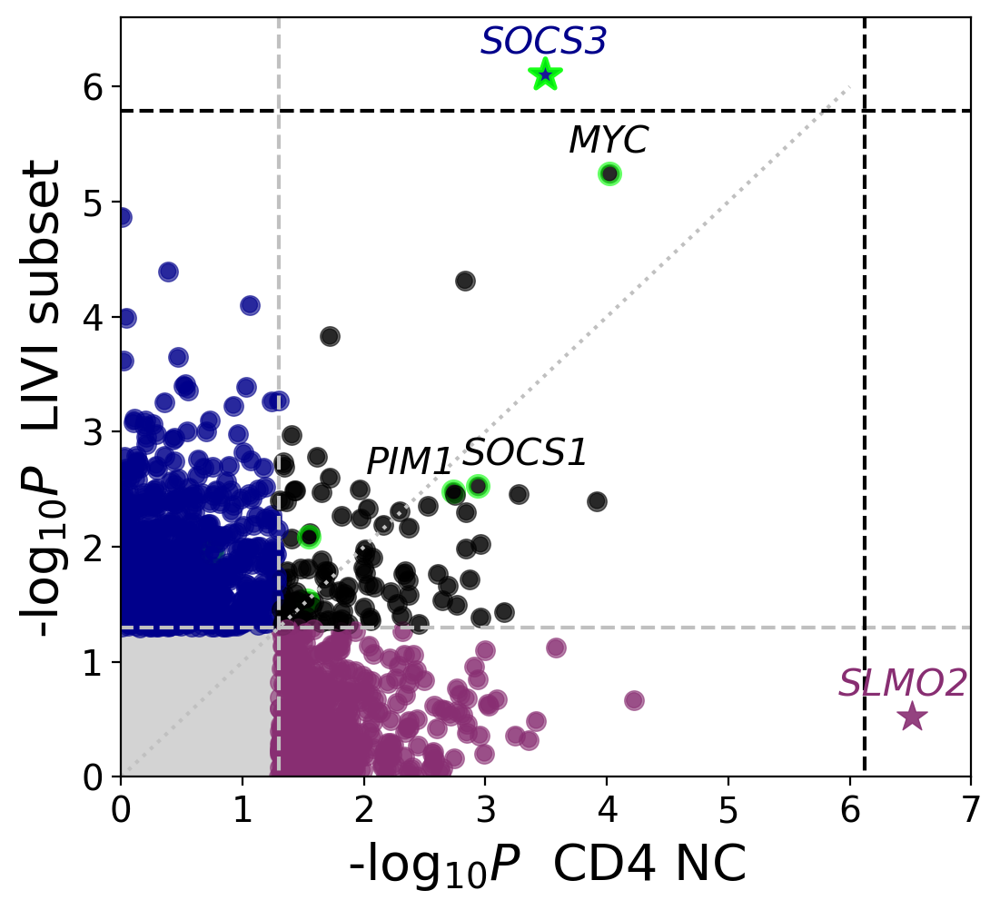

In [155]:
fig, axs = plt.subplots(figsize=(6,5.5))

sns.scatterplot(
    x="mlog10_pval_CD4",
    y="mlog10_pval_LIVI",
    hue="plot_color",
    edgecolor="face",
    palette=tmp_livi.plot_color.unique().tolist(),
    data=tmp_livi.loc[(tmp_livi["mlog10_pval_CD4"] < -np.log10(pval_cutoff_cd4)) & (tmp_livi["mlog10_pval_LIVI"] < -np.log10(pval_cutoff_LIVI))],
    ax=axs,
    rasterized=True,
    legend=False,
    alpha=0.6
)


axs.plot(np.arange(0, max(axs.get_xlim()[1], axs.get_ylim()[1])+1), 
         np.arange(0, max(axs.get_xlim()[1], axs.get_ylim()[1])+1), 
         linestyle=":", color="silver")

axs.axhline(y=-np.log10(0.05), xmin=axs.get_xlim()[0], xmax=axs.get_xlim()[1],
            linestyle="--", color="silver")
axs.axvline(x=-np.log10(0.05), ymin=axs.get_ylim()[0], ymax=axs.get_ylim()[1],
            linestyle="--", color="silver")

axs.axhline(y=-np.log10(pval_cutoff_LIVI), xmin=axs.get_xlim()[0], xmax=axs.get_xlim()[1],
            linestyle="--", color="black")
axs.axvline(x=-np.log10(pval_cutoff_cd4), ymin=axs.get_ylim()[0], ymax=axs.get_ylim()[1],
            linestyle="--", color="black")

for _, row in tmp_livi.loc[(tmp_livi["mlog10_pval_CD4"] > -np.log10(0.05)) | (tmp_livi["mlog10_pval_LIVI"] > -np.log10(0.05))].iterrows():
    sns.scatterplot(
        x=[row["mlog10_pval_CD4"]],
        y=[row["mlog10_pval_LIVI"]],
        color=row["plot_color"],
        edgecolor="lime" if row["GeneSymbol"] in hgnc_names else "face",
        linewidth=2 if row["GeneSymbol"] in hgnc_names else 0.5,
        marker="*" if row["GeneSymbol"] in ["SLMO2", "SOCS3"] else "o",
        s=160 if row["GeneSymbol"] in ["SLMO2", "SOCS3"] else 60,
        ax=axs,
        rasterized=True,
        legend=False,
        alpha=0.9 if row["GeneSymbol"] in ["SLMO2", "SOCS3"] else 0.6
    )

    # if row["mlog10_pval_CD4"] > -np.log10(0.05) and row["mlog10_pval_LIVI"] > -np.log10(0.05) and row.GeneSymbol in hgnc_names+["SLMO2"]:
    if row.GeneSymbol in ["SLMO2", "SOCS3", "MYC", "SOCS1", "PIM1"]:
        if row.GeneSymbol == "SOCS1":
            axs.annotate(text=row.GeneSymbol,
                         xy=(row.mlog10_pval_CD4, row.mlog10_pval_LIVI), 
                         xytext=(row.mlog10_pval_CD4+0.4, row.mlog10_pval_LIVI+0.27),
                         ha="center",
                         va="center",
                         fontstyle="italic",
                         fontsize=annotation_fontsize,
                         color=row.plot_color)
        elif row.GeneSymbol == "PIM1":
            axs.annotate(text=row.GeneSymbol,
                         xy=(row.mlog10_pval_CD4, row.mlog10_pval_LIVI), 
                         xytext=(row.mlog10_pval_CD4-0.35, row.mlog10_pval_LIVI+0.24),
                         ha="center",
                         va="center",
                         fontstyle="italic",
                         fontsize=annotation_fontsize,
                         color=row.plot_color)
        else:
            axs.annotate(text=row.GeneSymbol,
                         xy=(row.mlog10_pval_CD4, row.mlog10_pval_LIVI), 
                         xytext=(row.mlog10_pval_CD4-0.068 if row.GeneSymbol == "SLMO2" else row.mlog10_pval_CD4, row.mlog10_pval_LIVI+0.27),
                         ha="center",
                         va="center",
                         fontstyle="italic",
                         fontsize=annotation_fontsize,
                         color=row.plot_color)

axs.set_xlim(0, 7)
axs.set_ylim(0, 6.6)

# axs.set_xlabel("-log$_{10}P$  CD4$^+$ T naive cells", fontsize=20)
axs.set_xlabel("-log$_{10}P$  CD4 NC", fontsize=20)
axs.set_ylabel("-log$_{10}P$  LIVI subset", fontsize=20)

plt.savefig(os.path.join(model_results_dir, "Figures", "Scatterplot_SNP-8-22966769_gene-level-pvalues_CD4-NC_vs_LIVI-cells-017_marked-DxC232-genes.png"), 
            transparent=True, bbox_inches="tight", dpi=400)
plt.savefig(os.path.join(model_results_dir, "Figures", "Scatterplot_SNP-8-22966769_gene-level-pvalues_CD4-NC_vs_LIVI-cells-017_marked-DxC232-genes.eps"), 
            transparent=True, bbox_inches="tight", dpi=400)
plt.savefig(os.path.join(model_results_dir, "Figures", "Scatterplot_SNP-8-22966769_gene-level-pvalues_CD4-NC_vs_LIVI-cells-017_marked-DxC232-genes.pdf"), 
            transparent=True, bbox_inches="tight", dpi=400)

### GSEA on absolute loadings

/data/danai/scripts/LIVI/src/analysis/plotting.py:2176: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/data/danai/scripts/LIVI/src/analysis/plotting.py:2180: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


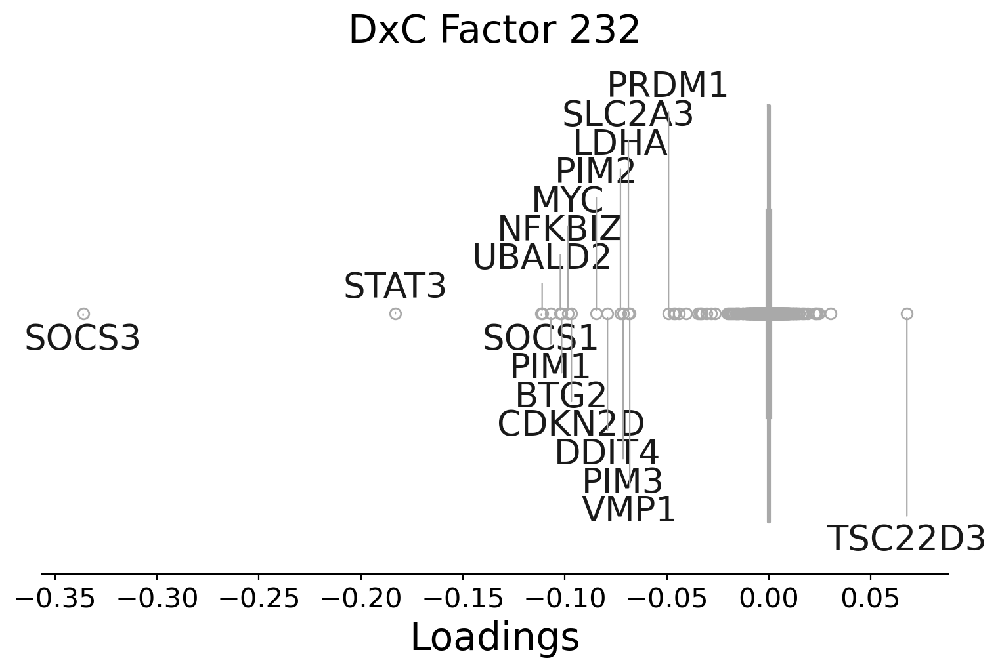

In [77]:
plot_gene_loadings_for_factor(
    GxC_decoder=DxC_decoder,
    factor="DxC_Factor232",
    adata_var=adata.var,
    gene_name_column="GeneSymbol",
    color="darkgrey",
    spines_invisible=True,
    n_top_genes=17,
    genes_to_annotate=None,
    annotation_fontsize=19,
    offset=0.055,
    x_distance=2e-2,
    savefig=os.path.join(model_results_dir, "Figures", "Boxplots_gene-loadings_DxC232_grey.png"),
)

In [79]:
enr_8_22966769 = gp.enrichr(gene_list = adata.var.loc[DxC_decoder["DxC_Factor232"].abs().nlargest(17).index].GeneSymbol.tolist(), 
                          gene_sets = ["KEGG_2021_Human", "Reactome_2022", "GO_Biological_Process_2023"], # databases_bio
                          background = background_genes.values,
                          outdir=None)
enr_8_22966769_sign = enr_8_22966769.results.loc[enr_8_22966769.results["Adjusted P-value"] <= 0.05]
enr_8_22966769_sign.sort_values("Adjusted P-value", ascending=True).head(20).sort_values("Odds Ratio", ascending=False)


,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
218,GO_Biological_Process_2023,T-helper 17 Cell Differentiation (GO:0072539),2.825244e-05,0.002310,0,0,377.920000,3958.459119,SOCS3;STAT3
219,GO_Biological_Process_2023,T-helper 17 Cell Lineage Commitment (GO:0072540),2.825244e-05,0.002310,0,0,377.920000,3958.459119,SOCS3;STAT3
220,GO_Biological_Process_2023,Negative Regulation Of Tyrosine Phosphorylatio...,3.764348e-05,0.002462,0,0,314.911111,3208.109938,SOCS3;SOCS1
75,Reactome_2022,Signaling By Leptin R-HSA-2586552,6.041352e-05,0.001269,0,0,236.150000,2294.031406,SOCS3;STAT3
74,Reactome_2022,STAT3 Nuclear Events Downstream Of ALK Signali...,6.041352e-05,0.001269,0,0,236.150000,2294.031406,STAT3;PRDM1
76,Reactome_2022,Interleukin-6 Signaling R-HSA-1059683,7.378686e-05,0.001356,0,0,209.896296,1997.022603,SOCS3;STAT3
69,Reactome_2022,Growth Hormone Receptor Signaling R-HSA-982772,1.366406e-06,0.000113,0,0,189.656250,2560.990254,SOCS3;SOCS1;STAT3
70,Reactome_2022,Signaling By ALK R-HSA-201556,1.606351e-06,0.000113,0,0,178.487395,2381.297738,MYC;STAT3;PRDM1
77,Reactome_2022,Regulation Of IFNA/IFNB Signaling R-HSA-912694,1.218265e-04,0.001791,0,0,157.388889,1418.532369,SOCS3;SOCS1
78,Reactome_2022,Regulation Of IFNG Signaling R-HSA-877312,1.218265e-04,0.001791,0,0,157.388889,1418.532369,SOCS3;SOCS1


/data/danai/scripts/LIVI/src/analysis/plotting.py:2340: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


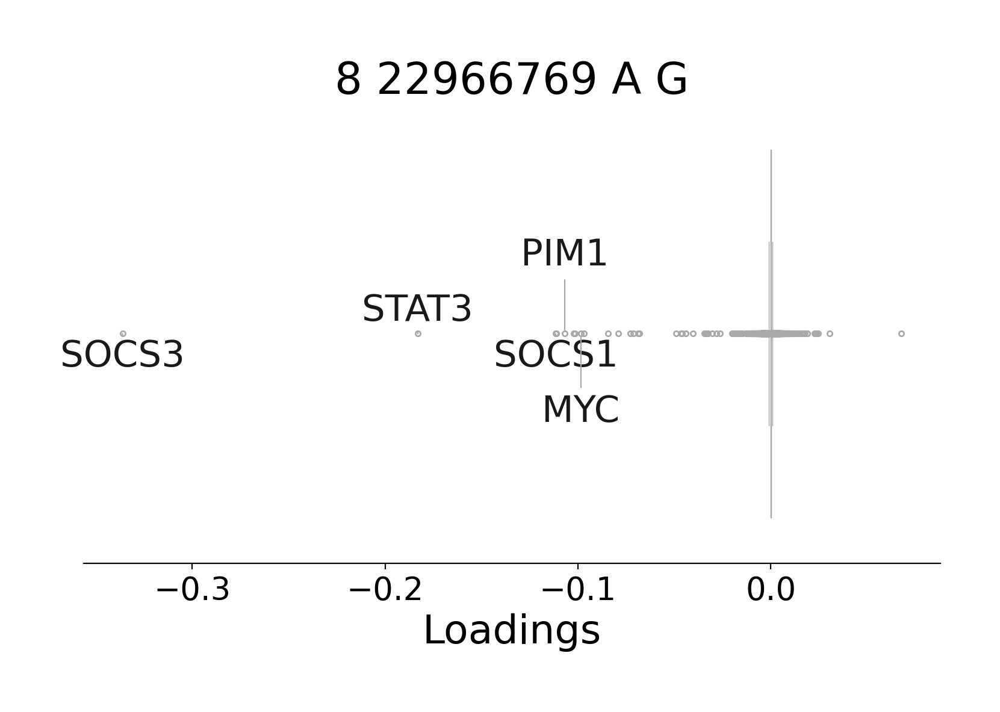

In [132]:
plot_gene_loadings_for_associated_variable(
    GxC_associations=GxC_effects,
    variable=SNP_dict_inv["8:22966769"],
    GxC_decoder=GxC_decoder,
    adata_var=adata.var,
    gene_name_column="GeneSymbol",
    color="darkgrey",
    genes_to_annotate=adata.var.loc[adata.var.GeneSymbol.isin(enr_8_22966769_sign.loc[enr_8_22966769_sign.Term == "JAK-STAT signaling pathway"].Genes.str.split(";").iloc[0])].index,
    spines_invisible=True,
    offset=0.12,
    x_distance=5e-2,
    annotation_fontsize=22,
    # color="grey",
    d=5,
    savefig=os.path.join(model_results_dir, "Figures", "Boxplots_gene-loadings_U232_8-22966769_JAK-STAT-genes.eps"),
)

/data/danai/scripts/LIVI/src/analysis/plotting.py:2340: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


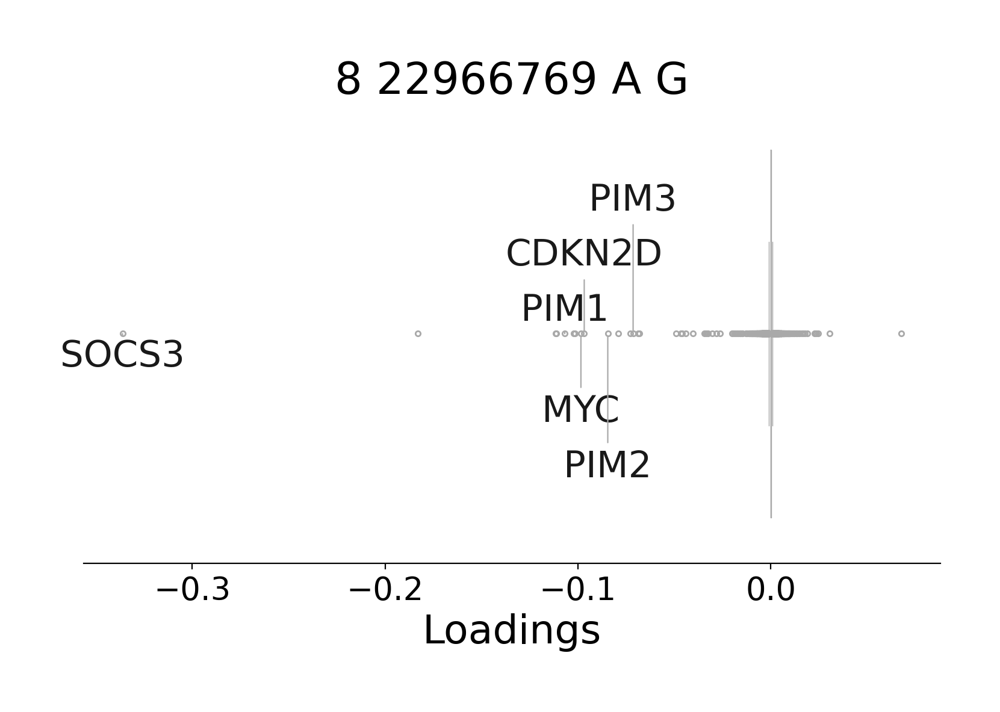

In [130]:
plot_gene_loadings_for_associated_variable(
    GxC_associations=GxC_effects,
    variable=SNP_dict_inv["8:22966769"],
    GxC_decoder=GxC_decoder,
    adata_var=adata.var,
    gene_name_column="GeneSymbol",
    color="darkgrey",
    genes_to_annotate=adata.var.loc[adata.var.GeneSymbol.isin(enr_8_22966769_sign.loc[enr_8_22966769_sign.Term.str.contains("Negative Regulation Of Apoptotic Process")].Genes.str.split(";").iloc[0])].index,
    spines_invisible=True,
    offset=0.12,
    x_distance=5e-2,
    annotation_fontsize=22,
   # color="black",
    d=5,
    savefig=os.path.join(model_results_dir, "Figures", f"Boxplots_gene-loadings_U232_8-22966769_{'Negative Regulation Of Apoptotic Process'.replace(' ', '-')}.eps"),
)

/data/danai/scripts/LIVI/src/analysis/plotting.py:2340: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


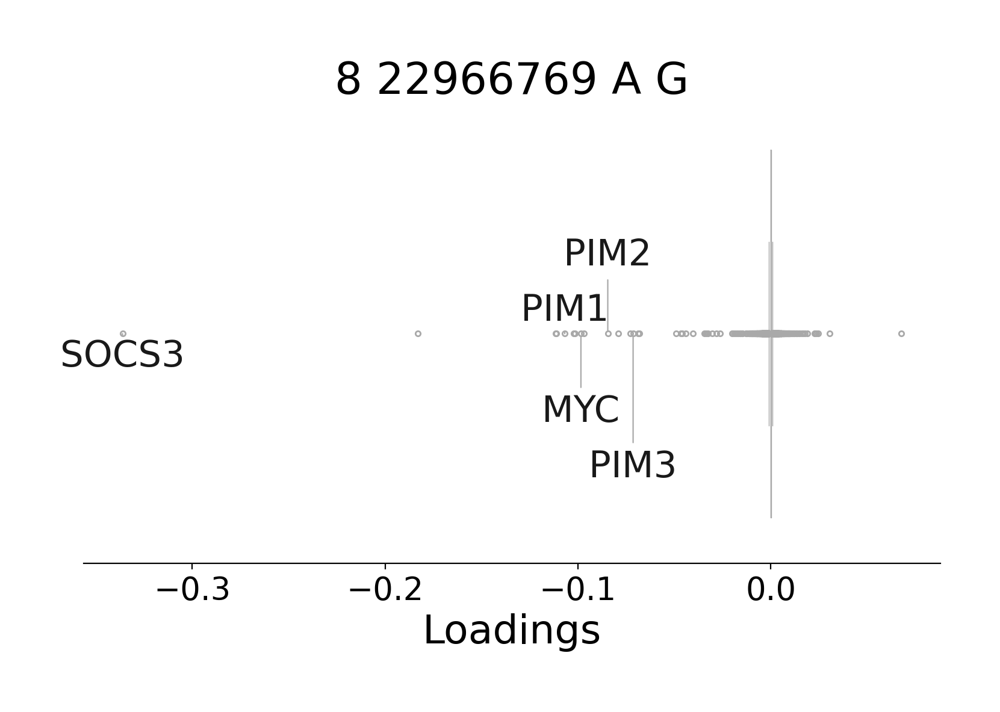

In [131]:
plot_gene_loadings_for_associated_variable(
    GxC_associations=GxC_effects,
    variable=SNP_dict_inv["8:22966769"],
    GxC_decoder=GxC_decoder,
    adata_var=adata.var,
    gene_name_column="GeneSymbol",
    color="darkgrey",
    genes_to_annotate=adata.var.loc[adata.var.GeneSymbol.isin(enr_8_22966769_sign.loc[enr_8_22966769_sign.Term.str.contains("Negative Regulation Of Programmed Cell Death")].Genes.str.split(";").iloc[0])].index,
    spines_invisible=True,
    offset=0.12,
    x_distance=5e-2,
    annotation_fontsize=22,
   # color="black",
    d=5,
    savefig=os.path.join(model_results_dir, "Figures", f"Boxplots_gene-loadings_U232_8-22966769_{'Negative Regulation Of Programmed Cell Death'.replace(' ', '-')}.eps"),
)

In [81]:
enr_8_22966769_sign = enr_8_22966769_sign.assign(mlog10pval = -np.log10(enr_8_22966769_sign["Adjusted P-value"]))
plot_df = enr_8_22966769_sign.filter(["Gene_set", "Term", "mlog10pval", "Genes"])
plot_df = plot_df.sort_values(by="mlog10pval", ascending=False)

idx = plot_df.groupby("Gene_set", observed=True).apply(
    lambda x: x.mlog10pval.nlargest(5, keep="last"), include_groups=False
).index.get_level_values(1)
plot_df = plot_df.loc[idx]
plot_df

,Gene_set,Term,mlog10pval,Genes
216,GO_Biological_Process_2023,Negative Regulation Of Apoptotic Process (GO:0...,3.019564,CDKN2D;SOCS3;MYC;PIM1;PIM3;PIM2
217,GO_Biological_Process_2023,Negative Regulation Of Programmed Cell Death (...,2.636456,SOCS3;MYC;PIM1;PIM3;PIM2
219,GO_Biological_Process_2023,T-helper 17 Cell Lineage Commitment (GO:0072540),2.636456,SOCS3;STAT3
218,GO_Biological_Process_2023,T-helper 17 Cell Differentiation (GO:0072539),2.636456,SOCS3;STAT3
220,GO_Biological_Process_2023,Negative Regulation Of Tyrosine Phosphorylatio...,2.608732,SOCS3;SOCS1
1,KEGG_2021_Human,MicroRNAs in cancer,4.950072,SOCS1;MYC;STAT3;DDIT4;PIM1
0,KEGG_2021_Human,JAK-STAT signaling pathway,4.950072,SOCS3;SOCS1;MYC;STAT3;PIM1
2,KEGG_2021_Human,Acute myeloid leukemia,4.819512,MYC;STAT3;PIM1;PIM2
3,KEGG_2021_Human,Prolactin signaling pathway,3.137138,SOCS3;SOCS1;STAT3
4,KEGG_2021_Human,"Growth hormone synthesis, secretion and action",2.621478,SOCS3;SOCS1;STAT3


In [82]:
plot_df = plot_df.assign(N_genes = [len(gs) for gs in plot_df.Genes.str.split(";")])
plot_df.head()

,Gene_set,Term,mlog10pval,Genes,N_genes
216,GO_Biological_Process_2023,Negative Regulation Of Apoptotic Process (GO:0...,3.019564,CDKN2D;SOCS3;MYC;PIM1;PIM3;PIM2,6
217,GO_Biological_Process_2023,Negative Regulation Of Programmed Cell Death (...,2.636456,SOCS3;MYC;PIM1;PIM3;PIM2,5
219,GO_Biological_Process_2023,T-helper 17 Cell Lineage Commitment (GO:0072540),2.636456,SOCS3;STAT3,2
218,GO_Biological_Process_2023,T-helper 17 Cell Differentiation (GO:0072539),2.636456,SOCS3;STAT3,2
220,GO_Biological_Process_2023,Negative Regulation Of Tyrosine Phosphorylatio...,2.608732,SOCS3;SOCS1,2


In [83]:
plot_df.Term = [textwrap.fill(term, width=50) for term in plot_df.Term]

In [84]:
term_idx = plot_df.sort_values("mlog10pval", ascending=True).groupby("Gene_set").groups
term_idx 

{'GO_Biological_Process_2023': [220, 217, 219, 218, 216], 'KEGG_2021_Human': [4, 3, 2, 1, 0], 'Reactome_2022': [73, 69, 70, 71, 72]}

In [85]:
sorted_idx = list(itertools.chain.from_iterable(
    [term_idx["GO_Biological_Process_2023"], term_idx["Reactome_2022"], term_idx["KEGG_2021_Human"]])
                 )

In [86]:
# gs_colors = dict(zip(["KEGG_2021_Human", "Reactome_2022", "GO_Biological_Process_2023", "GO_Molecular_Function_2023"], ["darkgreen", "orange", "royalblue", "brown"]))
# gs_colors = dict(zip(["KEGG_2021_Human", "Reactome_2022", "GO_Biological_Process_2023"], ["darkgreen", "orange", "darkred"]))
gs_colors = dict(zip(["KEGG_2021_Human", "Reactome_2022", "GO_Biological_Process_2023"], ["midnightblue", "darkslategrey", "slategrey"]))

gs_colors

{'KEGG_2021_Human': 'midnightblue',
 'Reactome_2022': 'darkslategrey',
 'GO_Biological_Process_2023': 'slategrey'}

In [87]:
plot_df = plot_df.loc[sorted_idx]
plot_df

,Gene_set,Term,mlog10pval,Genes,N_genes
220,GO_Biological_Process_2023,Negative Regulation Of Tyrosine Phosphorylatio...,2.608732,SOCS3;SOCS1,2
217,GO_Biological_Process_2023,Negative Regulation Of Programmed Cell Death\n...,2.636456,SOCS3;MYC;PIM1;PIM3;PIM2,5
219,GO_Biological_Process_2023,T-helper 17 Cell Lineage Commitment (GO:0072540),2.636456,SOCS3;STAT3,2
218,GO_Biological_Process_2023,T-helper 17 Cell Differentiation (GO:0072539),2.636456,SOCS3;STAT3,2
216,GO_Biological_Process_2023,Negative Regulation Of Apoptotic Process\n(GO:...,3.019564,CDKN2D;SOCS3;MYC;PIM1;PIM3;PIM2,6
73,Reactome_2022,Signaling By CSF3 (G-CSF) R-HSA-9674555,3.918837,SOCS3;SOCS1;STAT3,3
69,Reactome_2022,Growth Hormone Receptor Signaling R-HSA-982772,3.945294,SOCS3;SOCS1;STAT3,3
70,Reactome_2022,Signaling By ALK R-HSA-201556,3.945294,MYC;STAT3;PRDM1,3
71,Reactome_2022,Inactivation Of CSF3 (G-CSF) Signaling\nR-HSA-...,3.945294,SOCS3;SOCS1;STAT3,3
72,Reactome_2022,Interleukin-4 And Interleukin-13 Signaling\nR-...,3.945294,SOCS3;SOCS1;MYC;STAT3,4


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


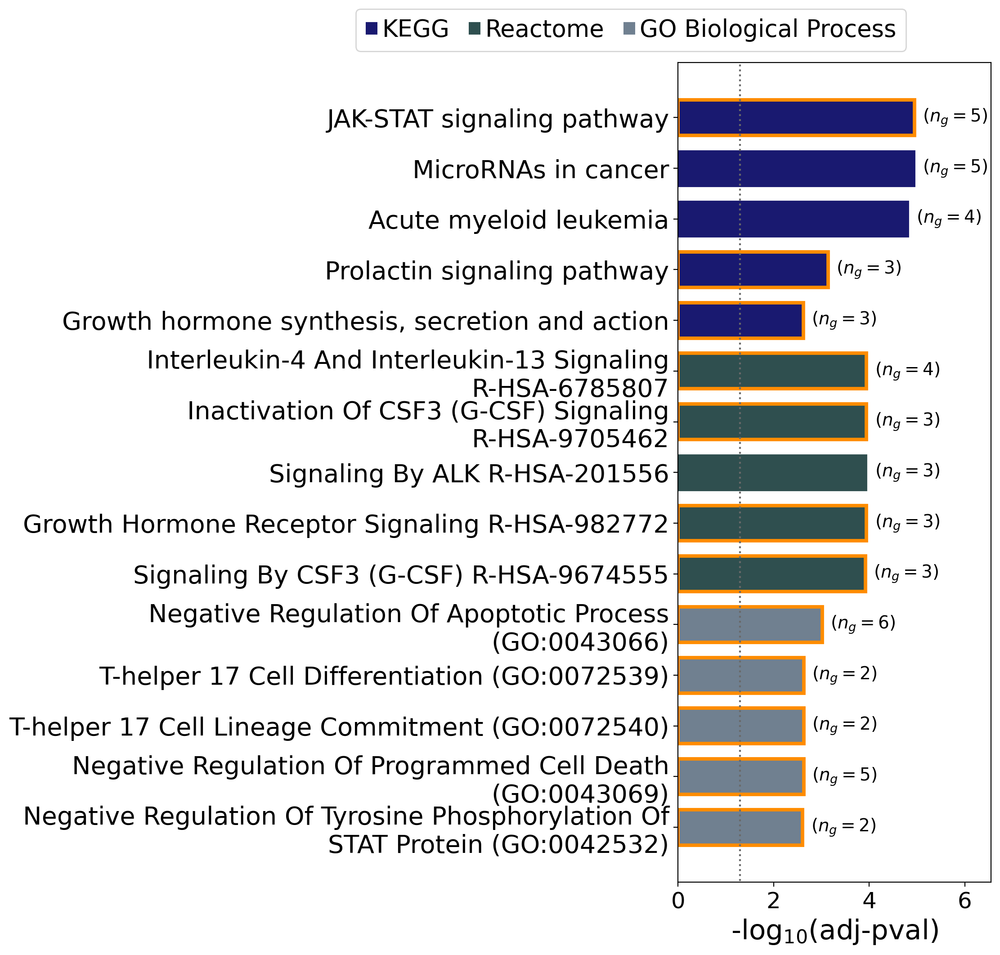

In [88]:
fig, axs = plt.subplots(figsize=(11,10.5), constrained_layout=True) # figsize=(10.7,10.5)

for _, row in plot_df.iterrows():
    bar = axs.barh(y=row["Term"], width=row["mlog10pval"], height=0.7, label=row["Gene_set"], 
                   color=gs_colors[row["Gene_set"]], edgecolor=gs_colors[row["Gene_set"]])[0]
    if "SOCS3" in row.Genes:
        bar.set_edgecolor("darkorange")
        bar.set_linewidth(2.8)

    axs.text(
        x=row["mlog10pval"] + 0.17,
        y=bar.get_y() + bar.get_height() / 2.0,
        s=f"($n_g = {row['N_genes']})$",
        va="center",
        ha="left",
        fontsize=14,
    )
axs.set_xlabel("-log$_{10}$(adj-pval)", fontsize=22)
axs.tick_params(axis="y", labelsize=20)
axs.tick_params(axis="x", labelsize=18)
# Change xlim to fit the "n_g" annotations
axs.set_xlim(axs.get_xlim()[0], max(plot_df["mlog10pval"])+1.6)

legend_handles = []
for db, col in gs_colors.items():
    legend_handles.append(Line2D([0], [0], color=col, lw=10, linestyle="--", label=db))

db_short = {"GO_Biological_Process_2023":"GO Biological Process", "GO_Molecular_Function_2023":"GO Molecular Function", "KEGG_2021_Human":"KEGG", "Reactome_2022":"Reactome"}
# axs.legend(handles=legend_handles, fontsize=19, bbox_to_anchor=(-1.15, 0.98))
axs.legend(handles=legend_handles,
           labels=[db_short[db.get_label()] for db in legend_handles],
           fontsize=19,
           handletextpad=0.2,
           labelspacing=0.1,
           columnspacing=0.8,
           loc="upper center",
           bbox_to_anchor=(-0.15, 1.08),  #  bbox_to_anchor=(1.03, -0.022), 
           ncols=4)
# leg = axs.get_legend()
# for line, text in zip(leg.get_lines(), leg.get_texts()):
#     text.set_color(line.get_color())
#     text.set_weight("bold")

axs.axvline(x=-np.log10(0.05), ymin=axs.get_ylim()[0], ymax=axs.get_ylim()[1], linestyle=":", color="dimgrey")

plt.savefig(os.path.join(model_results_dir, "Figures", "Barplot_GSEA_bio_TopGenes_GxC-Factor232_8-22966769_gradient-colors_longer.pdf"), 
            transparent=True, bbox_inches="tight", dpi=500)
plt.savefig(os.path.join(model_results_dir, "Figures", "Barplot_GSEA_bio_TopGenes_GxC-Factor232_8-22966769_gradient-colors_longer.png"), 
            transparent=True, bbox_inches="tight", dpi=500)
plt.savefig(os.path.join(model_results_dir, "Figures", "Barplot_GSEA_bio_TopGenes_GxC-Factor232_8-22966769_gradient-colors_longer.eps"), 
            transparent=True, bbox_inches="tight", dpi=500)

### Effect on cells

In [50]:
DxC_beta = calculate_DxC_effect(
    DxC_associations = GxC_effects,
    SNP_id = SNP_dict_inv["8:22966769"],
    cell_state_latent = cell_state,
    A = assignment_matrix,
)
DxC_beta.head()

,DxC_Factor232
barcode,
AAACCTGAGAATGTTG-1,0.116130
AAACCTGAGAGAACAG-1,0.048748
AAACCTGAGCATGGCA-1,0.115199
AAACCTGAGTATTGGA-1,0.081567
AAACCTGAGTGTCCCG-1,0.038616


In [51]:
DxC_beta_ct = DxC_beta["DxC_Factor232"].to_frame().merge(adata.obs.cell_label, right_index=True, left_index=True)
DxC_beta_ct = DxC_beta_ct.groupby("cell_label", observed=True).apply(
    lambda x: x["DxC_Factor232"].mean(), include_groups=False
).rename("DxC_Factor232")
DxC_beta_ct

cell_label
B IN         0.047255
B Mem        0.046083
CD4 ET       0.127687
CD4 NC       0.152454
CD4 SOX4     0.153978
CD8 ET       0.038793
CD8 NC       0.124850
CD8 S100B    0.088091
DC           0.043299
Mono C       0.057559
Mono NC      0.046667
NK           0.032546
NK R         0.035132
Plasma       0.022320
Name: DxC_Factor232, dtype: float64

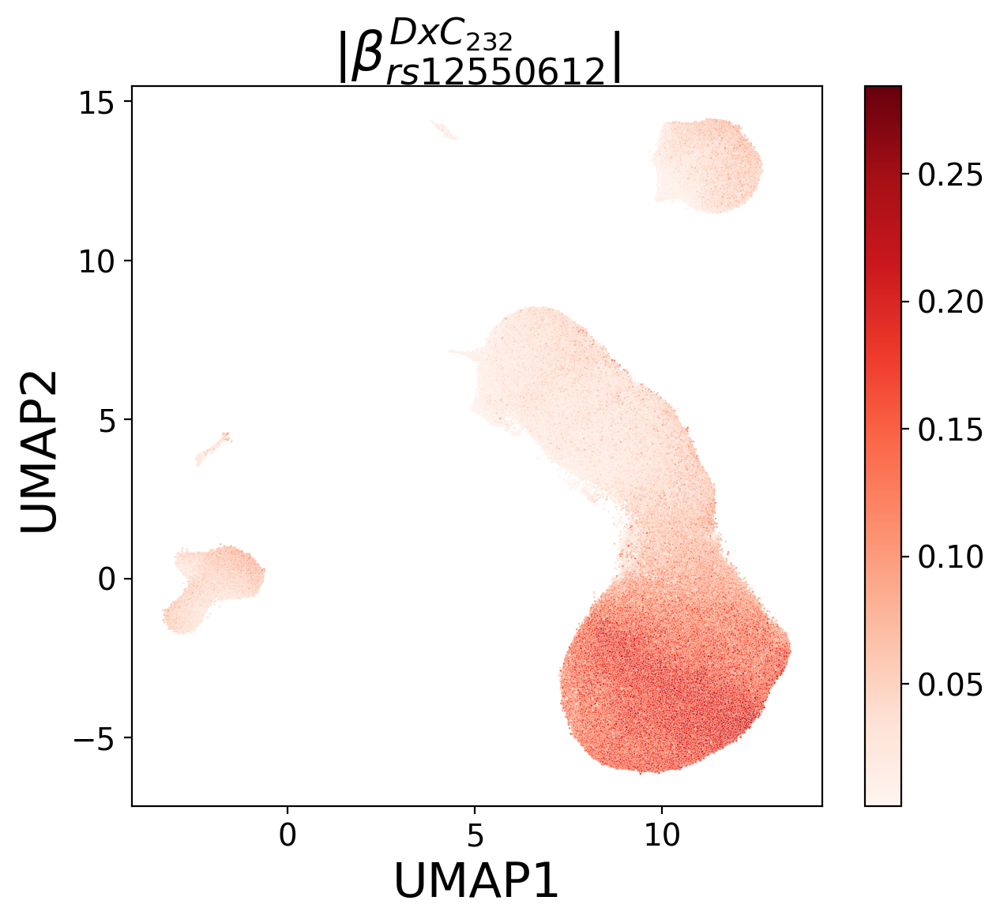

In [92]:
# Absolute effect
fig, axs = plt.subplots(figsize=(7,6))
sns.scatterplot(
    x="UMAP1",
    y="UMAP2",
    hue="DxC_Factor232",
    data=umap_cc.merge(DxC_beta.abs(), right_index=True, left_index=True),
    ax=axs,
    s=1,
    palette="Reds",
    rasterized=True,
    legend=False,
)

sm = cm.ScalarMappable(
    cmap="Reds", 
    norm=colors.Normalize(
        vmin=DxC_beta["DxC_Factor232"].abs().min(),
        vmax=DxC_beta["DxC_Factor232"].abs().max(),
    ),
)
cb = plt.colorbar(sm, ax=axs)

axs.set_title(
    label=fr"$|\beta_{{{rsid}}}^{{DxC_{{232}}}}|$", fontdict={"fontsize": 24}, loc="center"
)
axs.xaxis.label.set_fontsize(22)
axs.yaxis.label.set_fontsize(22)

plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D232_SNP-8-22966769-absolute-effect-on-cells_Reds-cmap.png"),
                         dpi=500, transparent=True, bbox_inches="tight")
plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D232_SNP-8-22966769-absolute-effect-on-cells_Reds-cmap.pdf"),
                         dpi=800, transparent=True, bbox_inches="tight")
plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D232_SNP-8-22966769-absolute-effect-on-cells_Reds-cmap.eps"),
                         dpi=600, transparent=True, bbox_inches="tight")

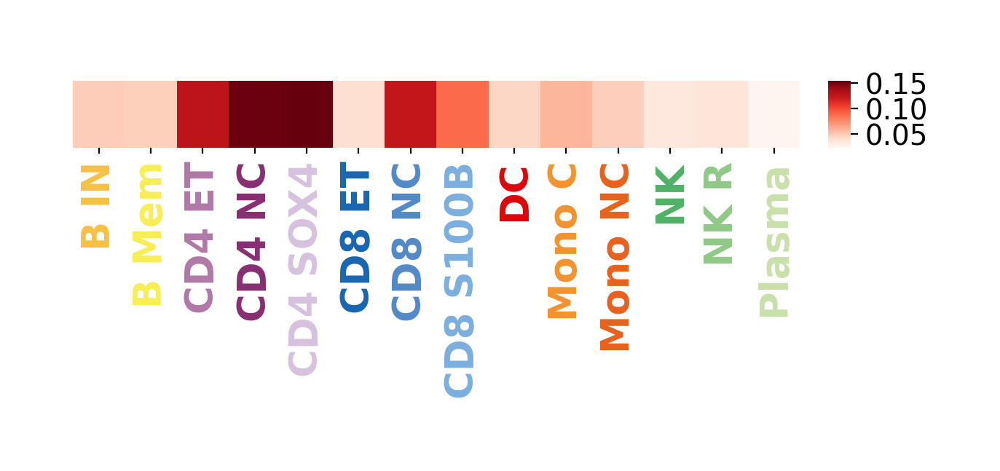

In [492]:
fig, axs = plt.subplots(figsize=(8,0.6))

sns.heatmap(DxC_beta_ct.to_frame().T, cmap="Reds", ax=axs, yticklabels=[], cbar_kws={"anchor":(-0.15,0.5), "aspect":3})

axs.set_xlabel("")
axs.xaxis.label.set_fontsize(23)
axs.tick_params(axis="x", length=3)
for j, label in enumerate(axs.get_xticklabels()):
    label.set_color(cell_label_colors[label.get_text()])
    label.set_fontweight("bold")
    label.set_fontsize(19)

# # add border for visual clarity
# for spine in axs.spines.values():
#     spine.set_visible(True)
#     spine.set_edgecolor("#ededed")
#     spine.set_linewidth(1)
    
plt.savefig(os.path.join(model_results_dir, "Figures", "DxC232_absolute-effect_celltype_heatmap_SNP-8-22966769_Reds-cmap.pdf"), 
            bbox_inches="tight", transparent=True, dpi=600)
plt.savefig(os.path.join(model_results_dir, "Figures", "DxC232_absolute-effect_celltype_heatmap_SNP-8-22966769_Reds-cmap.png"), 
            bbox_inches="tight", transparent=True, dpi=600)
plt.savefig(os.path.join(model_results_dir, "Figures", "DxC232_absolute-effect_celltype_heatmap_SNP-8-22966769_Reds-cmap.eps"), 
            bbox_inches="tight", transparent=True, dpi=600)


In [52]:
sc.settings._vector_friendly = True

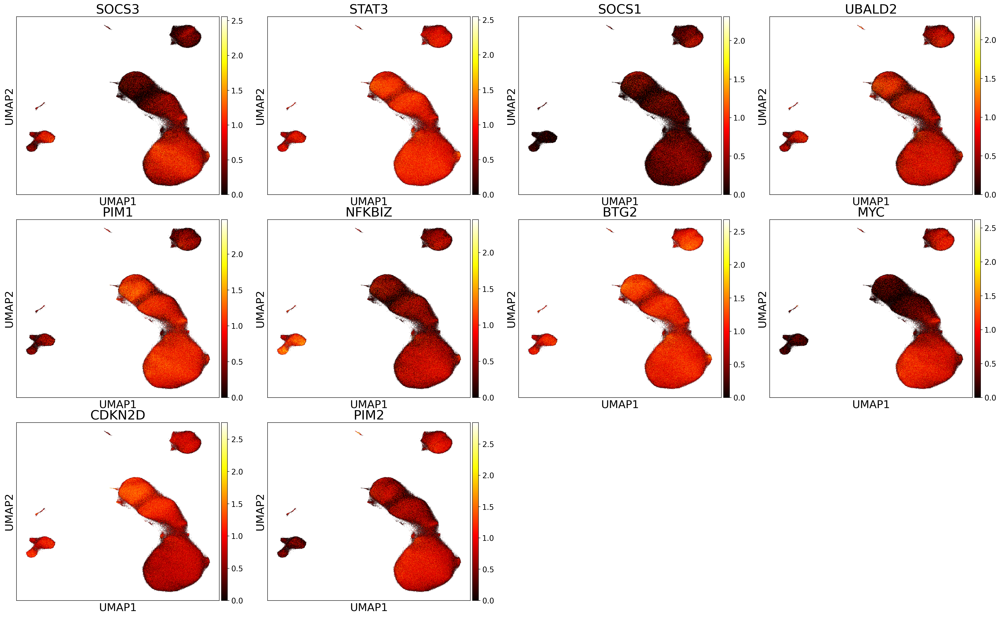

In [220]:
axs = sc.pl.umap(adata,
                 color=DxC_decoder["DxC_Factor232"].abs().nlargest(10).index, 
                 title=adata.var.loc[DxC_decoder["DxC_Factor232"].abs().nlargest(10).index].GeneSymbol, 
                 cmap="hot",
                 size=1,
                 hspace=0.14,
                 save=None,
                 show=False)

for ax in axs:
    ax.set_xlabel("UMAP1", fontsize=20)
    ax.set_ylabel("UMAP2", fontsize=20)
    ax.set_title(ax.get_title(), fontsize=24)


plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_UMAP_top10-genes-GxC232.png"), 
            bbox_inches="tight", transparent=True, dpi=400)


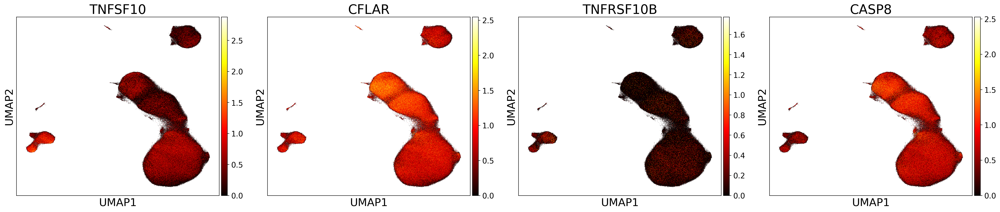

In [376]:
axs = sc.pl.umap(adata,
                 color=["ENSG00000121858", "ENSG00000003402", "ENSG00000120889", "ENSG00000064012"], 
                 title=adata.var.loc[["ENSG00000121858", "ENSG00000003402", "ENSG00000120889", "ENSG00000064012"]].GeneSymbol, 
                 cmap="hot",
                 size=1,
                 hspace=0.14,
                 save=None,
                 show=False)

for ax in axs:
    ax.set_xlabel("UMAP1", fontsize=20)
    ax.set_ylabel("UMAP2", fontsize=20)
    ax.set_title(ax.get_title(), fontsize=24)


plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_UMAP_TRAIL-CASP8-genes2.eps"), 
            bbox_inches="tight", transparent=True, dpi=400)


In [363]:
adata[:, ["ENSG00000121858", "ENSG00000003402", "ENSG00000120889", "ENSG00000064012"]].X.mean(axis=0)

matrix([[0.0618621 , 0.18103342, 0.0095519 , 0.11376279]])

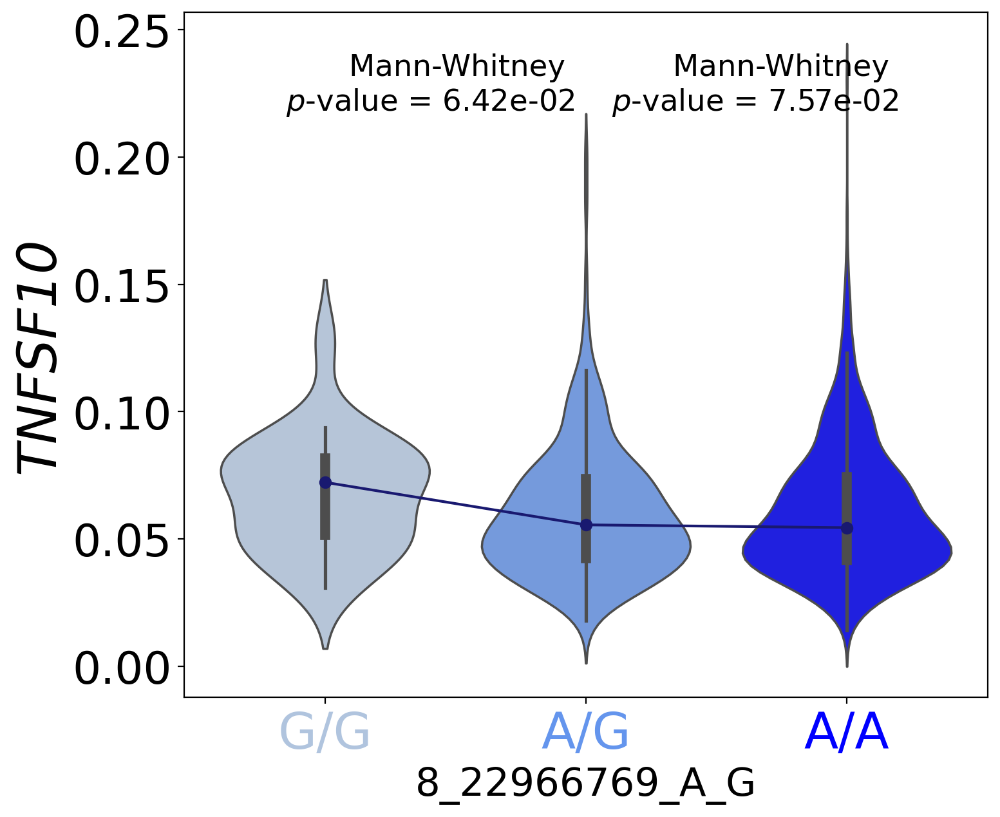

In [44]:
plot_ct_gex_vs_gt(
    adata=adata,
    gene="ENSG00000121858",
    annotation_fontsize=28,
    filter_maf=False,
    cell_indices=adata.obs.index,
    celltype=None,
    celltype_column="cell_label",
    iid_column="individual",
    GT_matrix=GT_matrix,
    SNP_id=SNP_dict_inv["8:22966769"],
    DxC_associations = GxC_effects,
    hgnc_column="GeneSymbol",
    savefig=True,
    output_dir=os.path.join(model_results_dir, "Figures"),
    output_prefix="All-cells",
    format="png",
)

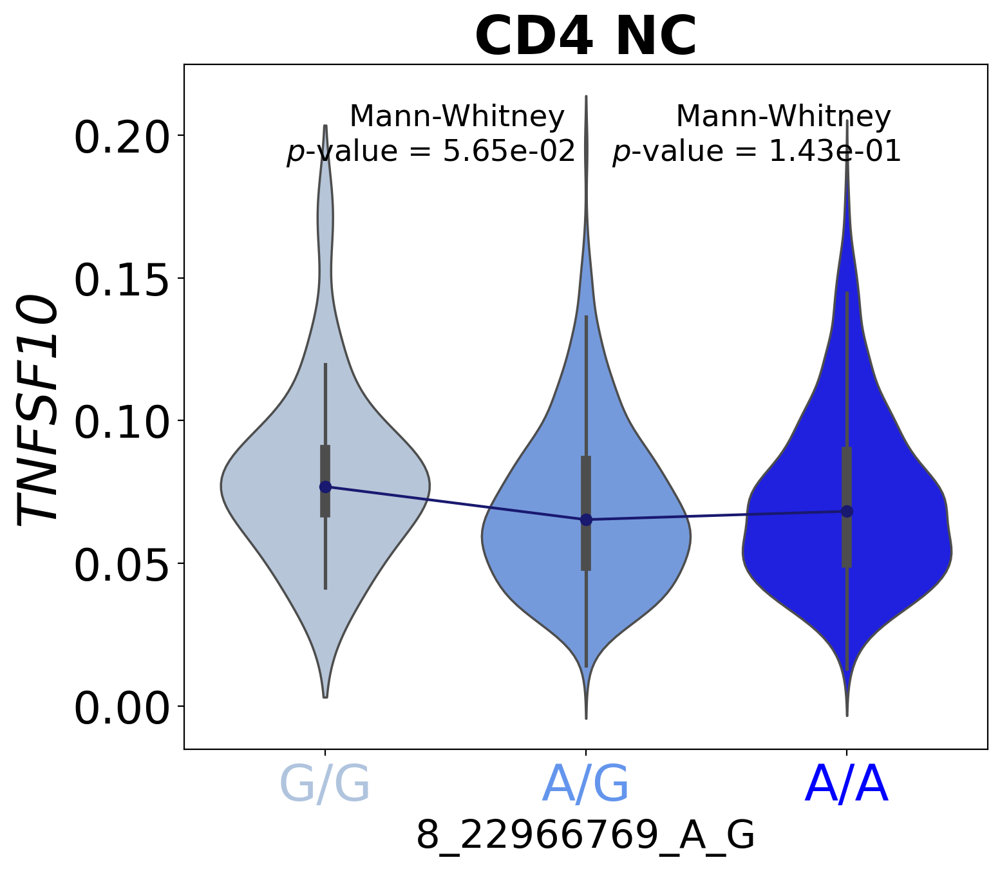

In [43]:
plot_ct_gex_vs_gt(
    adata=adata,
    gene="ENSG00000121858",
    annotation_fontsize=28,
    filter_maf=False,
    cell_indices=None,
    celltype=["CD4 NC"],
    celltype_column="cell_label",
    iid_column="individual",
    GT_matrix=GT_matrix,
    SNP_id=SNP_dict_inv["8:22966769"],
    DxC_associations = GxC_effects,
    hgnc_column="GeneSymbol",
    savefig=True,
    output_dir=os.path.join(model_results_dir, "Figures"),
    format="png",
)

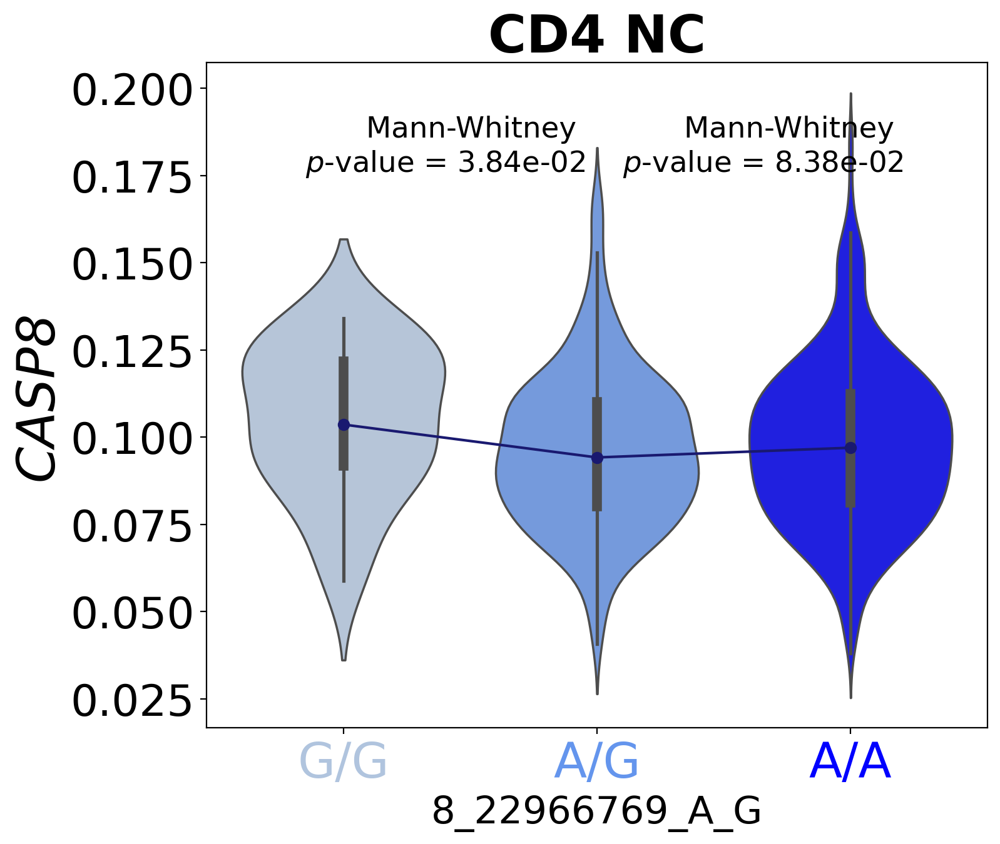

In [45]:
plot_ct_gex_vs_gt(
    adata=adata,
    gene="ENSG00000064012",
    annotation_fontsize=28,
    filter_maf=False,
    cell_indices=None,
    celltype=["CD4 NC"],
    celltype_column="cell_label",
    iid_column="individual",
    GT_matrix=GT_matrix,
    SNP_id=SNP_dict_inv["8:22966769"],
    DxC_associations = GxC_effects,
    hgnc_column="GeneSymbol",
    savefig=True,
    output_dir=os.path.join(model_results_dir, "Figures"),
    format="png",
)

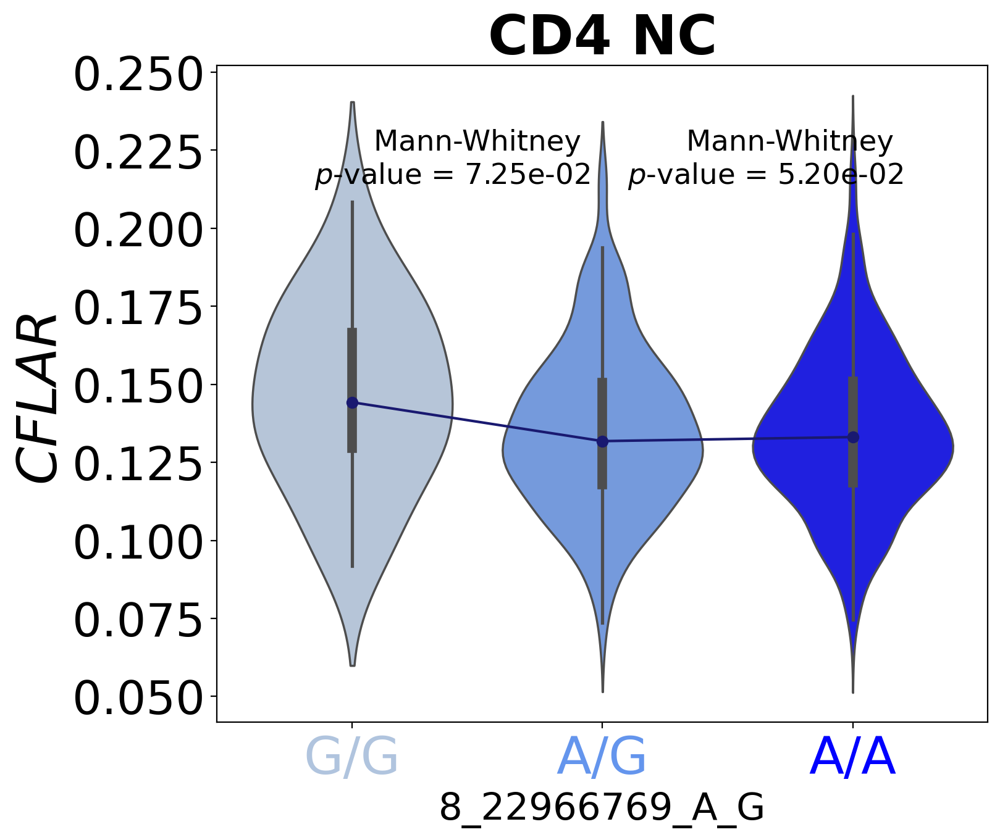

In [48]:
plot_ct_gex_vs_gt(
    adata=adata,
    annotation_fontsize=30,
    gene="ENSG00000003402",
    filter_maf=False,
    cell_indices=None,
    celltype=["CD4 NC"],
    celltype_column="cell_label",
    iid_column="individual",
    GT_matrix=GT_matrix,
    SNP_id=SNP_dict_inv["8:22966769"],
    DxC_associations = GxC_effects,
    hgnc_column="GeneSymbol",
    savefig=True,
    output_dir=os.path.join(model_results_dir, "Figures"),
    format="eps",
)

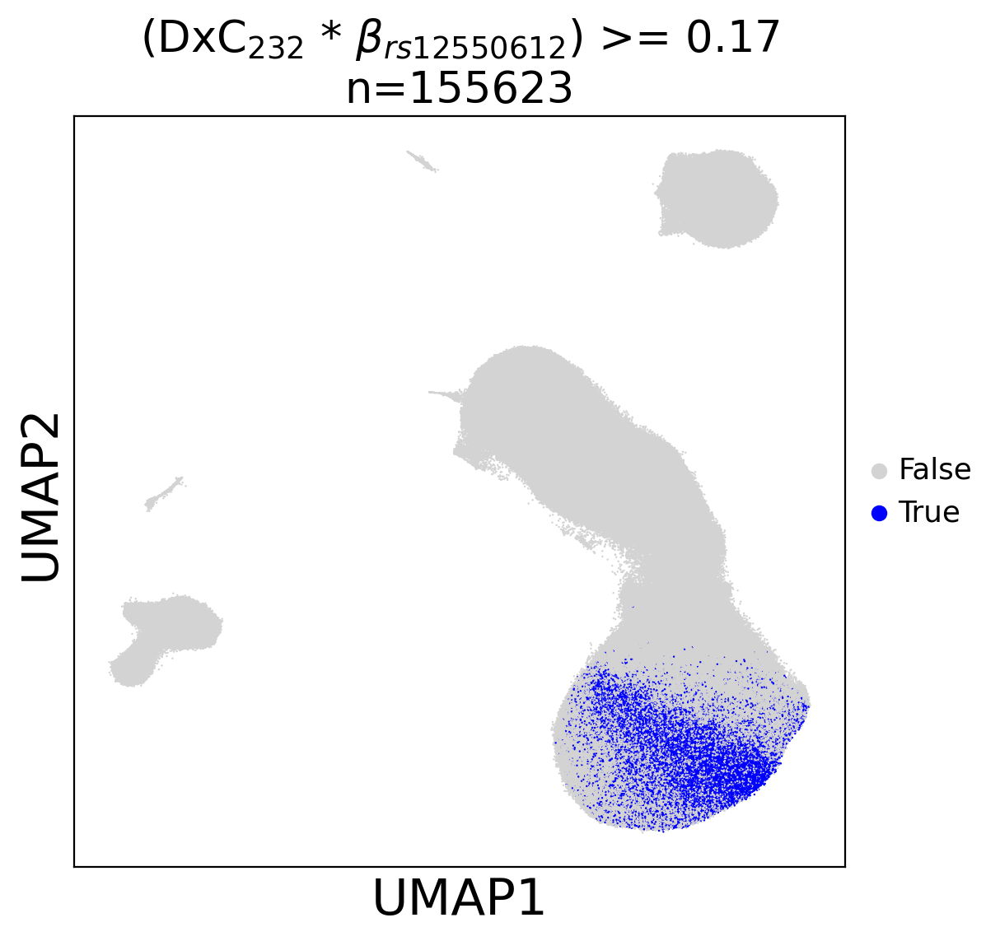

In [93]:
adata.obs = adata.obs.assign(cells2plot = [False]*adata.obs.shape[0])
adata.obs.loc[DxC_beta.loc[DxC_beta["GxC_Factor232"] >= 0.17].index, "cells2plot"] = True

fig, axs = plt.subplots(figsize=(6,6))

sc.pl.umap(adata,
           color="cells2plot", 
           title=fr"(DxC$_{{232}}$ * $\beta_{{{rsid}}}$) >= 0.17"+f"\nn={DxC_beta.loc[DxC_beta['GxC_Factor232'] >= 0.17].shape[0]}",
           size=3,
           palette=["lightgrey", "blue"],
           hspace=0.14,
           save=None,
           show=False,
           ax=axs)

axs.set_xlabel("UMAP1", fontsize=22)
axs.set_ylabel("UMAP2", fontsize=22)
axs.set_title(axs.get_title(), fontdict={"fontsize":19})

plt.savefig(os.path.join(model_results_dir, "Figures", "UMAP-cell-state_highlighted_DxC232-017-cutoff-cells_blue.pdf"), 
            dpi=800, bbox_inches="tight", transparent="True")

In [389]:
adata[DxC_beta.loc[DxC_beta["GxC_Factor232"] >= 0.17].index, :].write("/data/danai/Data/OneK1K/LIVI_cells_8-22966769_GxC232_017-cutoff.h5ad")

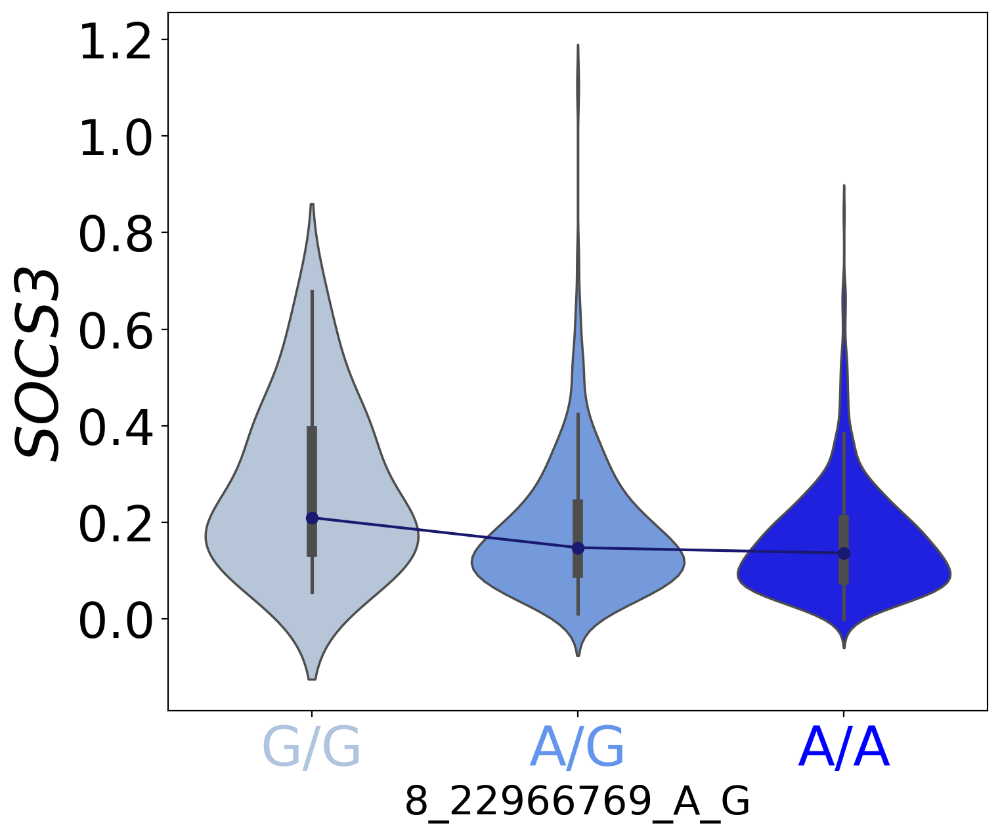

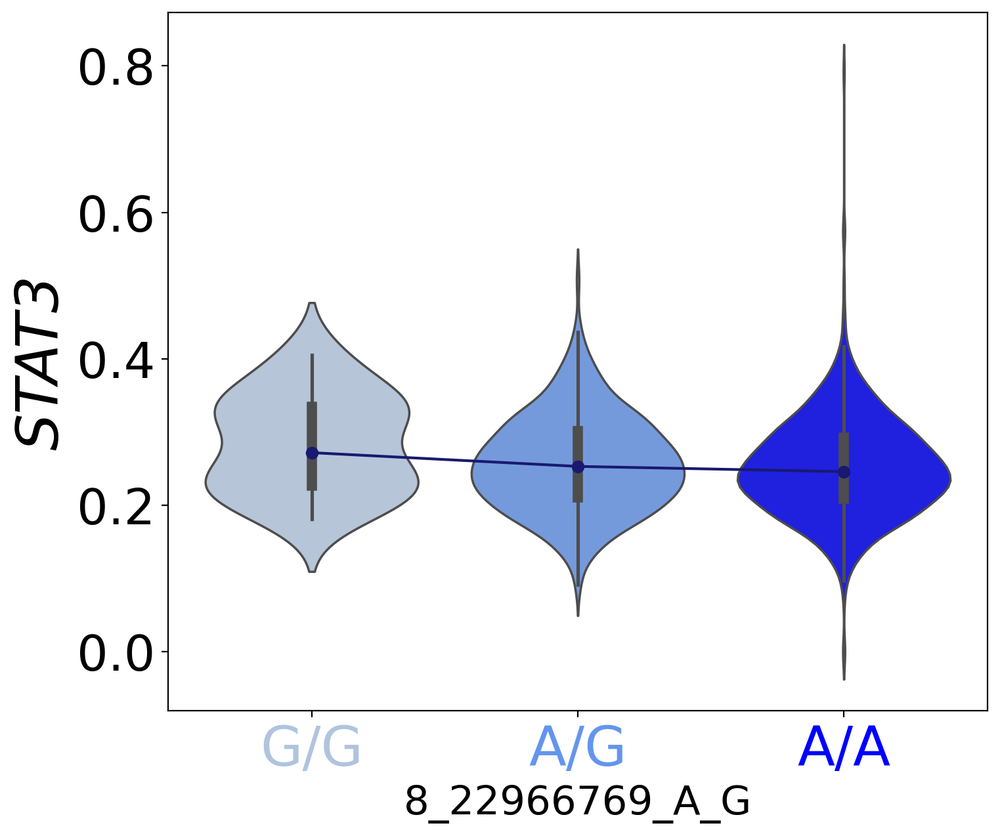

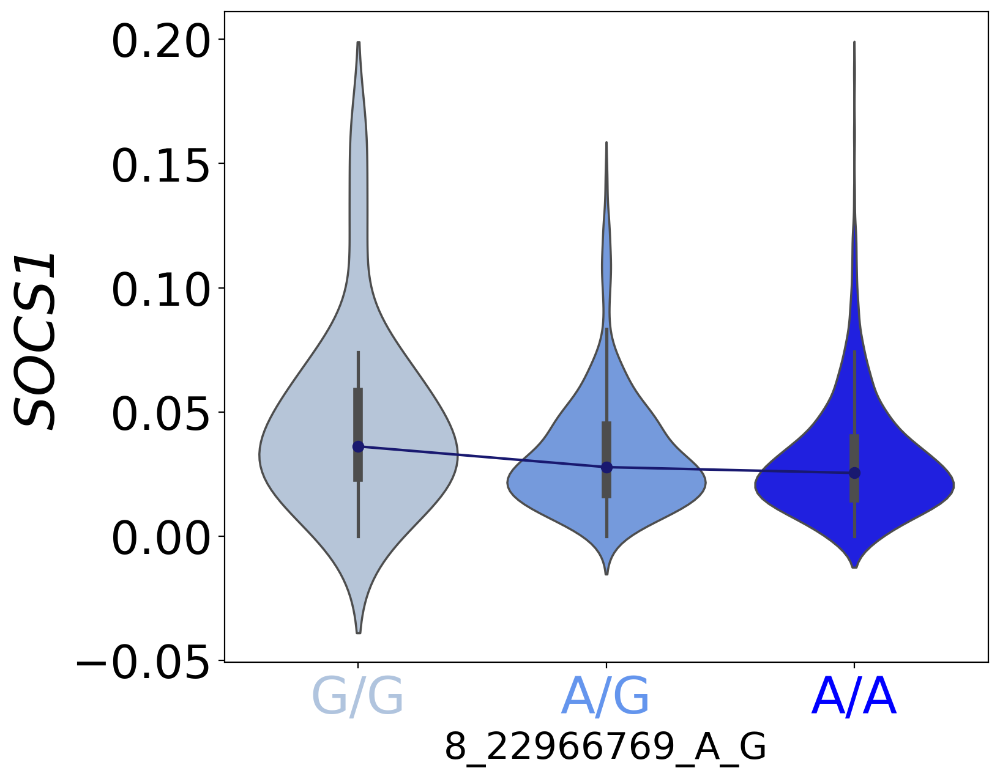

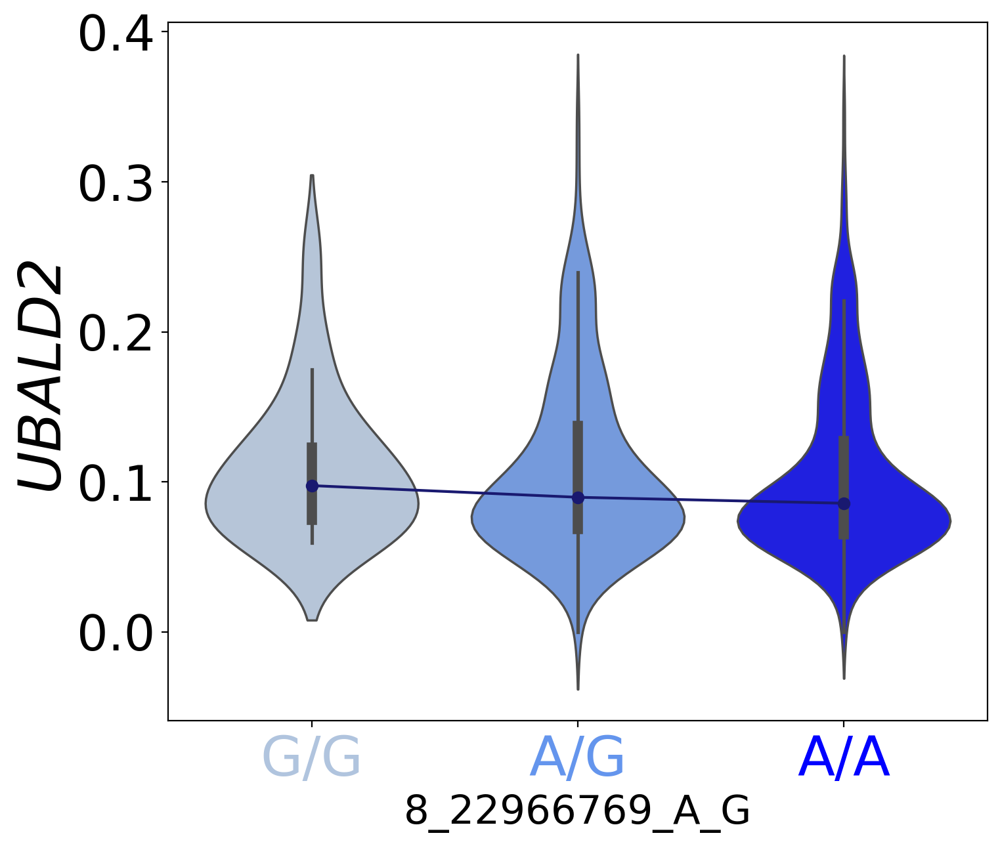

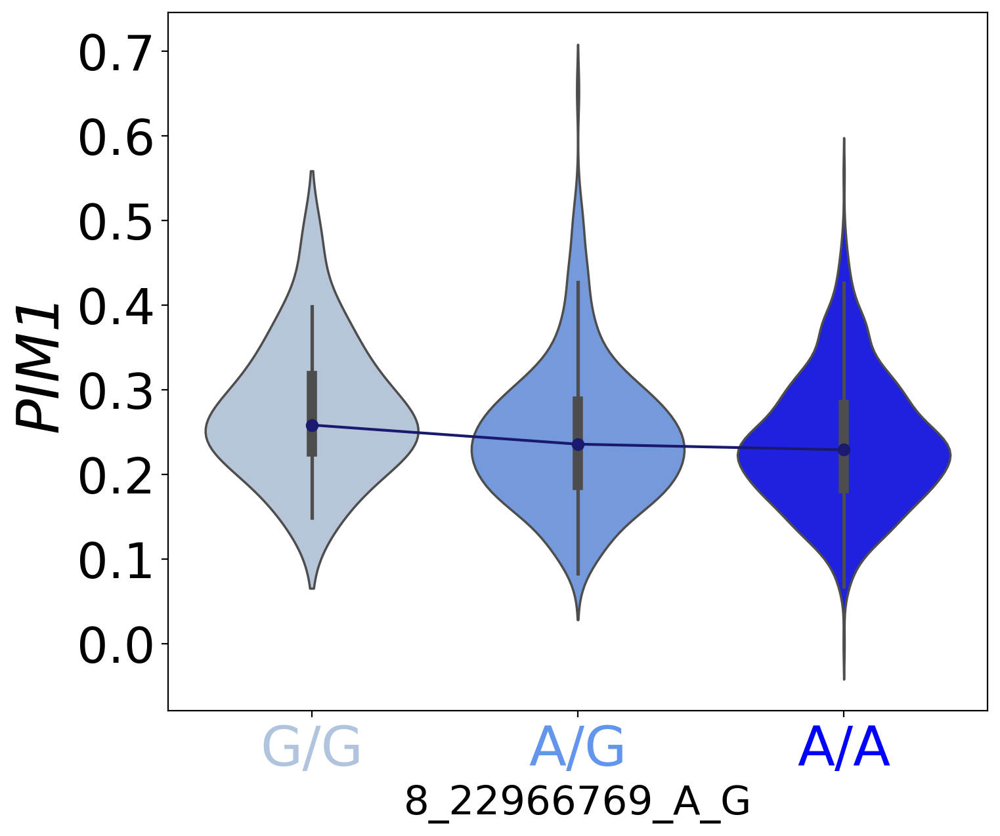

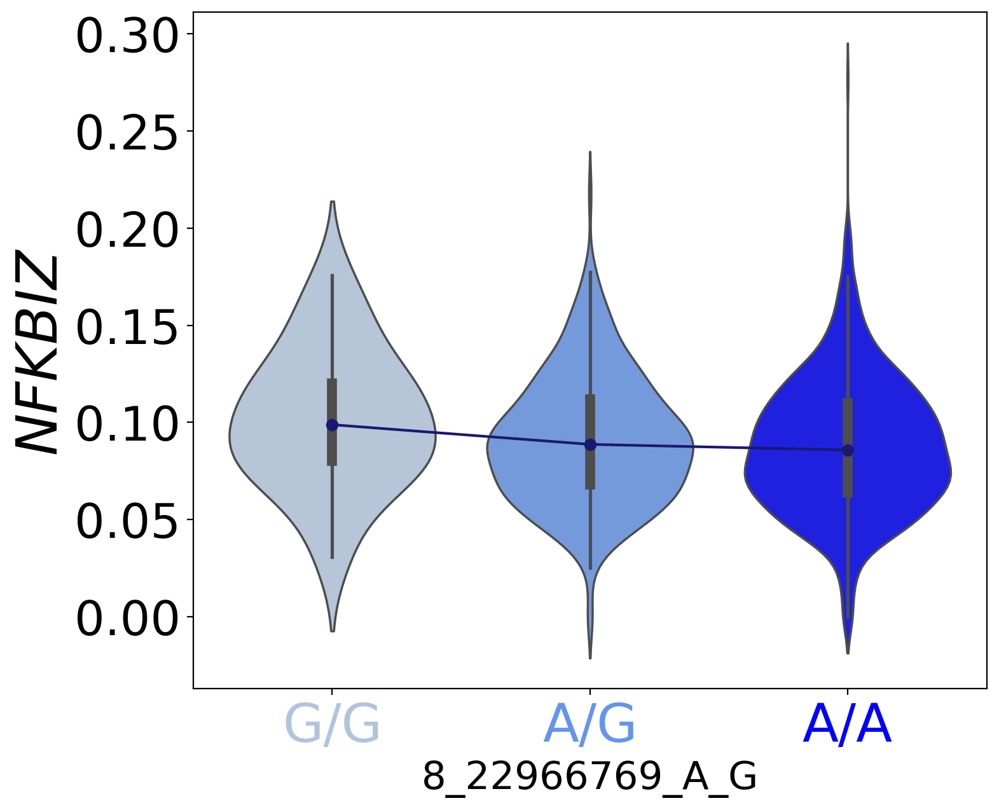

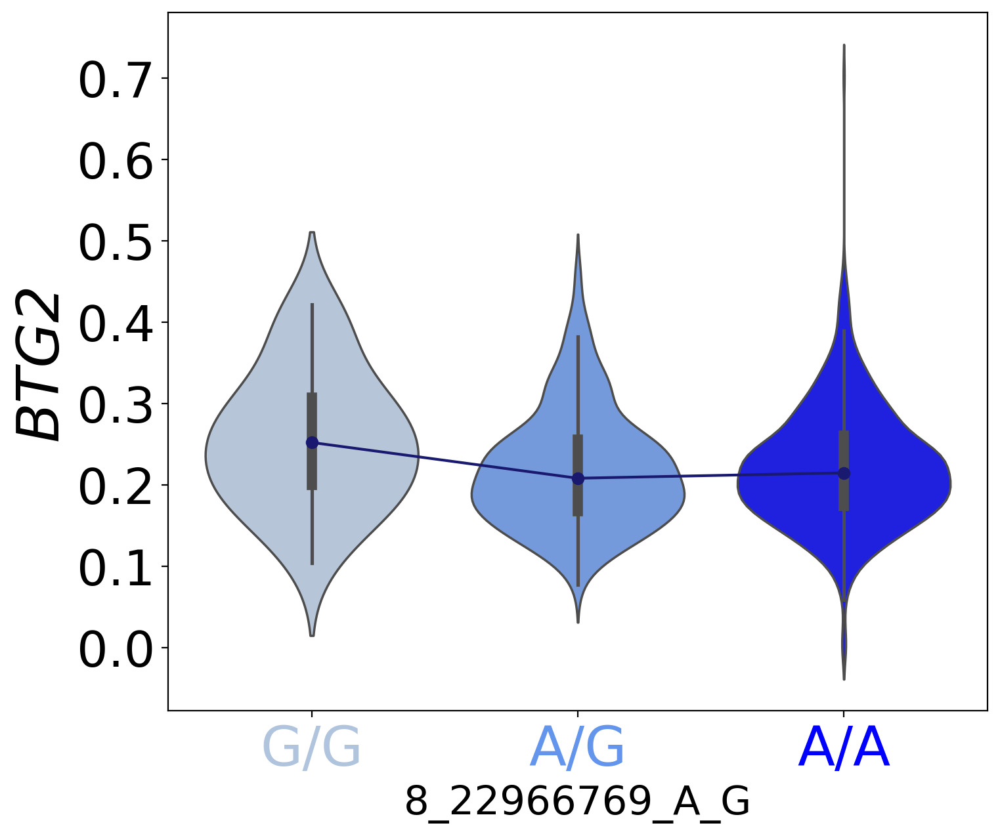

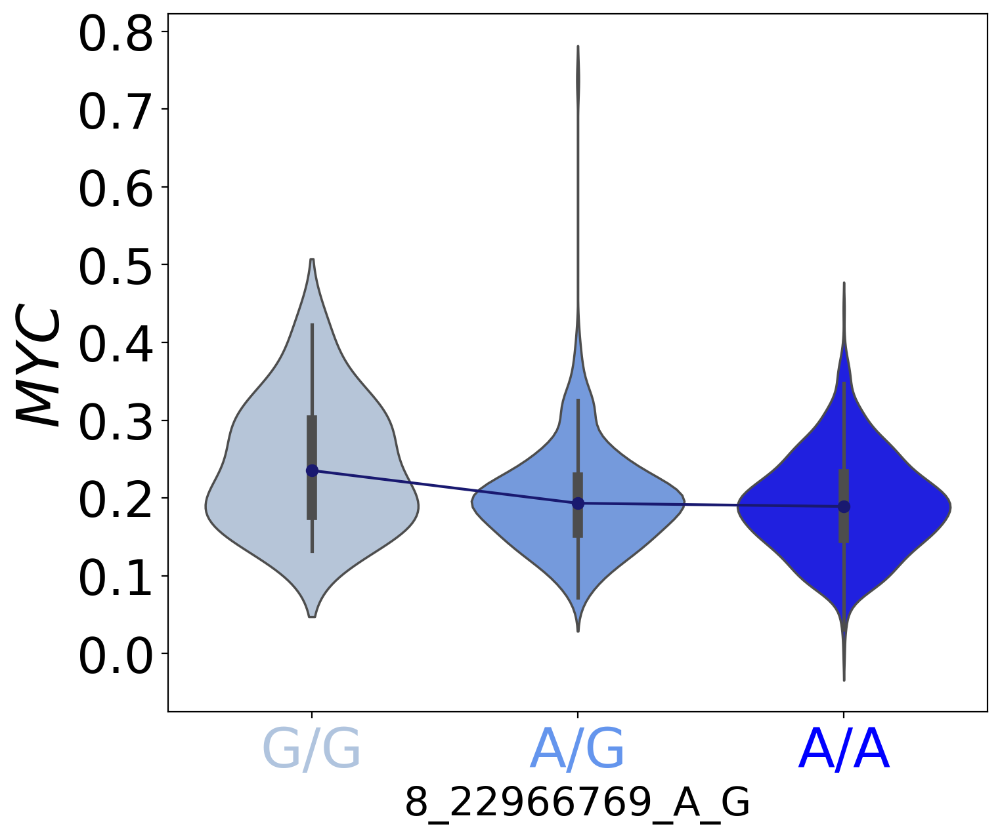

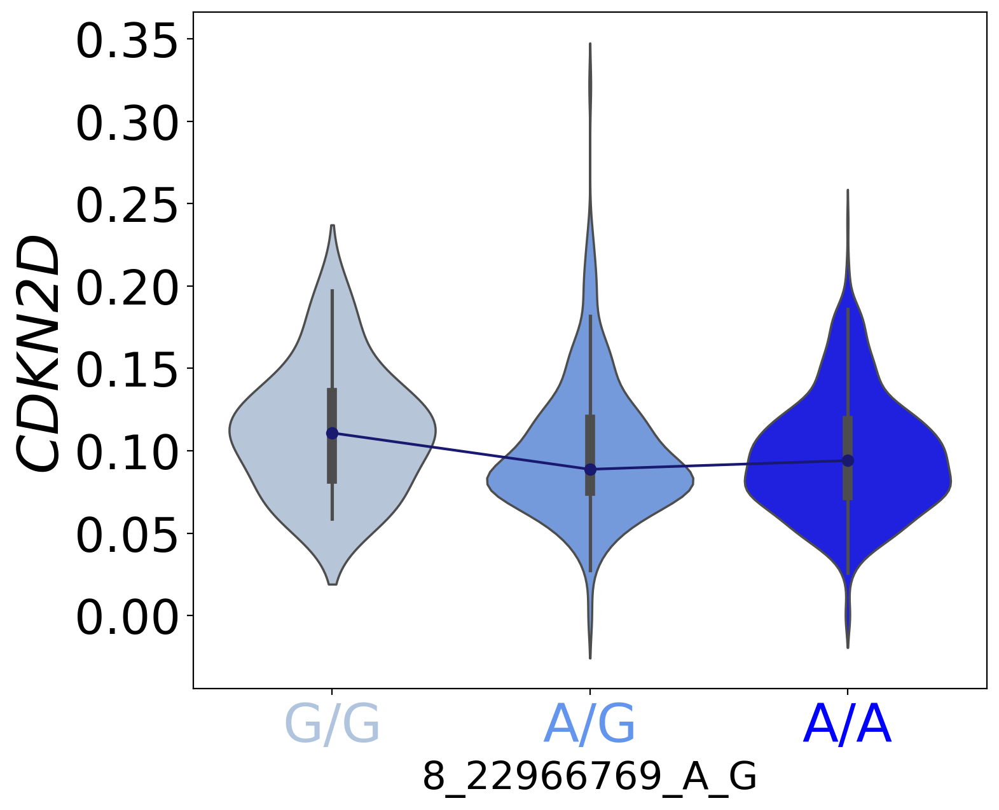

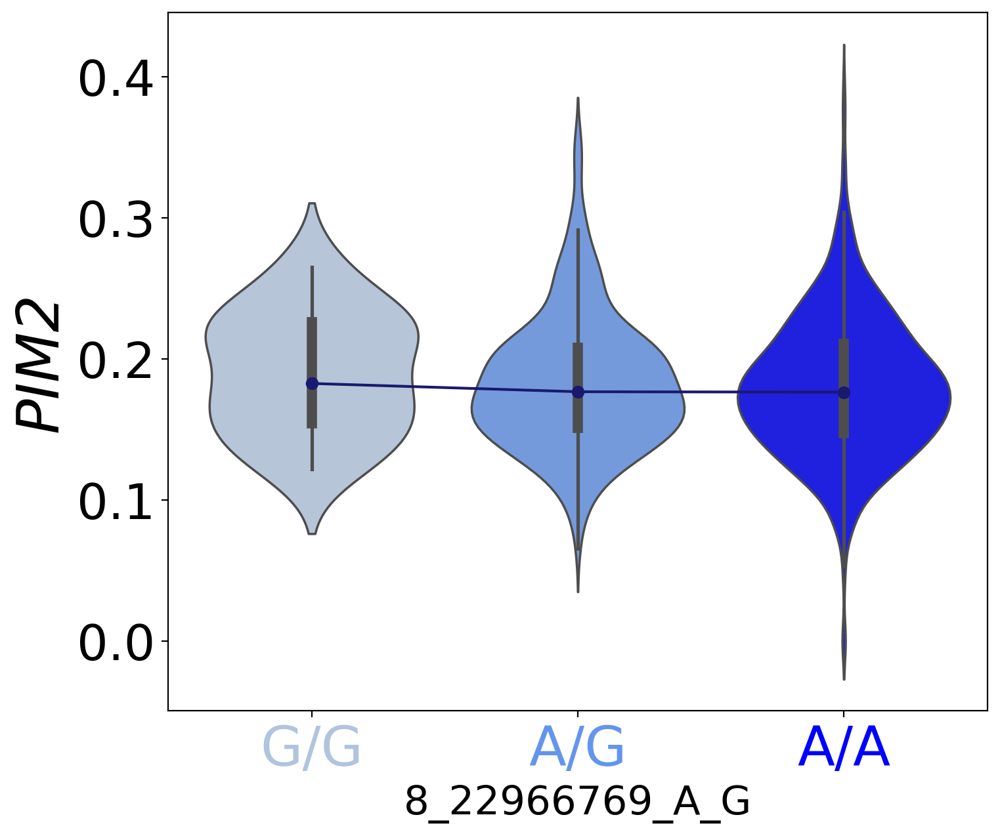

In [98]:
for g in DxC_decoder["DxC_Factor232"].abs().nlargest(10).index:
    plot_ct_gex_vs_gt(
        adata=adata,
        gene=g,
        filter_maf=False,
        test_gt_groups=False,
        annotation_fontsize=30,
        cell_indices=DxC_beta.loc[DxC_beta["GxC_Factor232"] >= 0.17].index,
        celltype=None,
        celltype_column="cell_label",
        iid_column="individual",
        GT_matrix=GT_matrix,
        SNP_id=SNP_dict_inv["8:22966769"],
        GxC_associations = GxC_effects,
        hgnc_column="GeneSymbol",
        savefig=True,
        output_dir=os.path.join(model_results_dir, "Figures"),
        output_prefix="DxC232-017-cutoff_WO-Mann-Whitney",
        format="eps",
    )

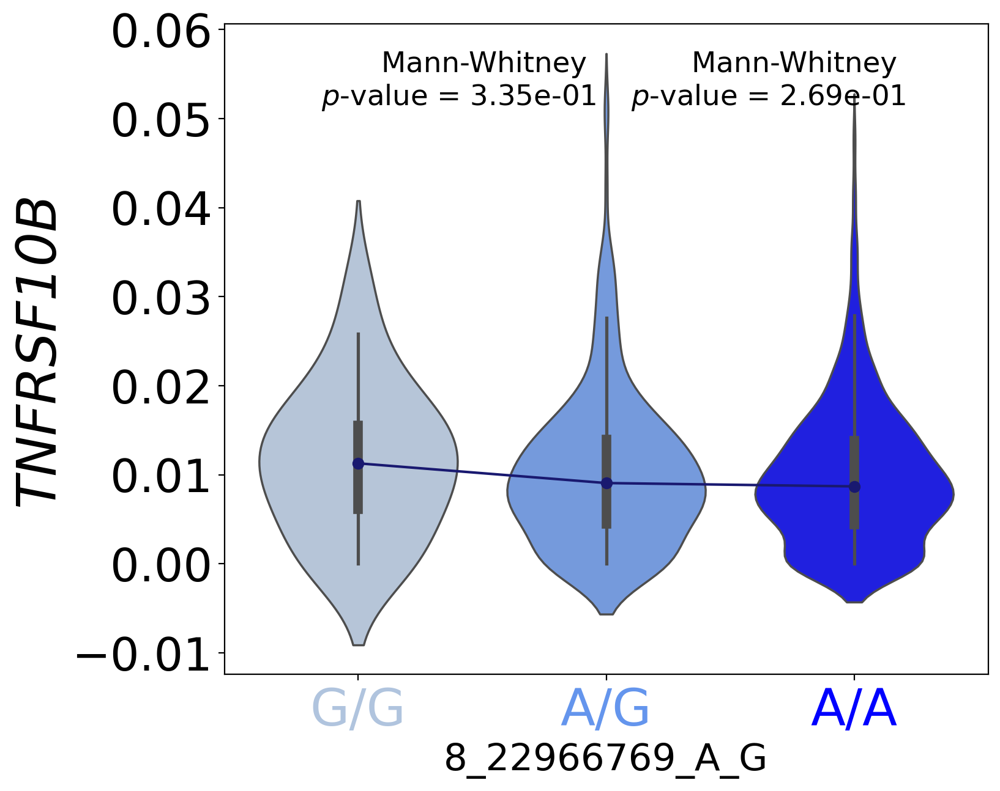

In [73]:
plot_ct_gex_vs_gt(
    adata=adata,
    gene="ENSG00000120889",
    filter_maf=False,
    annotation_fontsize=30,
    cell_indices=DxC_beta.loc[DxC_beta["GxC_Factor232"] >= 0.17].index,
    celltype=None,
    celltype_column="cell_label",
    iid_column="individual",
    GT_matrix=GT_matrix,
    SNP_id=SNP_dict_inv["8:22966769"],
    GxC_associations = GxC_effects,
    hgnc_column="GeneSymbol",
    savefig=True,
    output_dir=os.path.join(model_results_dir, "Figures"),
    output_prefix="DxC232-017-cutoff",
    format="png",
)

### Effect on genes 

In [101]:
effect_on_genes = calculate_GxC_gene_effect(
    GxC_associations = GxC_effects,
    SNP_id = SNP_dict_inv["8:22966769"],
    cell_state_latent = cell_state,
    A = assignment_matrix,
    GxC_decoder = DxC_decoder.loc[DxC_decoder["DxC_Factor232"].abs().nlargest(17).index],
    factor_id = "U_Factor232"
)
effect_on_genes = effect_on_genes.merge(adata.obs.cell_label, right_index=True, left_index=True)
effect_on_genes.head()

,ENSG00000184557,ENSG00000168610,ENSG00000185338,ENSG00000185262,ENSG00000137193,ENSG00000144802,ENSG00000159388,ENSG00000136997,ENSG00000129355,ENSG00000102096,ENSG00000168209,ENSG00000134333,ENSG00000198355,ENSG00000059804,ENSG00000062716,ENSG00000157514,ENSG00000057657,cell_label
barcode,,,,,,,,,,,,,,,,,,
AAACCTGAGAATGTTG-1,-0.039044,-0.021264,-0.012950,-0.012904,-0.012411,-0.011870,-0.011792,-0.011436,-0.011236,-0.009818,-0.009182,-0.008445,-0.008293,-0.007992,-0.007916,0.007868,-0.005705,CD4 ET
AAACCTGAGAGAACAG-1,-0.016390,-0.008926,-0.005436,-0.005417,-0.005210,-0.004983,-0.004950,-0.004800,-0.004717,-0.004122,-0.003854,-0.003545,-0.003481,-0.003355,-0.003323,0.003303,-0.002395,NK
AAACCTGAGCATGGCA-1,-0.038731,-0.021093,-0.012847,-0.012801,-0.012311,-0.011774,-0.011697,-0.011344,-0.011146,-0.009740,-0.009109,-0.008377,-0.008226,-0.007928,-0.007852,0.007805,-0.005659,CD4 NC
AAACCTGAGTATTGGA-1,-0.027424,-0.014935,-0.009096,-0.009064,-0.008717,-0.008337,-0.008282,-0.008032,-0.007892,-0.006896,-0.006449,-0.005932,-0.005825,-0.005613,-0.005560,0.005526,-0.004007,CD8 S100B
AAACCTGAGTGTCCCG-1,-0.012983,-0.007071,-0.004306,-0.004291,-0.004127,-0.003947,-0.003921,-0.003803,-0.003736,-0.003265,-0.003053,-0.002808,-0.002758,-0.002658,-0.002632,0.002616,-0.001897,CD8 ET


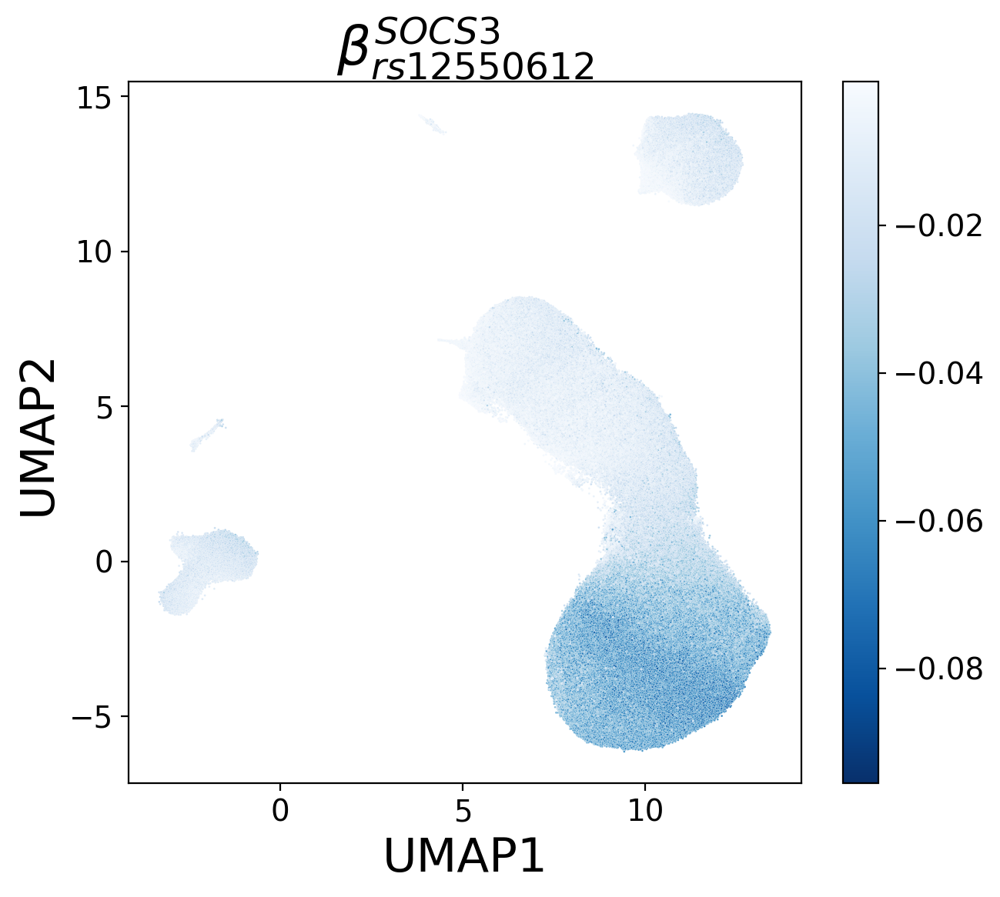

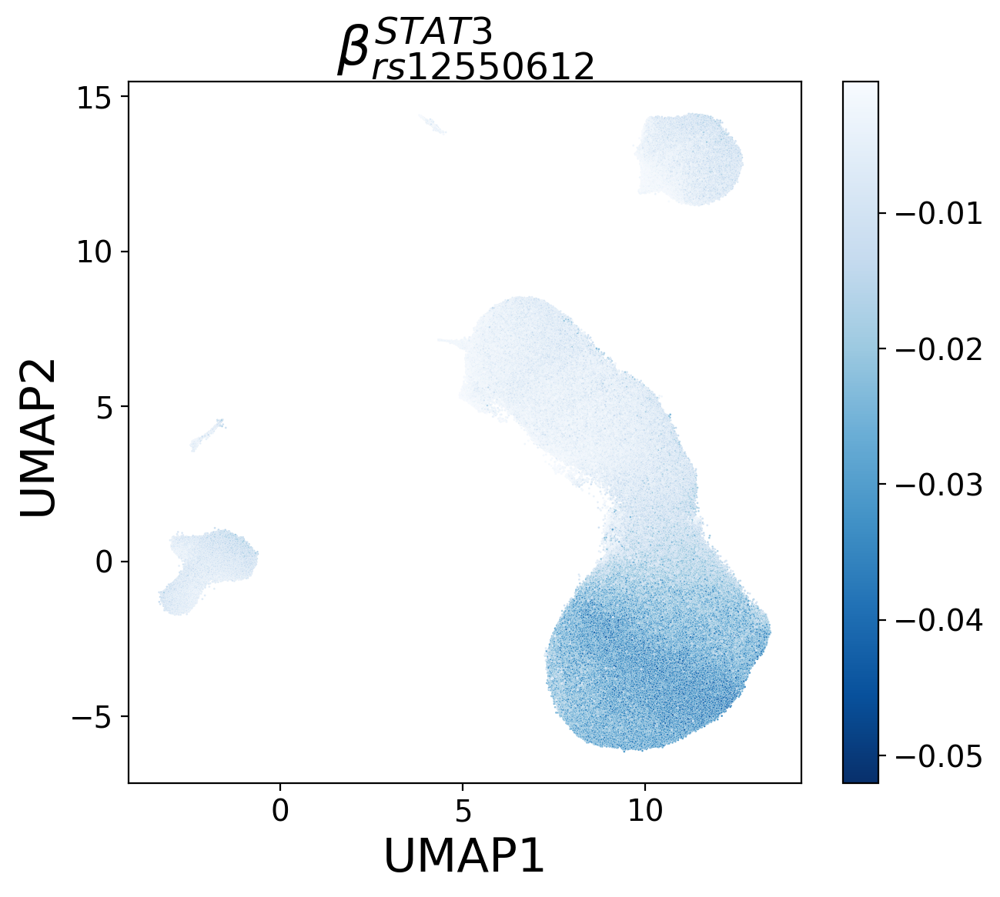

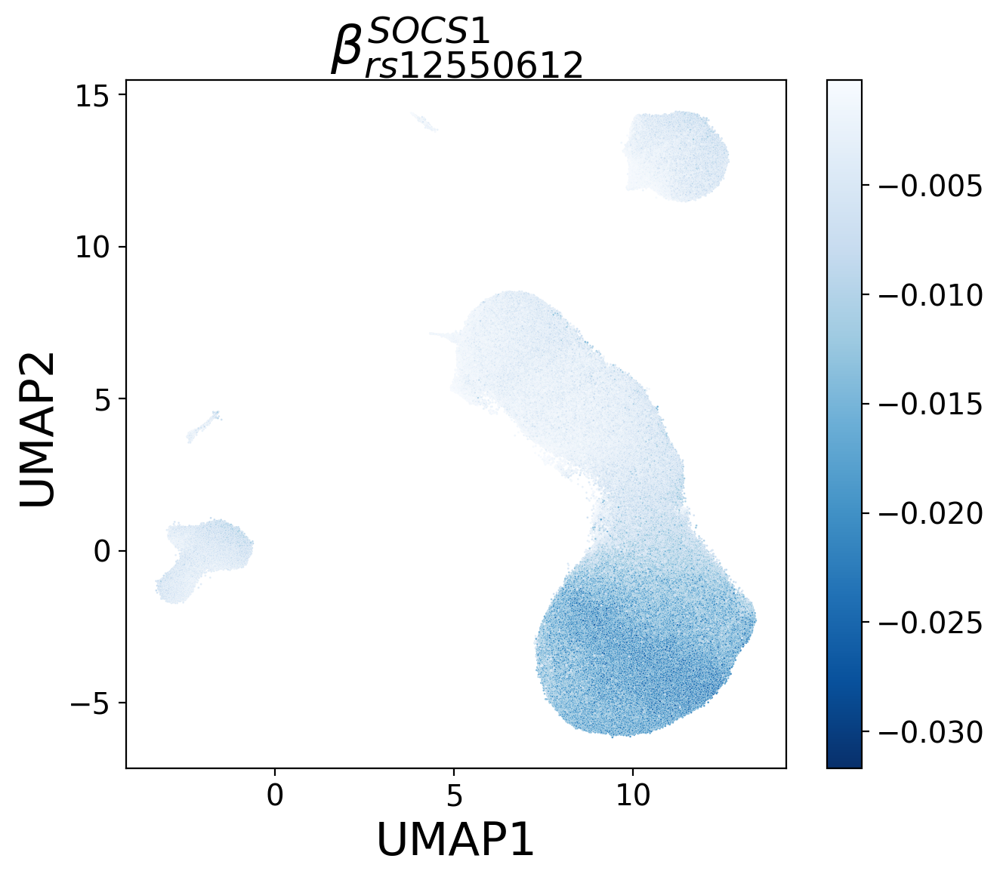

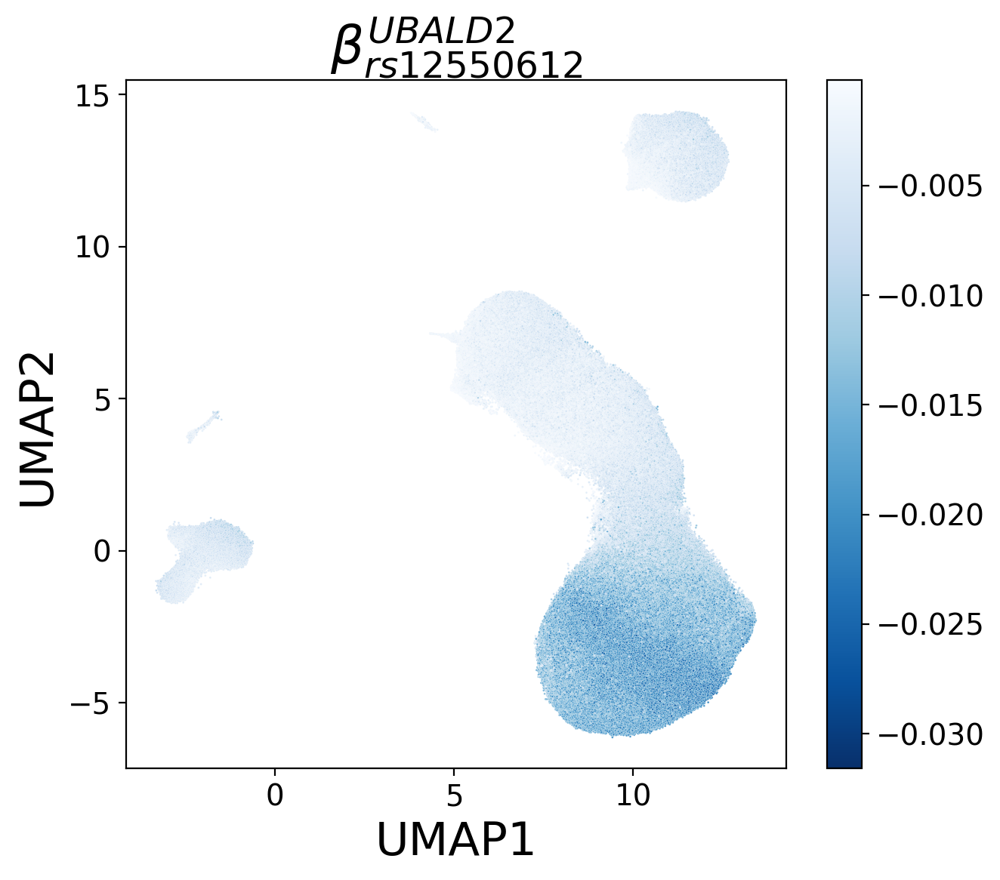

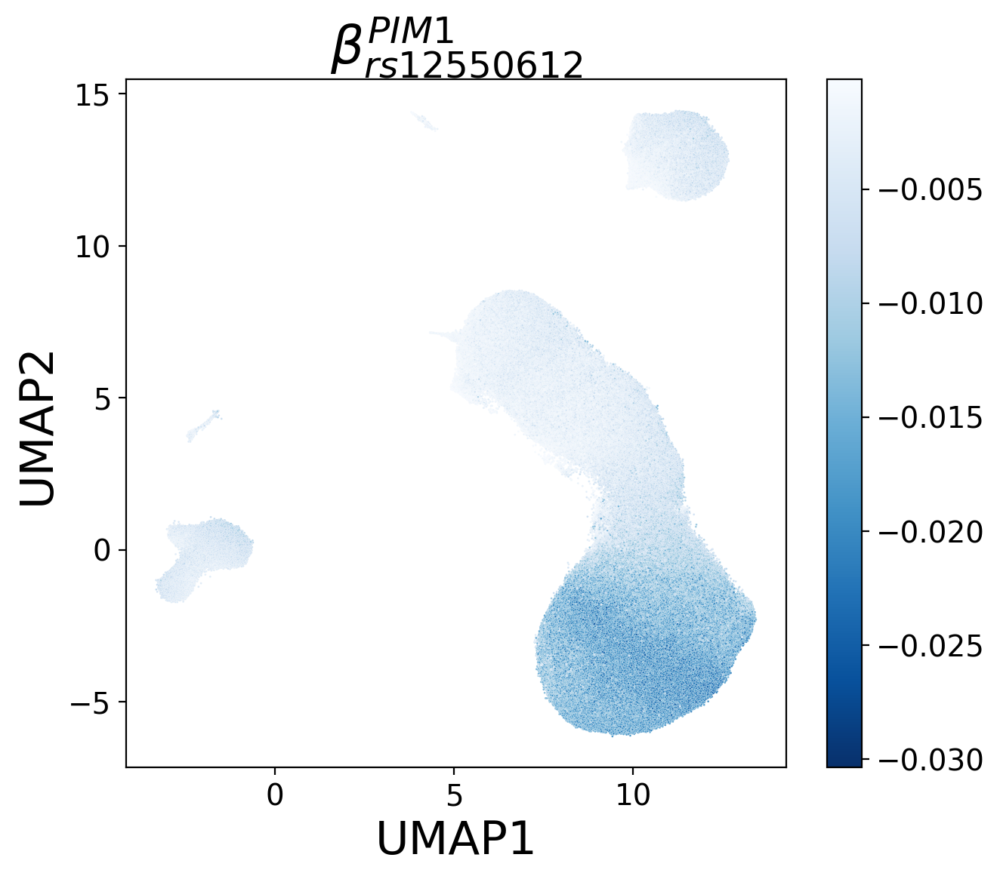

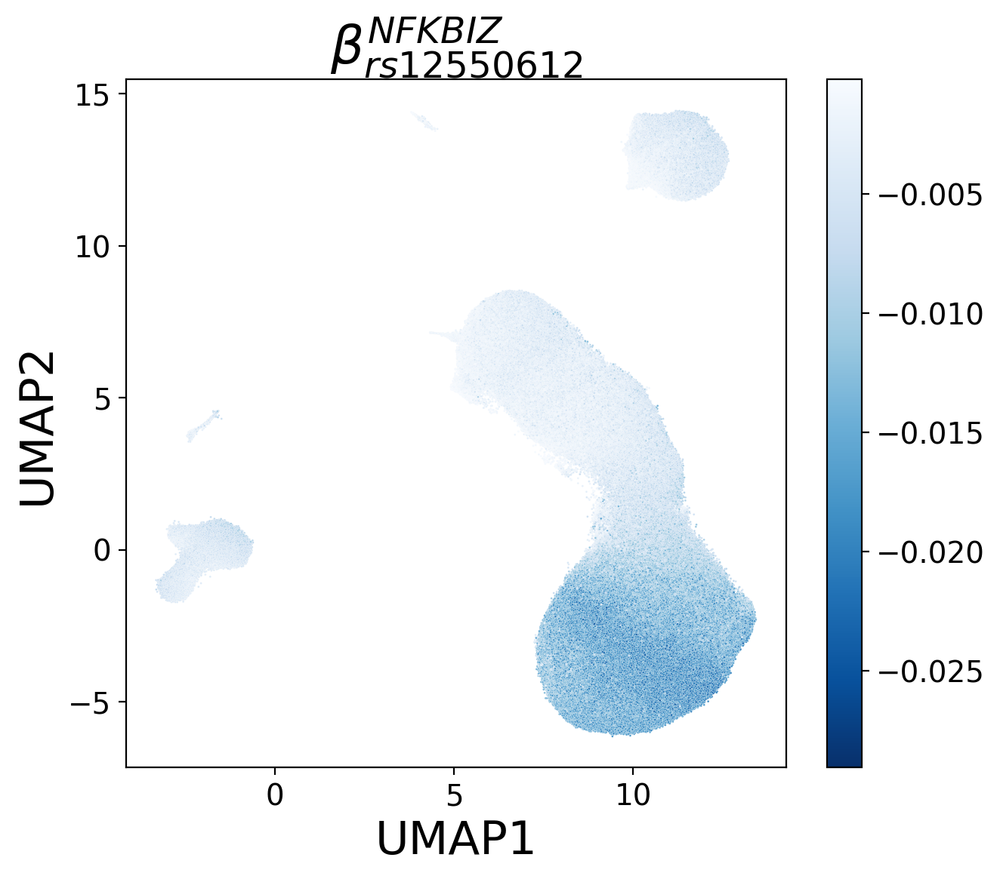

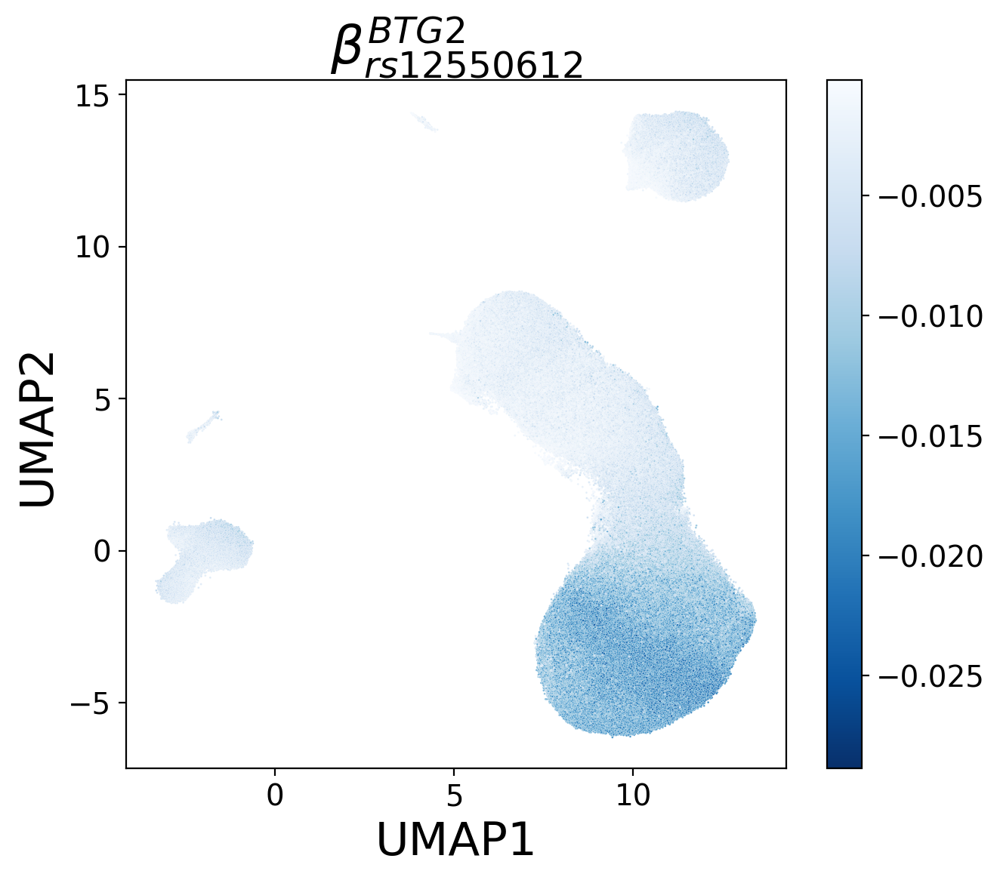

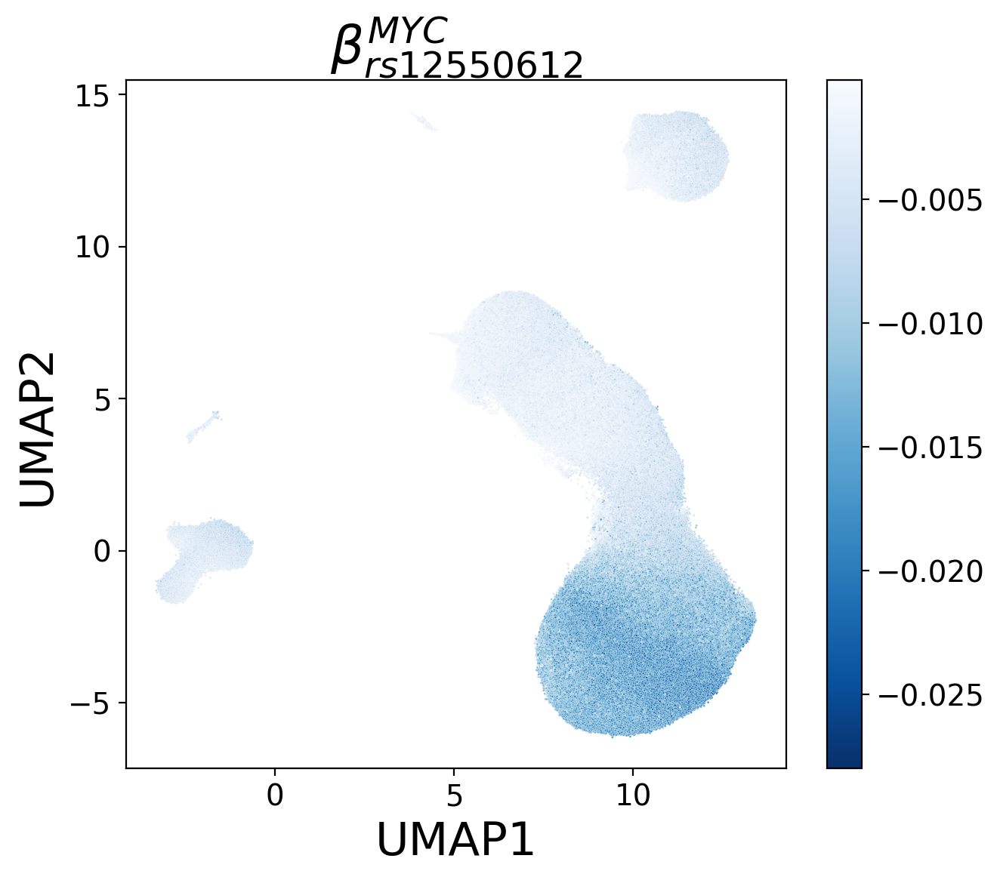

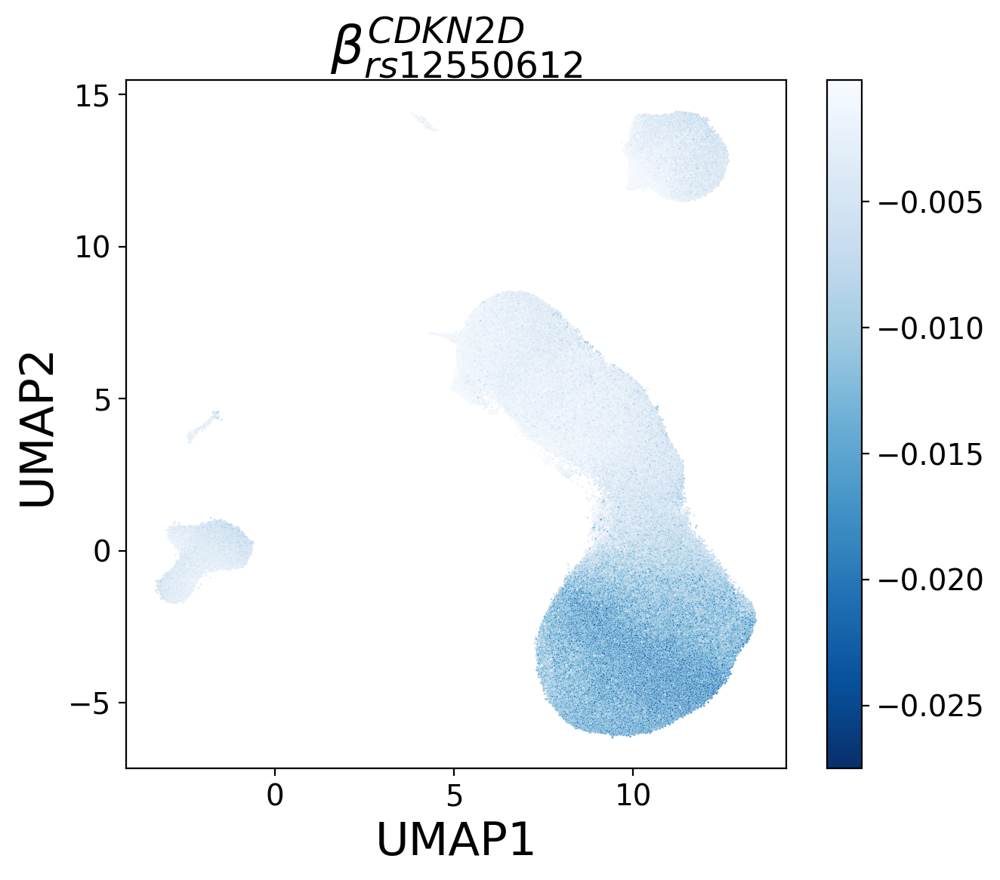

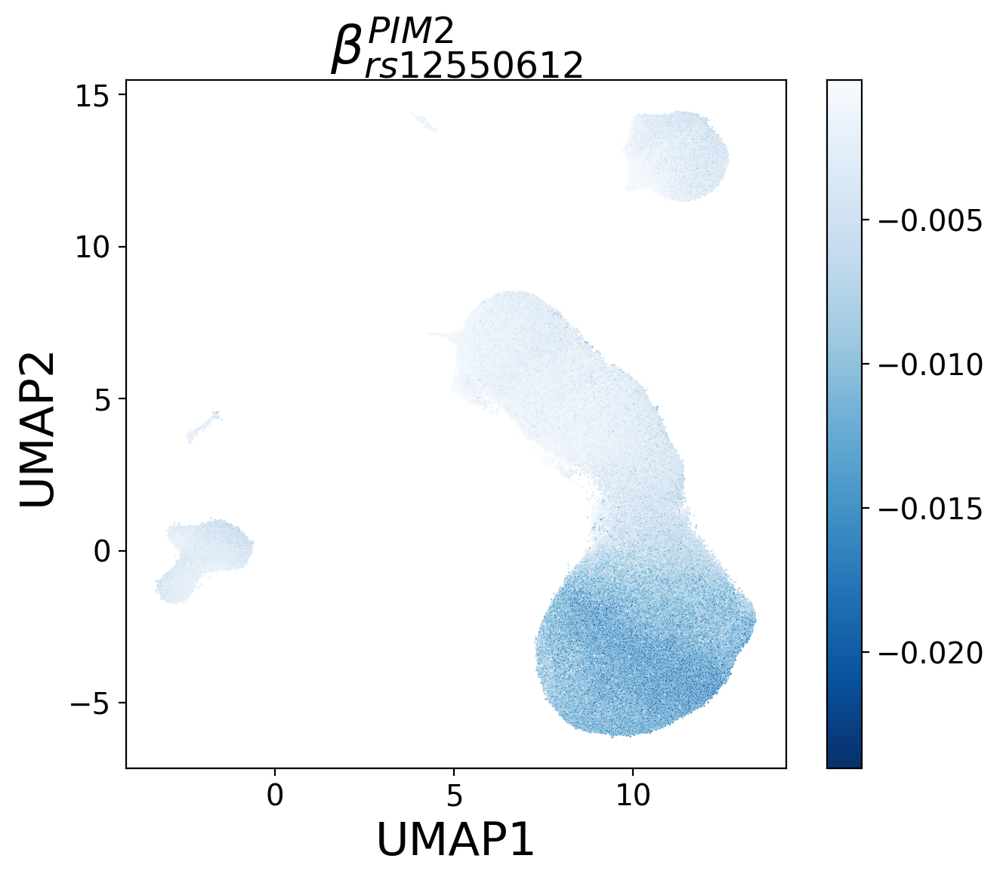

In [105]:
for g in DxC_decoder["DxC_Factor232"].abs().nlargest(10).index:

    hgnc_name = adata.var.loc[g].GeneSymbol
    if effect_on_genes[g].min() < 0 and effect_on_genes[g].max() <= 0:
        comap = "Blues_r" 
    else:
        comap="Reds"
    
    fig, axs = plt.subplots(figsize=(7,6))
    sns.scatterplot(
        x="UMAP1",
        y="UMAP2",
        hue=g,
        data=umap_cc.merge(effect_on_genes[g], right_index=True, left_index=True),
        ax=axs,
        s=1,
        palette=comap,
        rasterized=True,
        legend=False,
    )

    Norm = colors.Normalize(vmin=effect_on_genes[g].min(), vmax=effect_on_genes[g].max())
    sm = cm.ScalarMappable(cmap=comap, norm=Norm)
    cb = plt.colorbar(sm, ax=axs)
    
    axs.set_title(
        label=fr"$\beta_{{{rsid}}}^{{{hgnc_name}}}$", fontdict={"fontsize": 25}, loc="center"
    )
    axs.set_xlabel("UMAP1", fontsize=22)
    axs.set_ylabel("UMAP2", fontsize=22)
    
    plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D232_SNP-8-22966769-effect-on-{hgnc_name}.png"),
                             dpi=500, transparent=True, bbox_inches="tight")
    plt.savefig(os.path.join(model_results_dir, "Figures", f"{model}_D232_SNP-8-22966769-effect-on-{hgnc_name}.pdf"),
                             dpi=800, transparent=True, bbox_inches="tight")

### Circos plot

In [84]:
# Load hg38 dataset (https://github.com/moshi4/pycirclize-data/tree/main/eukaryote/hg38)
chr_bed_file, cytoband_file, _ = load_eukaryote_example_dataset("hg38")

In [89]:
# Get positions of SNP and genes in GRCh38 coords
pos_hg38 = snp_mapping.loc[snp_mapping.SNP_id_hg19 == "8:22966769"].SNP_id_hg38.iloc[0]
pos_hg38

'8:23109256'

In [88]:
# Genomic coords obtaiend from biomart
genes_hg38 = pd.read_csv(
    os.path.join(model_results_dir, "TopGenes_IDs_GxC232_Biomart.txt"), 
    sep="\t")
genes_hg38.rename(columns={"Gene stable ID":"feature_id", 
                          "Gene name":"gene_name",
                          "Chromosome/scaffold name":"gene_chromosome", 
                          "Gene start (bp)":"gene_start", 
                          "Gene end (bp)":"gene_end"},
                 inplace=True)
genes_hg38.head()

,feature_id,gene_start,gene_end,gene_chromosome,gene_name
0,ENSG00000057657,105993463,106109939,6,PRDM1
1,ENSG00000059804,7919230,8019007,12,SLC2A3
2,ENSG00000062716,59707192,59842255,17,VMP1
3,ENSG00000102096,48913182,48919024,X,PIM2
4,ENSG00000129355,10566460,10569059,19,CDKN2D


In [90]:
genes_hg38 = genes_hg38.assign(gene_middle = (genes_hg38.gene_end + genes_hg38.gene_start)//2)

In [93]:
positive_effect = effect_on_genes.filter(like="ENSG").T.sum(axis=1) > 0
positive_effect = positive_effect.rename("positive_effect").to_frame().reset_index(names="feature_id")
positive_effect

,feature_id,positive_effect
0,ENSG00000184557,False
1,ENSG00000168610,False
2,ENSG00000185338,False
3,ENSG00000185262,False
4,ENSG00000137193,False
5,ENSG00000144802,False
6,ENSG00000159388,False
7,ENSG00000136997,False
8,ENSG00000129355,False
9,ENSG00000102096,False


In [94]:
genes_hg38 = genes_hg38.merge(positive_effect, on="feature_id", how="left")
genes_hg38

,feature_id,gene_start,gene_end,gene_chromosome,gene_name,gene_middle,positive_effect
0,ENSG00000057657,105993463,106109939,6,PRDM1,106051701,False
1,ENSG00000059804,7919230,8019007,12,SLC2A3,7969118,False
2,ENSG00000062716,59707192,59842255,17,VMP1,59774723,False
3,ENSG00000102096,48913182,48919024,X,PIM2,48916103,False
4,ENSG00000129355,10566460,10569059,19,CDKN2D,10567759,False
5,ENSG00000134333,18394347,18408425,11,LDHA,18401386,False
6,ENSG00000136997,127735434,127742951,8,MYC,127739192,False
7,ENSG00000137193,37170152,37175428,6,PIM1,37172790,False
8,ENSG00000144802,101827991,101861022,3,NFKBIZ,101844506,False
9,ENSG00000157514,107713221,107777342,X,TSC22D3,107745281,True


In [96]:
## Add SNP-gene links
links = []
chr_snp = "chr"+pos_hg38.split(":")[0]
pos_snp = int(pos_hg38.split(":")[1])
for _, row in genes_hg38.sort_values(["gene_chromosome", "gene_middle"], ascending=True).iterrows():
    links.append((chr_snp, pos_snp, "chr"+str(row.gene_chromosome), row.gene_middle, row.gene_name, row.positive_effect))

links[:3]

[('chr8', 23109256, 'chr1', 203307546, 'BTG2', False),
 ('chr8', 23109256, 'chr10', 72274979, 'DDIT4', False),
 ('chr8', 23109256, 'chr11', 18401386, 'LDHA', False)]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


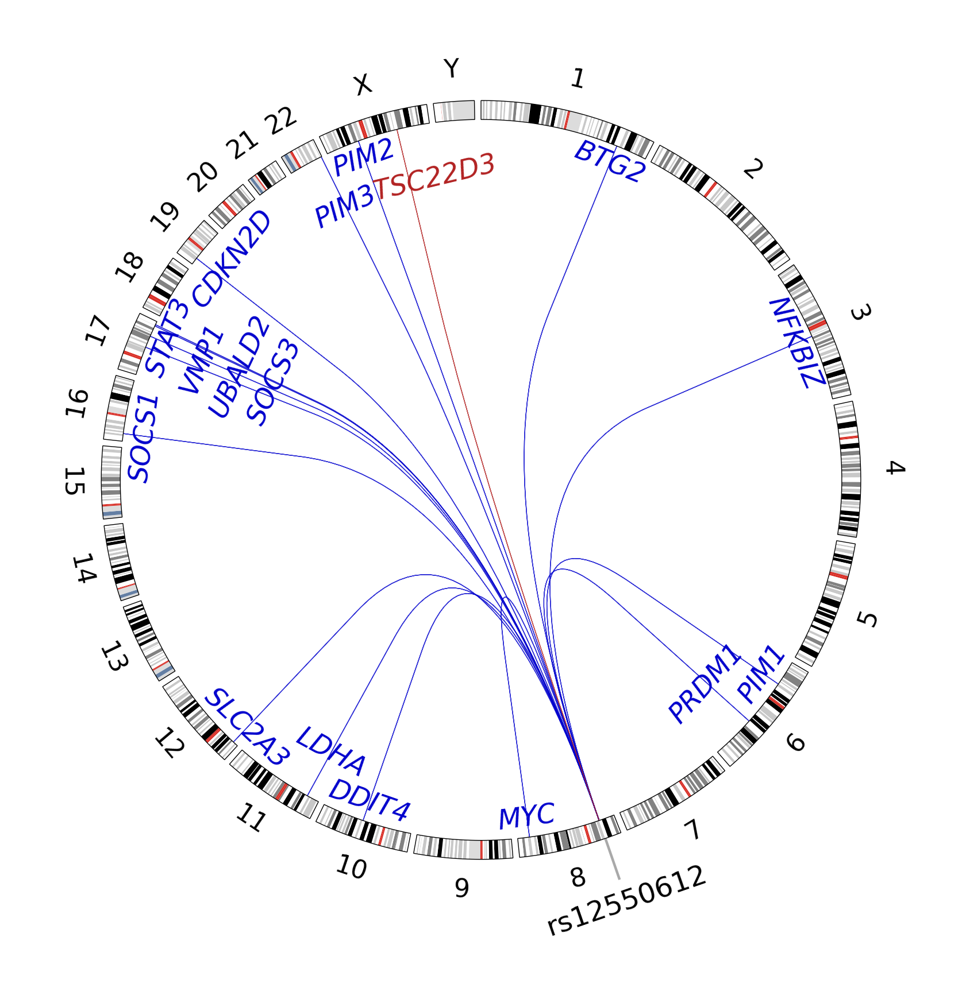

In [467]:
circos = Circos.initialize_from_bed(chr_bed_file, space=1)

# Add cytoband tracks from cytoband file
circos.add_cytoband_tracks((95, 100), cytoband_file)

# Plot chromosome name
for sector in circos.sectors:
    sector.text(sector.name.replace("chr", ""), size=16)

# Annotate SNP
sector = circos.get_sector(chr_snp)

track1 = sector.add_track((98, 100))
track1.xticks(
    x=[pos_snp],
    labels=[rsid],
    outer=True,
    tick_length=11.5, # 2.5,
    label_size=17.5,
    label_margin=2.5, # 0.3,
    label_orientation="horizontal", # "vertical",
    line_kws={"lw":1.6, "color":"darkgrey"},
    text_kws={"color":"black"},
)

# Annotate genes
# If there's already an annotation in this chrom, place the text more inside the circle to avoid overplotting
used_chroms = [chr_snp]
annotation_fontsize = 17
annotation_radius = 86.5
mradius = 10

for snp_chrom, snp_pos, gene_chrom, gene_pos, gene_name, effect in links:
    circos.link((snp_chrom, snp_pos, snp_pos), 
                (gene_chrom, gene_pos, gene_pos), 
                direction=1, arrow_length_ratio=0.5, color="firebrick" if effect else "mediumblue", alpha=0.8, lw=0.5)

    if gene_chrom == "chr11": # overplotting with chrom10
        sector = circos.get_sector(gene_chrom)
        sector.text(
            text=gene_name,
            x=gene_pos,
            r=annotation_radius-8,
            size=annotation_fontsize,
            color="firebrick" if effect else "mediumblue", # "black",
       #     fontweight="bold" if gene_name in enr_8_22966769_sign.loc[enr_8_22966769_sign.Term == "JAK-STAT signaling pathway"].Genes.str.split(";").iloc[0] else "normal",
            ha="center",
            va="center",
            fontstyle="italic",
            rotation="parallel"
        )
    elif gene_name == "PIM3": # overplotting with PIM2
        sector = circos.get_sector(gene_chrom)
        sector.text(
            text=gene_name,
            x=gene_pos,
            r=annotation_radius - mradius,
            size=annotation_fontsize,
            color="firebrick" if effect else "mediumblue", #"black",
        #    fontweight="bold" if gene_name in enr_8_22966769_sign.loc[enr_8_22966769_sign.Term == "JAK-STAT signaling pathway"].Genes.str.split(";").iloc[0] else "normal",
            ha="center",
            va="center",
            fontstyle="italic",
            rotation="parallel"
        )
    elif gene_name == "TSC22D3": # overplotting with PIM3
        sector = circos.get_sector(gene_chrom)
        sector.text(
            text="      "+gene_name,
            x=gene_pos,
            r=annotation_radius - mradius,
            size=annotation_fontsize,
            color="firebrick" if effect else "mediumblue", # "black",
         #   fontweight="bold" if gene_name in enr_8_22966769_sign.loc[enr_8_22966769_sign.Term == "JAK-STAT signaling pathway"].Genes.str.split(";").iloc[0] else "normal",
            ha="center",
            va="center",
            fontstyle="italic",
            rotation="parallel"
        )
    elif gene_name == "STAT3": # too close to SOCS1
        sector = circos.get_sector(gene_chrom)
        sector.text(
            text="    "+gene_name,
            x=gene_pos,
            r=annotation_radius,
            size=annotation_fontsize,
            color="firebrick" if effect else "mediumblue", # "black",
        #    fontweight="bold" if gene_name in enr_8_22966769_sign.loc[enr_8_22966769_sign.Term == "JAK-STAT signaling pathway"].Genes.str.split(";").iloc[0] else "normal",
            ha="center",
            va="center",
            fontstyle="italic",
            rotation="parallel"
        )
    elif gene_name == "CDKN2D": # too close to STAT3
        sector = circos.get_sector(gene_chrom)
        sector.text(
            text="     "+gene_name,
            x=gene_pos,
            r=annotation_radius-3,
            size=annotation_fontsize,
            color="firebrick" if effect else "mediumblue", # "black",
         #   fontweight="bold" if gene_name in enr_8_22966769_sign.loc[enr_8_22966769_sign.Term == "JAK-STAT signaling pathway"].Genes.str.split(";").iloc[0] else "normal",
            ha="center",
            va="center",
            fontstyle="italic",
            rotation="parallel"
        )
    elif gene_name == "MYC":
        sector = circos.get_sector(gene_chrom)
        sector.text(
            text=gene_name,
            x=gene_pos,
            r=annotation_radius,
            size=annotation_fontsize,
            color="firebrick" if effect else "mediumblue", # "black",
          #  fontweight="bold" if gene_name in enr_8_22966769_sign.loc[enr_8_22966769_sign.Term == "JAK-STAT signaling pathway"].Genes.str.split(";").iloc[0] else "normal",
            ha="center",
            va="center",
            fontstyle="italic",
            rotation="parallel"
        )
    elif gene_name == "SOCS1":
        sector = circos.get_sector(gene_chrom)
        sector.text(
            text=gene_name,
            x=gene_pos,
            r=annotation_radius-1,
            size=annotation_fontsize,
            color="firebrick" if effect else "mediumblue", # "black",
         #   fontweight="bold" if gene_name in enr_8_22966769_sign.loc[enr_8_22966769_sign.Term == "JAK-STAT signaling pathway"].Genes.str.split(";").iloc[0] else "normal",
            ha="center",
            va="center",
            fontstyle="italic",
            rotation="parallel"
        )
    else:
        if gene_chrom in used_chroms:
            occurences = used_chroms.count(gene_chrom)
            new_radius = annotation_radius - occurences*mradius
        else:
           new_radius = annotation_radius
        sector = circos.get_sector(gene_chrom)
        sector.text(
            text=gene_name,
            x=gene_pos,
            r=new_radius,
            size=annotation_fontsize,
            color="firebrick" if effect else "mediumblue",
      #      fontweight="bold" if gene_name in enr_8_22966769_sign.loc[enr_8_22966769_sign.Term == "JAK-STAT signaling pathway"].Genes.str.split(";").iloc[0] else "normal",
            ha="center",
            va="center",
            fontstyle="italic",
            rotation="parallel"
        )
    used_chroms.append(gene_chrom)

fig = circos.plotfig()
plt.savefig(os.path.join(model_results_dir, "Figures", "Circos-plot_SNP-8-22966769_top-17-genes-GxC232_horizontal-SNP-name_wo-bold.png"),
            dpi=400, bbox_inches="tight", transparent=True)
plt.savefig(os.path.join(model_results_dir, "Figures", "Circos-plot_SNP-8-22966769_top-17-genes-GxC232_horizontal-SNP-name_wo-bold.eps"),
            dpi=300, bbox_inches="tight", transparent=True)
plt.savefig(os.path.join(model_results_dir, "Figures", "Circos-plot_SNP-8-22966769_top-17-genes-GxC232_horizontal-SNP-name_wo-bold.pdf"),
            dpi=300, bbox_inches="tight", transparent=True)